In [1]:
# force run on CPU
# import os
# os.environ['CUDA_VISIBLE_DEVICES'] = '-1'



import tensorflow as tf
physical_devices = tf.config.experimental.list_physical_devices('GPU')
tf.config.experimental.set_memory_growth(physical_devices[0], enable = True)

# %run -i "/Users/rodrigoruiz/Dropbox/Projetos/MLPython/Imports.py"
%run -i "C:/Users/Gamer/Dropbox/Projetos/MLPython/Imports.py"

import re
from sklearn.feature_extraction.text import CountVectorizer, TfidfVectorizer
import json
from tensorflow.keras.preprocessing.text import text_to_word_sequence

from STJModels import read_experiment, run_experiment, preprocess_text, run_test


data_path = os.path.expanduser('~/Desktop/AI/Jurisprudence/STJ')

# Check if TensorFlow is running on GPU

In [1]:
import tensorflow as tf

print(tf.__version__)

# print(tf.test.is_gpu_available())
print(tf.config.list_physical_devices('GPU'))
print(tf.test.is_built_with_cuda())

2.4.0
[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
True


# Data

In [3]:
original_data = pd.read_csv(data_path + '/OriginalSTJ.csv')
original_data.shape
original_data.head()

(682033, 10)

,document_number,process,reporter,judging_body,judgment_date,publication_date,summary,judgment,pdf_name,pdf_text
0,Documento 31,AgInt no AREsp 1430676 / SP\nAGRAVO INTERNO NO...,Ministra NANCY ANDRIGHI (1118),T3 - TERCEIRA TURMA,28/10/2019,DJe 30/10/2019,PROCESSUAL CIVIL. AGRAVO INTERNO EM AGRAVO EM ...,Vistos e relatados estes autos em que são part...,AgInt no AREsp 1430676(2019_0011121-3 de 30_10...,Superior Tribunal ...
1,Documento 1,EDcl nos EDcl no AgInt nos EDcl nos EDcl no AR...,Ministra MARIA ISABEL GALLOTTI (1145),T4 - QUARTA TURMA,10/10/2019,DJe 25/10/2019,EMBARGOS DE DECLARAÇÃO EM EMBARGOS DE DECLARAÇ...,"A Quarta Turma, por unanimidade, não conhece...",EDcl nos EDcl no AgInt nos EDcl nos EDcl no AR...,Superior Tribunal de Justiça...
2,Documento 21,AgInt no REsp 1829838 / RJ\nAGRAVO INTERNO NO ...,Ministra REGINA HELENA COSTA (1157),T1 - PRIMEIRA TURMA,28/10/2019,DJe 04/11/2019,PROCESSUAL CIVIL. ADMINISTRATIVO. AGRAVO INTER...,Vistos e relatados estes autos em que são part...,AgInt no REsp 1829838(2019_0228170-4 de 04_11_...,Superior Tribunal de...
3,Documento 11,AgRg no AREsp 1560611 / PE\nAGRAVO REGIMENTAL ...,Ministra LAURITA VAZ (1120),T6 - SEXTA TURMA,15/10/2019,DJe 28/10/2019,AGRAVO REGIMENTAL NO AGRAVO EM RECURSO ESPECIA...,"Vistos, relatados e discutidos estes autos, ac...",AgRg no AREsp 1560611 (2019_0242142-4 - 28_10_...,Superior Tribunal de Justiça\...
4,Documento 32,AgInt no AgInt no AREsp 1458340 / SP\nAGRAVO I...,Ministra NANCY ANDRIGHI (1118),T3 - TERCEIRA TURMA,28/10/2019,DJe 30/10/2019,PROCESSUAL CIVIL. AGRAVO INTERNO NO AGRAVO INT...,Vistos e relatados estes autos em que são part...,AgInt no AgInt no AREsp 1458340(2019_0055356-6...,Superior Tribunal ...


In [3]:
data = original_data.copy()
print(f'Original data: {data.shape}')

data = data.drop_duplicates(subset = ['process', 'reporter', 'judging_body', 'judgment_date', 'publication_date', 'summary', 'judgment', 'pdf_name', 'pdf_text'])
print(f'Drop duplicates: {data.shape}')

data = data.dropna(subset = ['pdf_text'])
print(f'Drop missing (pdf_text): {data.shape}')

def f(row):
    dates = re.findall('\d{2}/\d{2}/\d{4}', row['judgment_date']) + re.findall('\d{2}/\d{2}/\d{4}', row['publication_date'])
    
    if len(dates) == 0:
        return None
    
    def f(date):
        components = date.split('/')
        return f'{components[2]}/{components[1]}/{components[0]}'
    dates = list(map(f, dates))
    
    return min(dates)
data['date'] = data[['judgment_date', 'publication_date']].apply(f, axis = 1)

data = data.dropna(subset = ['date'])
print(f'Drop missing (date): {data.shape}')

data = data.sort_values(by = ['date'], ascending = True)

data = data.drop_duplicates(subset = ['pdf_text'])
print(f'Drop duplicates (pdf_text): {data.shape}')

def f(text):
    ids = re.findall('\d+\/.*', text.split('\n')[0].replace(' ', ''))
    if len(ids) == 0:
        return None
    return ids[0]
data['id'] = data['process'].apply(f)

data = data.dropna(subset = ['id'])
print(f'Drop missing (id): {data.shape}')

def f(text):
    reports = re.findall('(RELATÓRIO((?!RELATÓRIO).)*?É o((?!RELATÓRIO).)*? relatório\.)', text, flags = re.S)
    
    if len(reports) == 0:
        return None
    
    report = reports[0][0]
    
    report = re.sub(
        'Documento: \d+ - Inteiro Teor do Acórdão.*Página \d+ de \d+.*?Superior Tribunal de Justiça',
        '',
        report,
        flags = re.S
    )
    
    references = re.findall(
        '((?!n)\w)\.\s+(((?!((?!n)\w)\.\s+).)*?\W((\d{1,3}\.)*\d{3}\/[A-Z]{2})\W.*?((?!n)\w)\.)\s',
        report,
        flags = re.S
    )
    references = map(lambda r: r[1], references)
    for reference in references:
        report = report.replace(reference, '')
    
    return report
data['report'] = data['pdf_text'].apply(f)

data = data.dropna(subset = ['report'])
print(f'Drop missing (report): {data.shape}')

data = data.drop_duplicates(subset = ['report'])
print(f'Drop duplicates (report): {data.shape}')

data = data.drop_duplicates(subset = ['id'])
print(f'Drop duplicates (id): {data.shape}')

def f(row):
    references = re.findall('\W((\d{1,3}\.)*\d{3}\/[A-Z]{2})\W', row['pdf_text'])
    references = np.unique(list(map(lambda r: r[0].replace('.', ''), references)))
    return list(filter(lambda r: r != row['id'], references))
data['references'] = data[['pdf_text', 'id']].apply(f, axis = 1)

# v = data['id'].values
# def f(references):
#     return list(filter(lambda r: r in v, references))
# data['known_references'] = data['references'].apply(f)

# training_cases['unknown_references'] = (training_cases['references'].apply(set) - training_cases['known_references'].apply(set)).apply(list)

data = data.sort_values(by = ['date'], ascending = False)
data = data.reset_index(drop = True)

display(data.head())

Original data: (682033, 10)
Drop duplicates: (655822, 10)
Drop missing (pdf_text): (655469, 10)
Drop missing (date): (655410, 11)
Drop duplicates (pdf_text): (533877, 11)
Drop missing (id): (533874, 12)
Drop missing (report): (478112, 13)
Drop duplicates (report): (477211, 13)
Drop duplicates (id): (440633, 13)


,document_number,process,reporter,judging_body,judgment_date,publication_date,summary,judgment,pdf_name,pdf_text,date,id,report,references
0,Documento 67,AgInt no AREsp 1518630 / MG\nAGRAVO INTERNO NO...,Ministro LUIS FELIPE SALOMÃO (1140),T4 - QUARTA TURMA,29/10/2019,DJe 05/11/2019,AGRAVO INTERNO NO AGRAVO EM RECURSO ESPECIAL. ...,"Vistos, relatados e discutidos estes autos, os...",AgInt no AREsp 1518630 (2019_0162866-8 - 05_11...,Superior Tribunal d...,2019/10/29,1518630/MG,RELATÓRIO\n O SENHOR MINISTRO L...,[]
1,Documento 77,AgInt no AREsp 1514443 / RJ\nAGRAVO INTERNO NO...,Ministro ANTONIO CARLOS FERREIRA (1146),T4 - QUARTA TURMA,29/10/2019,DJe 05/11/2019,CIVIL E PROCESSUAL CIVIL. AGRAVO INTERNO NO AG...,"A Quarta Turma, por unanimidade, negou provime...",AgInt no AREsp 1514443 (2019_0155342-3 - 05_11...,Superior Tribunal de Justiça\...,2019/10/29,1514443/RJ,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1214839/SC, 1269094/PR, 1300544/RS, 1356000/R..."
2,Documento 281,ProAfR no REsp 1818487 / SP\nPROPOSTA DE AFETA...,Ministro ANTONIO CARLOS FERREIRA (1146),S2 - SEGUNDA SEÇÃO,29/10/2019,DJe 05/11/2019,PROPOSTA DE AFETAÇÃO. RECURSO ESPECIAL REPETIT...,"A Segunda Seção, por maioria, afetou o process...",ProAfR no REsp 1818487 (2019_0159691-0 - 05_11...,Superior Tribunal de Justiça\...,2019/10/29,1818487/SP,RELATÓRIO\n O EXMO. SR. MINIST...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S..."
3,Documento 65,AgInt no AREsp 1491095 / SP\nAGRAVO INTERNO NO...,Ministro LUIS FELIPE SALOMÃO (1140),T4 - QUARTA TURMA,29/10/2019,DJe 05/11/2019,AGRAVO INTERNO. PROCESSUAL CIVIL. DECISÃO TRAN...,"Vistos, relatados e discutidos estes autos, os...",AgInt no AREsp 1491095 (2019_0113870-3 - 05_11...,Superior Tribunal d...,2019/10/29,1491095/SP,RELATÓRIO\n O SENHOR MINISTRO L...,"[1137414/SP, 625704/SP]"
4,Documento 282,ProAfR no REsp 1816482 / SP\nPROPOSTA DE AFETA...,Ministro ANTONIO CARLOS FERREIRA (1146),S2 - SEGUNDA SEÇÃO,29/10/2019,DJe 05/11/2019,PROPOSTA DE AFETAÇÃO. RECURSO ESPECIAL REPETIT...,"A Segunda Seção, por maioria, afetou o process...",ProAfR no REsp 1816482 (2019_0144247-0 - 05_11...,Superior Tribunal de Justiça\...,2019/10/29,1816482/SP,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S..."


In [4]:
simplified_data = data[['id', 'date', 'report', 'references', 'pdf_name']]
print(simplified_data.shape)
display(simplified_data.head())

(440633, 5)


,id,date,report,references,pdf_name
0,1518630/MG,2019/10/29,RELATÓRIO\n O SENHOR MINISTRO L...,[],AgInt no AREsp 1518630 (2019_0162866-8 - 05_11...
1,1514443/RJ,2019/10/29,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1214839/SC, 1269094/PR, 1300544/RS, 1356000/R...",AgInt no AREsp 1514443 (2019_0155342-3 - 05_11...
2,1818487/SP,2019/10/29,RELATÓRIO\n O EXMO. SR. MINIST...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S...",ProAfR no REsp 1818487 (2019_0159691-0 - 05_11...
3,1491095/SP,2019/10/29,RELATÓRIO\n O SENHOR MINISTRO L...,"[1137414/SP, 625704/SP]",AgInt no AREsp 1491095 (2019_0113870-3 - 05_11...
4,1816482/SP,2019/10/29,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S...",ProAfR no REsp 1816482 (2019_0144247-0 - 05_11...


In [7]:
number_of_test_cases = 10000
test_cases = simplified_data.iloc[:number_of_test_cases].copy()
training_and_validation_cases = simplified_data.iloc[number_of_test_cases:]

number_of_validation_cases = 30000
validation_cases = training_and_validation_cases.iloc[:number_of_validation_cases].copy()
training_cases = training_and_validation_cases.iloc[number_of_validation_cases:].copy()


v = simplified_data['id'].values
def f(references):
    return list(filter(lambda r: r in v, references))
test_cases['known_references'] = test_cases['references'].apply(f)
print(test_cases.shape)
display(test_cases.head())

v = training_and_validation_cases['id'].values
def f(references):
    return list(filter(lambda r: r in v, references))
validation_cases['known_references'] = validation_cases['references'].apply(f)
print(validation_cases.shape)
display(validation_cases.head())

v = training_cases['id'].values
def f(references):
    return list(filter(lambda r: r in v, references))
training_cases['known_references'] = training_cases['references'].apply(f)
print(training_cases.shape)
display(training_cases.head())

(10000, 6)


,id,date,report,references,pdf_name,known_references
0,1518630/MG,2019/10/29,RELATÓRIO\n O SENHOR MINISTRO L...,[],AgInt no AREsp 1518630 (2019_0162866-8 - 05_11...,[]
1,1514443/RJ,2019/10/29,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1214839/SC, 1269094/PR, 1300544/RS, 1356000/R...",AgInt no AREsp 1514443 (2019_0155342-3 - 05_11...,"[1214839/SC, 1269094/PR, 1300544/RS, 1356000/R..."
2,1818487/SP,2019/10/29,RELATÓRIO\n O EXMO. SR. MINIST...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S...",ProAfR no REsp 1818487 (2019_0159691-0 - 05_11...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S..."
3,1491095/SP,2019/10/29,RELATÓRIO\n O SENHOR MINISTRO L...,"[1137414/SP, 625704/SP]",AgInt no AREsp 1491095 (2019_0113870-3 - 05_11...,"[1137414/SP, 625704/SP]"
4,1816482/SP,2019/10/29,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S...",ProAfR no REsp 1816482 (2019_0144247-0 - 05_11...,"[1078991/DF, 1427846/SP, 1680318/SP, 1708104/S..."


(30000, 6)


,id,date,report,references,pdf_name,known_references
10000,505769/MG,2019/06/18,RELATÓRIO\n O EXMO. SR. MINIST...,"[397964/PR, 91147/SP, 92689/RJ]",AgRg no HC 505769 (2019_0113179-2 - 27_06_2019...,"[397964/PR, 91147/SP]"
10001,1403414/PA,2019/06/18,RELATÓRIO\n O EXMO. SR. MIN...,"[1137124/CE, 1284510/MS, 1286741/PI, 1712795/A...",AgRg no AREsp 1403414 (2018_0311750-6 - 27_06_...,"[1137124/CE, 1286741/PI, 1712795/AM, 961863/RS]"
10002,1799395/RS,2019/06/18,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1719517/RS, 249382/RS, 687101/SP, 942502/RS]",AgInt no REsp 1799395 (2019_0060781-2 - 28_06_...,"[1719517/RS, 687101/SP, 942502/RS]"
10003,512045/SP,2019/06/18,RELATÓRIO\n O EXMO. SR. MINIST...,"[143641/SP, 366517/DF, 400229/SP, 404006/RS, 4...",HC 512045 (2019_0148858-1 - 10_10_2019) (intei...,"[400229/SP, 404006/RS, 422324/ES, 459057/RS]"
10004,490639/SC,2019/06/18,RELATÓRIO\n O EXMO. SR. MINISTR...,"[125760/SP, 395493/SP]",AgInt no HC 490639 (2019_0022992-0 - 27_06_201...,[125760/SP]


(400633, 6)


,id,date,report,references,pdf_name,known_references
40000,852890/SC,2018/05/17,RELATÓRIO\n O EXMO. SR. MIN...,"[360123/SP, 911250/PR]",EDcl no AgRg nos EDcl no AgRg nos EDcl no AgRg...,"[360123/SP, 911250/PR]"
40001,448203/SP,2018/05/17,RELATÓRIO\nO EXMO. SR. MINISTRO REYNALDO SOARE...,"[315151/RS, 320818/SP, 365397/ES, 56302/SP, 61...",HC 448203 (2018_0102048-2 - 30_05_2018) (intei...,"[315151/RS, 320818/SP, 365397/ES, 56302/SP, 61..."
40002,439582/SP,2018/05/17,RELATÓRIO\n MINISTRA MARIA THER...,"[126292/SP, 426058/SP, 430127/SP]",HC 439582 (2018_0050840-5 - 01_06_2018) (intei...,[426058/SP]
40003,1160375/SP,2018/05/17,RELATÓRIO\n O EXMO. SR. MINISTRO MAUR...,[],AgInt nos EDcl no AREsp 1160375 (2017_0215668-...,[]
40004,437873/SP,2018/05/17,RELATÓRIO\nO EXMO. SR. MINISTRO REYNALDO SOARE...,"[103963/SC, 109956/PR, 117268/SP, 121399/SP, 2...",AgRg no HC 437873 (2018_0039410-2 - 30_05_2018...,"[103963/SC, 253802/MG, 259028/SP, 284176/RJ, 2..."


In [8]:
test_cases.to_csv(data_path + '/test_cases.csv', index = False)
validation_cases.to_csv(data_path + '/validation_cases.csv', index = False)
training_cases.to_csv(data_path + '/training_cases.csv', index = False)

## Issues with references inside report

In [5]:
test_cases = pd.read_csv(data_path + '/test_cases.csv')
test_cases['references'] = test_cases['references'].str.replace('\'', '"').apply(json.loads)

training_cases = pd.read_csv(data_path + '/training_cases.csv')
training_cases['references'] = training_cases['references'].str.replace('\'', '"').apply(json.loads)

simplified_data = pd.concat([test_cases, training_cases])

In [6]:
m = simplified_data['report'].apply(lambda text: len(re.findall('\W((\d{1,3}\.)*\d{3}\/[A-Z]{2})\W', text)) > 0)
simplified_data[m].shape
simplified_data[m].head()

(6079, 6)

,id,date,report,references,unknown_references,pdf_name
142,25155/DF,2019/10/22,RELATÓRIO\n O EXMO. SR. MIN...,"[1355136/MG, 210361/PE, 21096/DF, 22882/DF, 23...","['1355136/MG', '210361/PE', '21096/DF', '22882...",AgInt no MS 25155(2019_0112692-5 de 29_10_2019...
154,51635/MG,2019/10/22,RELATÓRIO\n MINISTRA MARIA ...,"[1497127/SC, 1608657/DF, 1616801/AP, 49339/SP,...","['1608657/DF', '1616801/AP', '49339/SP']",AgInt no RE nos EDcl no AgInt no AgInt no RMS ...
210,1504557/CE,2019/10/22,RELATÓRIO\n O SR. MINISTRO OG F...,"[1227864/RJ, 1290119/RS, 1528999/SC, 1594993/S...","['1227864/RJ', '1594993/SC', '1675749/RJ', '18...",AgInt no REsp 1504557 (2014_0335660-6 - 28_10_...
234,1821422/SP,2019/10/22,RELATÓRIO\n O EXMO. SR. MINISTR...,"[1336026/PE, 1724957/SP, 1726493/SP]",['1336026/PE'],EDcl no REsp 1821422 (2019_0157174-8 - 29_10_2...
268,1248636/SP,2019/10/22,RELATÓRIO\n O EXMO. SR. MINISTRO MAUR...,"[1622574/RS, 22011/RN, 391826/PR, 467155/MG, 5...","['1622574/RS', '467155/MG', '562945/SP', '7286...",AgInt nos EAREsp 1248636(2018_0034559-4 de 25_...


In [8]:
i = 1
simplified_data[m].head()['report'].apply(lambda text: list(map(lambda r: r[0], re.findall('\W((\d{1,3}\.)*\d{3}\/[A-Z]{2})\W', text)))).values[i]
simplified_data[m].head()['report'].values[i]

['49.339/SP']

'RELATÓRIO\n                    MINISTRA MARIA THEREZA DE ASSIS MOURA (Relatora):\n                    Trata-se de agravo interno, interposto pelo SINDICATO DOS\nSERVIDORES DO MINISTÉRIO PÚBLICO DO ESTADO DE MINAS GERAIS,\ncontra decisão que negou seguimento a recurso extraordinário manejado em face de acórdão\nda Primeira Turma do Superior Tribunal de Justiça, assim ementado (fls. 501/502):\n                                ADMINISTRATIVO                       E PROCESSUAL CIVIL. RECURSO\n                            ORDINÁRIO EM MANDADO DE SEGURANÇA. DIREITO DE\n                            GREVE. REPERCUSSÃO GERAL.  MIN. DIAS\n                            TOFOLLI, DJE 27.10.2016. POSSIBILIDADE DOS DESCONTOS DOS\n                            DIAS PARADOS, PERMITIDA A COMPENSAÇÃO EM CASO DE\n                            ACORDO. DIREITO LÍQUIDO E CERTO DO IMPETRANTE NÃO\n                            COMPROVADO E SEM AMPARO NA JURISPRUDÊNCIA\n                            CONSOLIDADA DESTA CORTE

Minimum length: 0
Maximum length: 44


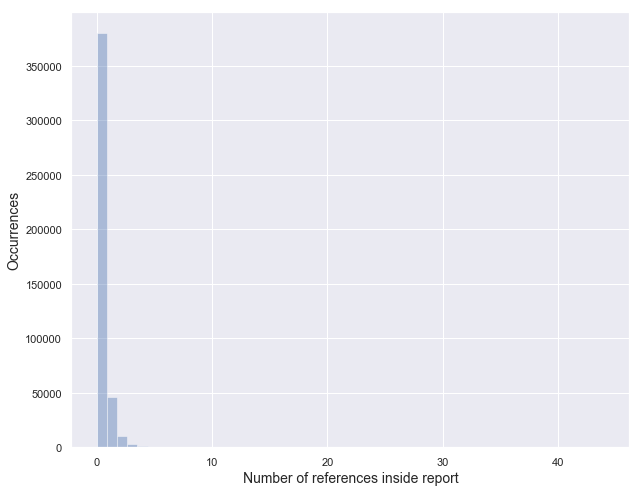

In [9]:
def f(text):
    references = re.findall('((\d{1,3}\.)*\d{3}\/[A-Z]{2})', text)
    references = np.unique(list(map(lambda r: r[0].replace('.', ''), references)))
    return len(references)
values = simplified_data['report'].apply(f).values

print(f'Minimum length: {min(values)}')
print(f'Maximum length: {max(values)}')

fig, ax = plt.subplots(figsize = (10, 8))
_ = sns.distplot(values, bins = None, kde = False)
_ = ax.set_xlabel('Number of references inside report', fontsize = 14)
_ = ax.set_ylabel('Occurrences', fontsize = 14)

# Exploratory Analysis

In [20]:
training_cases = pd.read_csv(data_path + '/training_cases.csv')

training_cases['references'] = training_cases['references'].str.replace('\'', '"').apply(json.loads)
training_cases['known_references'] = training_cases['known_references'].str.replace('\'', '"').apply(json.loads)

training_cases.head()
print(training_cases.shape)

,id,date,report,references,pdf_name,known_references
0,852890/SC,2018/05/17,RELATÓRIO\n O EXMO. SR. MIN...,"[360123/SP, 911250/PR]",EDcl no AgRg nos EDcl no AgRg nos EDcl no AgRg...,"[360123/SP, 911250/PR]"
1,448203/SP,2018/05/17,RELATÓRIO\nO EXMO. SR. MINISTRO REYNALDO SOARE...,"[315151/RS, 320818/SP, 365397/ES, 56302/SP, 61...",HC 448203 (2018_0102048-2 - 30_05_2018) (intei...,"[315151/RS, 320818/SP, 365397/ES, 56302/SP, 61..."
2,439582/SP,2018/05/17,RELATÓRIO\n MINISTRA MARIA THER...,"[126292/SP, 426058/SP, 430127/SP]",HC 439582 (2018_0050840-5 - 01_06_2018) (intei...,[426058/SP]
3,1160375/SP,2018/05/17,RELATÓRIO\n O EXMO. SR. MINISTRO MAUR...,[],AgInt nos EDcl no AREsp 1160375 (2017_0215668-...,[]
4,437873/SP,2018/05/17,RELATÓRIO\nO EXMO. SR. MINISTRO REYNALDO SOARE...,"[103963/SC, 109956/PR, 117268/SP, 121399/SP, 2...",AgRg no HC 437873 (2018_0039410-2 - 30_05_2018...,"[103963/SC, 253802/MG, 259028/SP, 284176/RJ, 2..."


(400633, 6)


In [25]:
analysis_training_cases = training_cases.copy()

analysis_training_cases['clean_report'] = preprocess_text(analysis_training_cases['report'], 'clean_report')
analysis_training_cases['clean_report_without_nltk_stopwords'] = preprocess_text(analysis_training_cases['report'], 'clean_report_without_nltk_stopwords')
# analysis_training_cases['words'] = analysis_training_cases['report'].apply(lambda text: text_to_word_sequence(text))

analysis_training_cases.head()

,id,date,report,references,pdf_name,known_references,clean_report,clean_report_without_nltk_stopwords
0,852890/SC,2018/05/17,RELATÓRIO\n O EXMO. SR. MIN...,"[360123/SP, 911250/PR]",EDcl no AgRg nos EDcl no AgRg nos EDcl no AgRg...,"[360123/SP, 911250/PR]",relatório o exmo sr ministro antonio saldanha ...,relatório exmo sr ministro antonio saldanha pa...
1,448203/SP,2018/05/17,RELATÓRIO\nO EXMO. SR. MINISTRO REYNALDO SOARE...,"[315151/RS, 320818/SP, 365397/ES, 56302/SP, 61...",HC 448203 (2018_0102048-2 - 30_05_2018) (intei...,"[315151/RS, 320818/SP, 365397/ES, 56302/SP, 61...",relatório o exmo sr ministro reynaldo soares d...,relatório exmo sr ministro reynaldo soares fon...
2,439582/SP,2018/05/17,RELATÓRIO\n MINISTRA MARIA THER...,"[126292/SP, 426058/SP, 430127/SP]",HC 439582 (2018_0050840-5 - 01_06_2018) (intei...,[426058/SP],relatório ministra maria thereza de assis mour...,relatório ministra maria thereza assis moura r...
3,1160375/SP,2018/05/17,RELATÓRIO\n O EXMO. SR. MINISTRO MAUR...,[],AgInt nos EDcl no AREsp 1160375 (2017_0215668-...,[],relatório o exmo sr ministro mauro campbell ma...,relatório exmo sr ministro mauro campbell marq...
4,437873/SP,2018/05/17,RELATÓRIO\nO EXMO. SR. MINISTRO REYNALDO SOARE...,"[103963/SC, 109956/PR, 117268/SP, 121399/SP, 2...",AgRg no HC 437873 (2018_0039410-2 - 30_05_2018...,"[103963/SC, 253802/MG, 259028/SP, 284176/RJ, 2...",relatório o exmo sr ministro reynaldo soares d...,relatório exmo sr ministro reynaldo soares fon...


In [ ]:
\item Text lengths' distribution.
\item Top words distribution (unigrams, bigrams, etc) before and after removing stopwords / processing.
\item Top part-of-speech tags distribution.
\item Cosine similarity distribution for the BoW and TF-IDF representations between cases and their references.

In [ ]:
# Plotly
# training_cases['references'].iplot(
#     kind = 'hist',
#     bins = 100,
#     xTitle = 'Number of references',
#     linecolor = 'black',
#     yTitle = 'Occurrences',
#     title = 'Review Text Word Count Distribution'
# )

## Number of references

Minimum: 0
Maximum: 120
Mean: 3.8334435755417053
Median 3.0
Percentile (90): 9.0


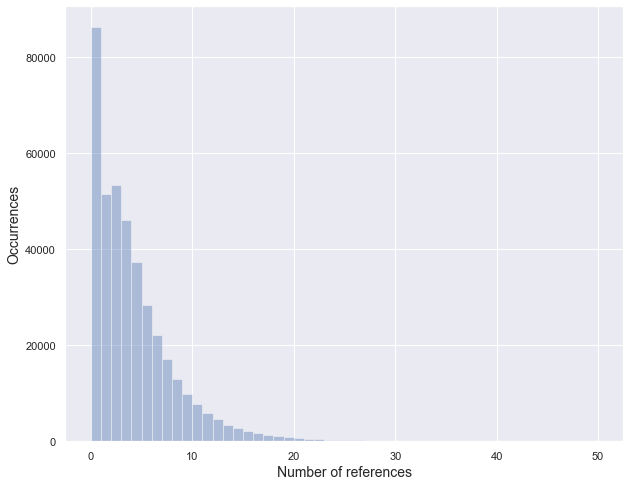

In [31]:
values = analysis_training_cases['references'].apply(lambda r: len(r)).values

print(f'Minimum: {min(values)}')
print(f'Maximum: {max(values)}')

print(f'Mean: {np.mean(values)}')
print(f'Median {np.median(values)}')

print(f'Percentile (90): {np.percentile(values, 90)}')

values = list(map(lambda v: min(v, 50), values))

fig, ax = plt.subplots(figsize = (10, 8))
_ = sns.distplot(values, bins = None, kde = False)
_ = ax.set_xlabel('Number of references', fontsize = 14)
_ = ax.set_ylabel('Occurrences', fontsize = 14)

# plt.savefig(os.path.expanduser('~/Desktop/AI/Jurisprudence/facts_length_distribution.png'))
# plt.show()

## Number of known references

In [8]:
analysis_training_cases.shape
analysis_training_cases['known_references'].apply(lambda x: len(x) != 0).sum()
analysis_training_cases['known_references'].apply(lambda x: len(x) == 0).sum()



values = analysis_training_cases['known_references'].apply(lambda r: len(r)).values

print(f'Minimum: {min(values)}')
print(f'Maximum: {max(values)}')

print(f'Mean: {np.mean(values)}')
print(f'Median {np.median(values)}')

print(f'Percentile (90): {np.percentile(values, 90)}')

values = list(map(lambda v: min(v, 50), values))

fig, ax = plt.subplots(figsize = (10, 8))
_ = sns.distplot(values, bins = None, kde = False)
_ = ax.set_xlabel('Number of known references', fontsize = 14)
_ = ax.set_ylabel('Occurrences', fontsize = 14)

# plt.savefig(os.path.expanduser('~/Desktop/AI/Jurisprudence/facts_length_distribution.png'))
# plt.show()

(430633, 6)

312144

118489

## Number of words
(decide maximum sequence length)

In [28]:
def plot_number_of_words(data):
    values = data.apply(lambda r: len(re.split('\W+', r))).values
    
    print(f'Minimum: {min(values)}')
    print(f'Maximum: {max(values)}')
    
    print(f'Mean: {np.mean(values)}')
    print(f'Median {np.median(values)}')
    
    p = 99
    print(f'Percentile ({p}): {np.percentile(values, p)}')
    
    values = list(map(lambda v: min(v, 1000), values))
    
    fig, ax = plt.subplots(figsize = (10, 8))
    _ = sns.distplot(values, bins = None, kde = False)
    _ = ax.set_xlabel('Number of words', fontsize = 14)
    _ = ax.set_ylabel('Occurrences', fontsize = 14)

Minimum: 5
Maximum: 14917
Mean: 284.98442964009456
Median 249.0
Percentile (99): 748.0


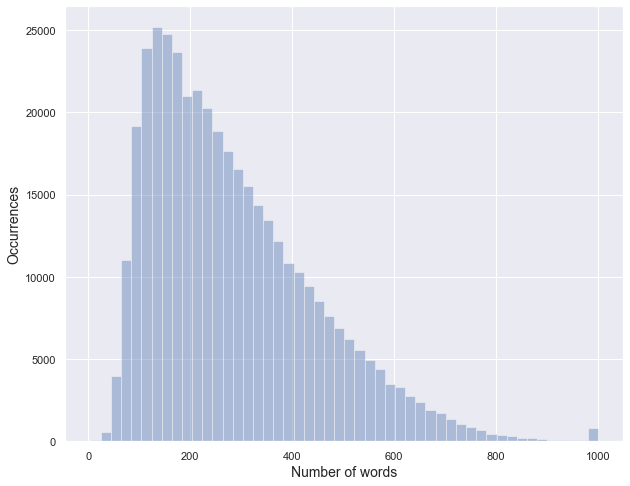

In [29]:
plot_number_of_words(analysis_training_cases['report'])

Minimum: 4
Maximum: 14916
Mean: 283.9840727049444
Median 248.0
Percentile (99): 747.0


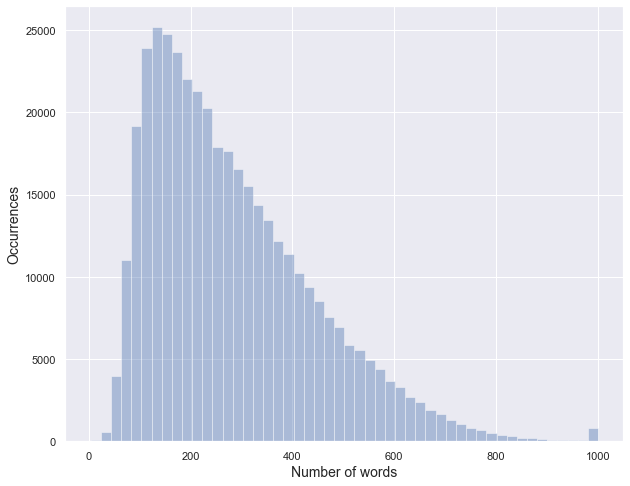

In [30]:
plot_number_of_words(analysis_training_cases['clean_report'])

## Text length

In [34]:
def plot_text_lengths(data):
    values = data.apply(lambda r: len(r)).values
    
    print(f'Minimum: {min(values)}')
    print(f'Maximum: {max(values)}')
    
    print(f'Mean: {np.mean(values)}')
    print(f'Median {np.median(values)}')
    
    p = 99
    print(f'Percentile ({p}): {np.percentile(values, p)}')
    
    values = list(map(lambda v: min(v, 10000), values))
    
    fig, ax = plt.subplots(figsize = (10, 8))
    _ = sns.distplot(values, bins = None, kde = False)
    _ = ax.set_xlabel('Number of words', fontsize = 14)
    _ = ax.set_ylabel('Occurrences', fontsize = 14)

Minimum: 41
Maximum: 114114
Mean: 2143.1493960807024
Median 1813.0
Percentile (99): 5941.0


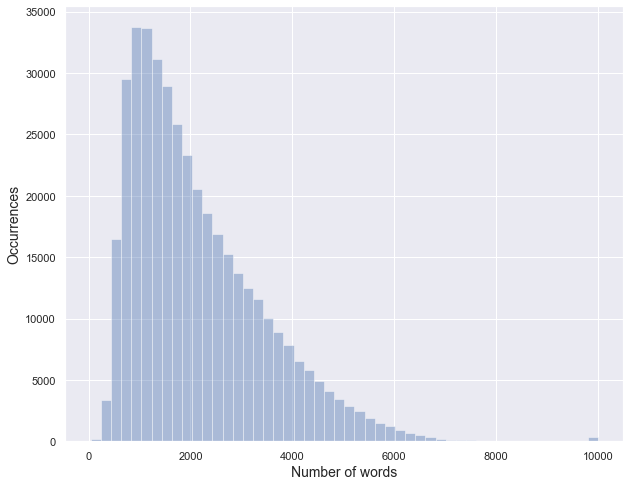

In [35]:
plot_text_lengths(analysis_training_cases['report'])

Minimum: 23
Maximum: 91382
Mean: 1714.8642997456525
Median 1495.0
Percentile (99): 4467.679999999993


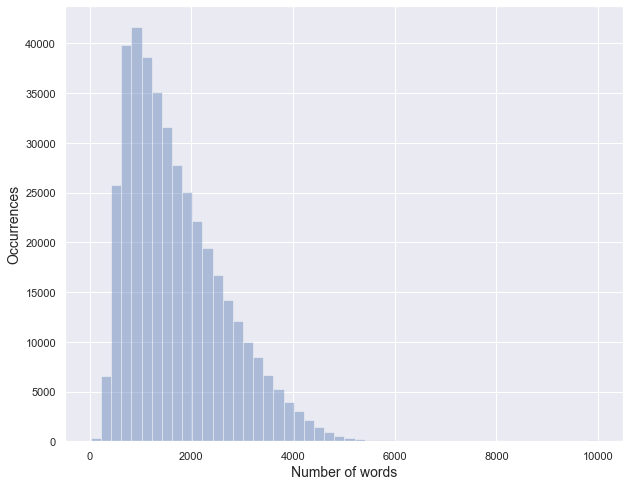

In [36]:
plot_text_lengths(analysis_training_cases['clean_report'])

## Word counts
(decide vocabulary size)

In [64]:
tokenizer = get_tokenizer(texts = training_data['clean_report'])

Maximum vocabulary size: 306171
Minimum sentence length: 4
Maximum sentence length: 14945


In [76]:
word_counts = sorted(
    list(tokenizer.word_counts.items()),
    key = lambda x: x[1],
    reverse = True
)

def print_word_count(n):
    print(f'{n} => {word_counts[n - 1]}')

print_word_count(len(word_counts))
print_word_count(20000)
print_word_count(10000)
print_word_count(5000)
print_word_count(2000)
print_word_count(1000)
print_word_count(100)
print_word_count(1)

306170 => ('it37924', 1)
20000 => ('inadimplida', 78)
10000 => ('demitiu', 402)
5000 => ('assertiva', 1524)
2000 => ('ª', 6071)
1000 => ('registro', 13895)
100 => ('ainda', 133383)
1 => ('de', 5869799)


## Top n-grams

In [51]:
def get_top_n_words(corpus, n = None, ngram_range = (1, 1)):
    count_vectorizer = CountVectorizer(ngram_range = ngram_range).fit(corpus)
    bag_of_words = count_vectorizer.transform(corpus)
    sum_words = bag_of_words.sum(axis = 0)
    words_freq = [(word, sum_words[0, idx]) for word, idx in count_vectorizer.vocabulary_.items()]
    words_freq = sorted(words_freq, key = lambda x: x[1], reverse = True)
    return words_freq[:n]

def print_ngrams(data, ngram_range, figsize = (20, 8)):
    common_words = get_top_n_words(data, n = 20, ngram_range = ngram_range)
    
    d = pd.DataFrame(common_words, columns = ['text' , 'count'])
    
    fig, ax = plt.subplots(1, 1, figsize = figsize)
    _ = sns.barplot(x = d['text'], y = d['count'])
    _ = ax.set_xlabel('Unigrams', fontsize = 14)
    _ = ax.set_ylabel('Count', fontsize = 14)

def print_unigrams(data):
    print_ngrams(data, ngram_range = (1, 1))

def print_bigrams(data):
    print_ngrams(data, ngram_range = (2, 2), figsize = (40, 8))

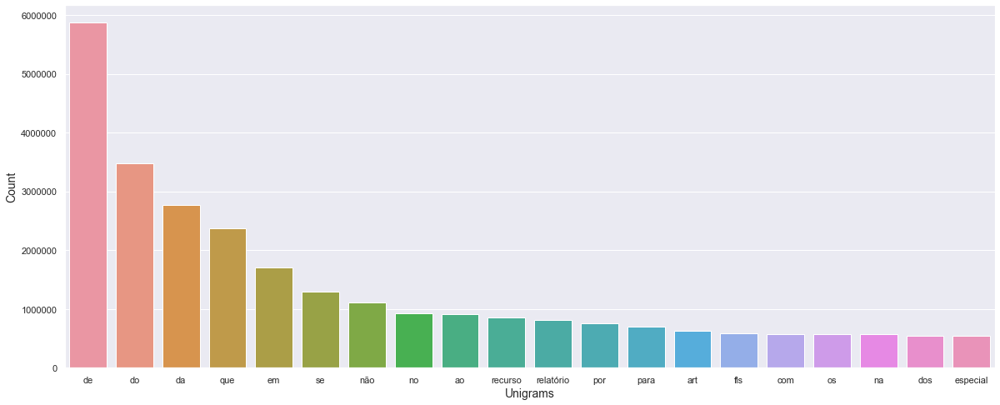

In [39]:
print_unigrams(analysis_training_cases['report'])

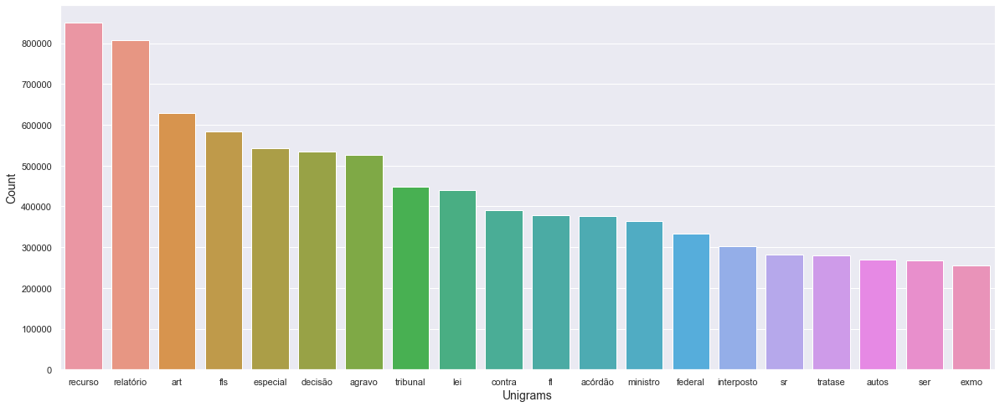

In [42]:
print_unigrams(analysis_training_cases['clean_report_without_nltk_stopwords'])

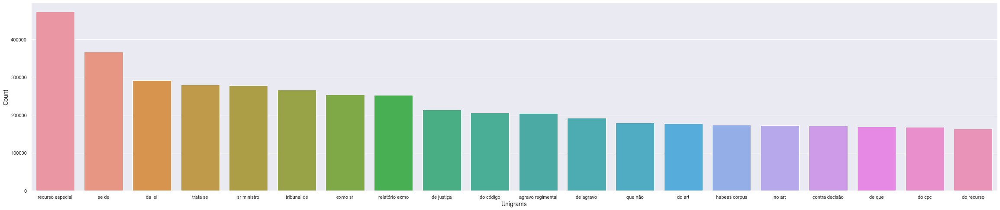

In [53]:
print_bigrams(analysis_training_cases['report'])

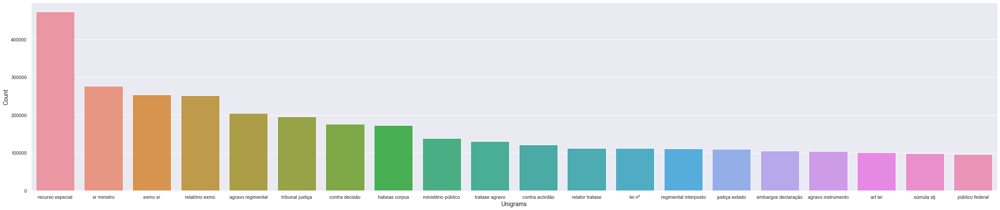

In [52]:
print_bigrams(analysis_training_cases['clean_report_without_nltk_stopwords'])

In [ ]:
# # documentA = text_to_word_sequence('aaa aaa fff  ggg ')
# documentA = 'aaa aaa fff fff fff ggg'
# documentB = 'aaa aaa aaa fff fff fff bbb ccc ddd eee'
# documentC = 'fff fff fff hhh'
# documentD = 'fff fff fff iii'

# vectorizer = TfidfVectorizer()

# vectors = vectorizer.fit_transform([documentA, documentB, documentC, documentD])

# feature_names = vectorizer.get_feature_names()
# denselist = vectors.todense().tolist()

# df = pd.DataFrame(denselist, columns = feature_names)
# df

## POS tagging

# Experiments

## Naive Bayes

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-03-17T19-49-44.915636
Epoch 1/10
Steps: 2000 - val_accuracy: 0.5043666666666666 - val_precision: 0.5043536058491193 - val_recall: 0.5058666666666667
Epoch 2/10
Steps: 2000 - val_accuracy: 0.5100666666666667 - val_precision: 0.510300136425648 - val_recall: 0.4987333333333333
Epoch 3/10
Steps: 2000 - val_accuracy: 0.5104666666666666 - val_precision: 0.5105909336211549 - val_recall: 0.5046
Epoch 4/10
Steps: 2000 - val_accuracy: 0.5093 - val_precision: 0.5092882349024569 - val_recall: 0.5099333333333333
Epoch 5/10
Steps: 2000 - val_accuracy: 0.5085 - val_precision: 0.5085085085085085 - val_recall: 0.508
Epoch 6/10
Steps: 2000 - val_accuracy: 0.5068666666666667 - val_precision: 0.5068420353394447 - val_recall: 0.5086666666666667
Epoch 7/10
Steps: 2000 - val_accuracy: 0.5089333333333333 - val_precision: 0.508927381745503 - val_recall: 0.5092666666666666
Epoch 8/10
Steps: 2000 - val_accuracy: 0.5068 - val_precision: 0.5067043512554227 -

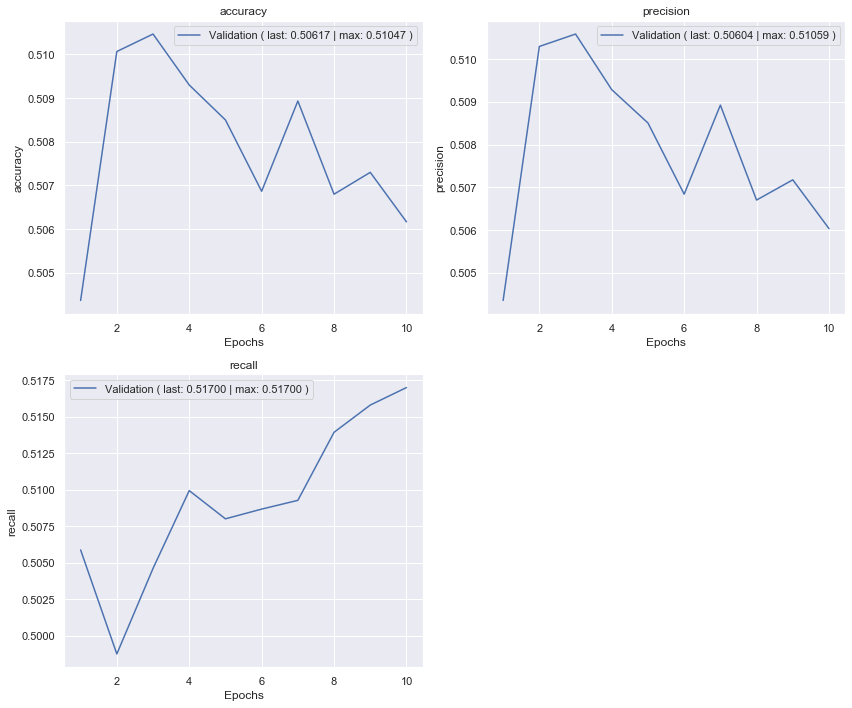

Validation confusion matrix


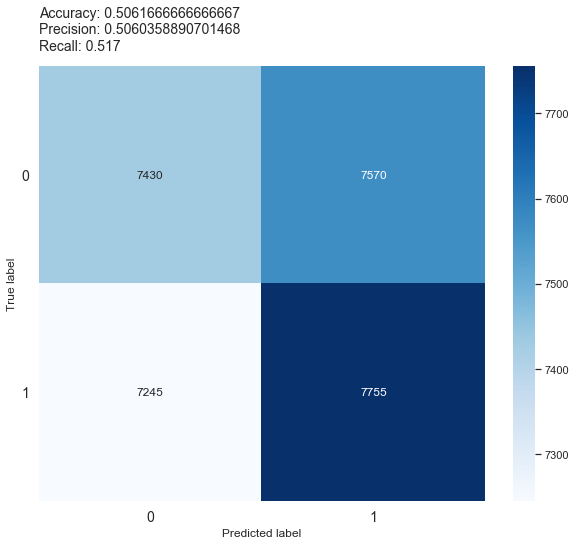

Training time: 1:19:15.766606


In [3]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'NB',
        'vocabulary_size': 10000,
        'alpha': 0.00001,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-03-17T21-09-00.698389
Epoch 1/10
Steps: 2000 - val_accuracy: 0.5043333333333333 - val_precision: 0.5043183630082381 - val_recall: 0.5060666666666667
Epoch 2/10
Steps: 2000 - val_accuracy: 0.5099 - val_precision: 0.5101289134438306 - val_recall: 0.4986
Epoch 3/10
Steps: 2000 - val_accuracy: 0.5104 - val_precision: 0.5105206366333963 - val_recall: 0.5046666666666667
Epoch 4/10
Steps: 2000 - val_accuracy: 0.5091666666666667 - val_precision: 0.5091550702443571 - val_recall: 0.5098
Epoch 5/10
Steps: 2000 - val_accuracy: 0.5085 - val_precision: 0.5085085085085085 - val_recall: 0.508
Epoch 6/10
Steps: 2000 - val_accuracy: 0.5068666666666667 - val_precision: 0.5068411264612115 - val_recall: 0.5087333333333334
Epoch 7/10
Steps: 2000 - val_accuracy: 0.5089666666666667 - val_precision: 0.5089624841740521 - val_recall: 0.5092
Epoch 8/10
Steps: 2000 - val_accuracy: 0.5067666666666667 - val_precision: 0.5066710483075912 - val_recall: 0.5139333

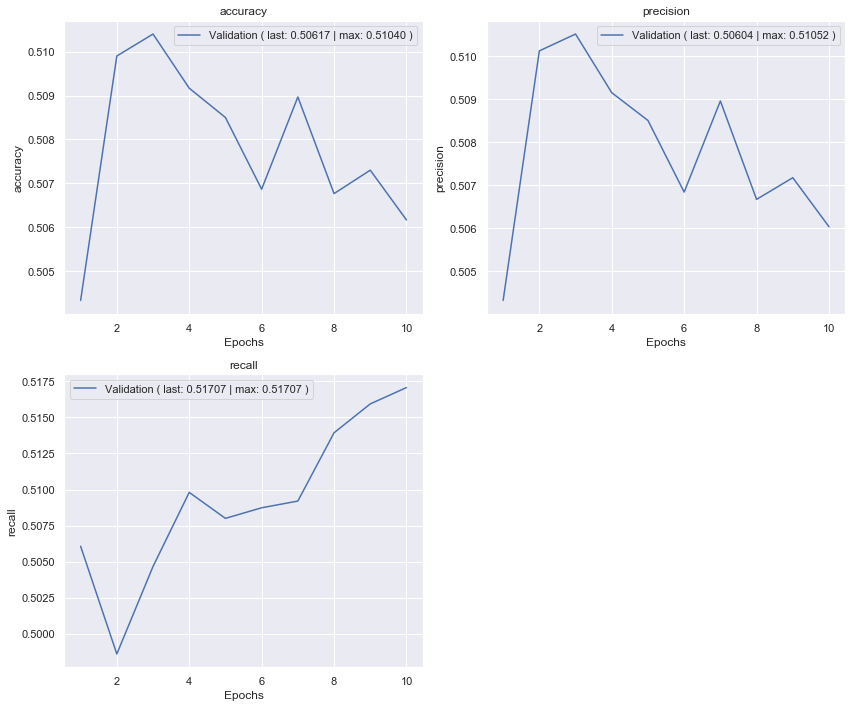

Validation confusion matrix


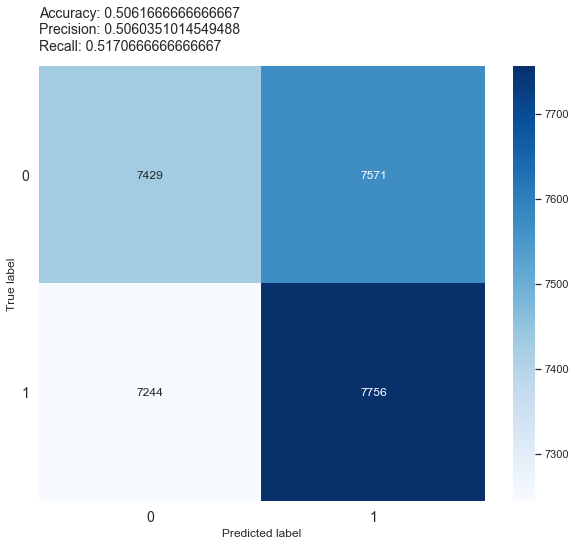

Training time: 1:20:03.882208


In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'NB',
        'vocabulary_size': 10000,
        'alpha': 0.5,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-03-17T22-29-04.599794
Epoch 1/10
Steps: 2000 - val_accuracy: 0.5043333333333333 - val_precision: 0.5043126326963907 - val_recall: 0.5067333333333334
Epoch 2/10
Steps: 2000 - val_accuracy: 0.5101666666666667 - val_precision: 0.5103889910756864 - val_recall: 0.49946666666666667
Epoch 3/10
Steps: 2000 - val_accuracy: 0.5106 - val_precision: 0.5107215104517869 - val_recall: 0.5049333333333333
Epoch 4/10
Steps: 2000 - val_accuracy: 0.5092333333333333 - val_precision: 0.5092204247386991 - val_recall: 0.5099333333333333
Epoch 5/10
Steps: 2000 - val_accuracy: 0.5083666666666666 - val_precision: 0.5083739240675252 - val_recall: 0.5079333333333333
Epoch 6/10
Steps: 2000 - val_accuracy: 0.5067 - val_precision: 0.5066755230820326 - val_recall: 0.5085333333333333
Epoch 7/10
Steps: 2000 - val_accuracy: 0.5090666666666667 - val_precision: 0.5090582123351538 - val_recall: 0.5095333333333333
Epoch 8/10
Steps: 2000 - val_accuracy: 0.50693333333333

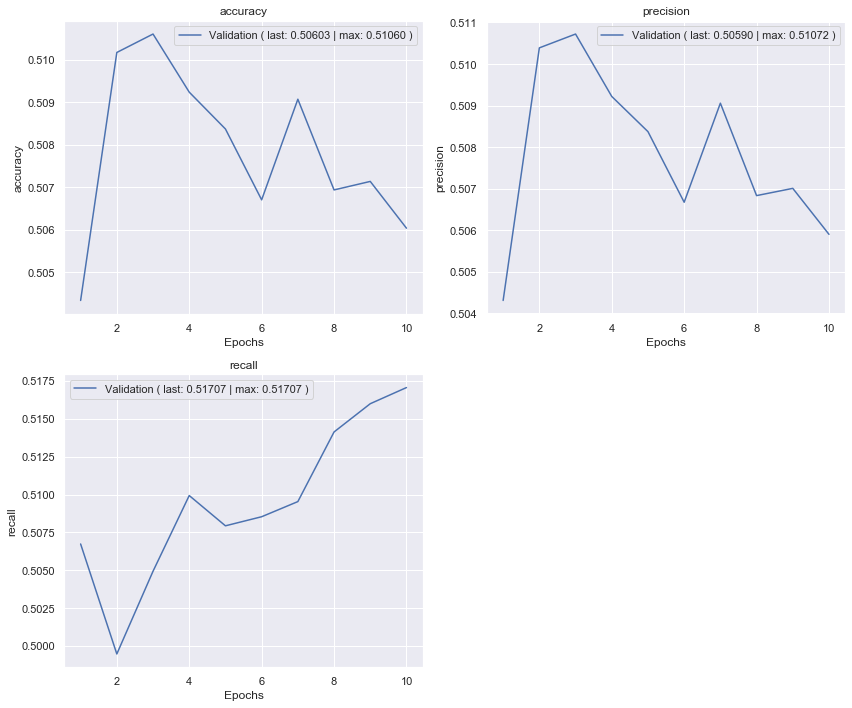

Validation confusion matrix


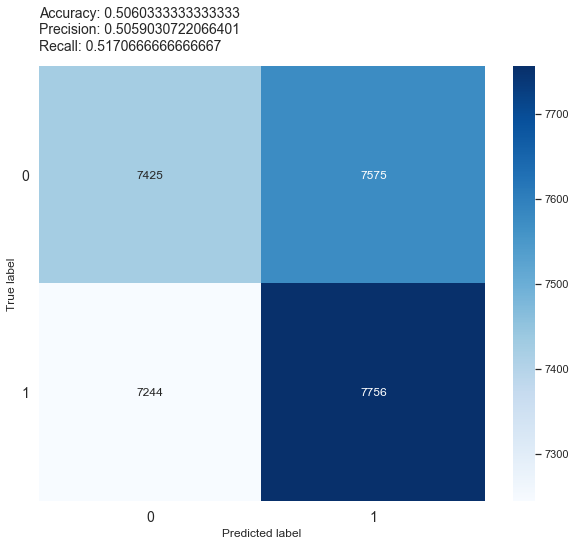

Training time: 1:21:25.529948


In [5]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'NB',
        'vocabulary_size': 10000,
        'alpha': 2,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-03-17T23-50-30.150731
Epoch 1/10
Steps: 2000 - val_accuracy: 0.49133333333333334 - val_precision: 0.49266614013313775 - val_recall: 0.5822
Epoch 2/10
Steps: 2000 - val_accuracy: 0.5088666666666667 - val_precision: 0.5083890500819982 - val_recall: 0.5373333333333333
Epoch 3/10
Steps: 2000 - val_accuracy: 0.5075 - val_precision: 0.5072277545775778 - val_recall: 0.5263333333333333
Epoch 4/10
Steps: 2000 - val_accuracy: 0.5062666666666666 - val_precision: 0.5060403547101915 - val_recall: 0.525
Epoch 5/10
Steps: 2000 - val_accuracy: 0.5073 - val_precision: 0.5071080817916261 - val_recall: 0.5208
Epoch 6/10
Steps: 2000 - val_accuracy: 0.5064333333333333 - val_precision: 0.5062568890617908 - val_recall: 0.5205333333333333
Epoch 7/10
Steps: 2000 - val_accuracy: 0.5066666666666667 - val_precision: 0.5065155069064373 - val_recall: 0.5182666666666667
Epoch 8/10
Steps: 2000 - val_accuracy: 0.5054333333333333 - val_precision: 0.50526044019879

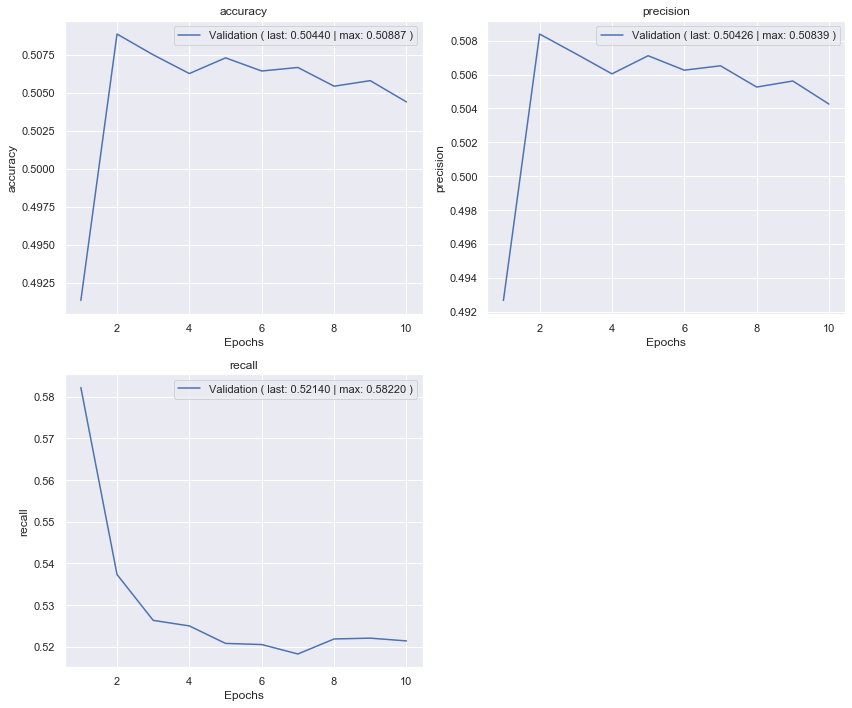

Validation confusion matrix


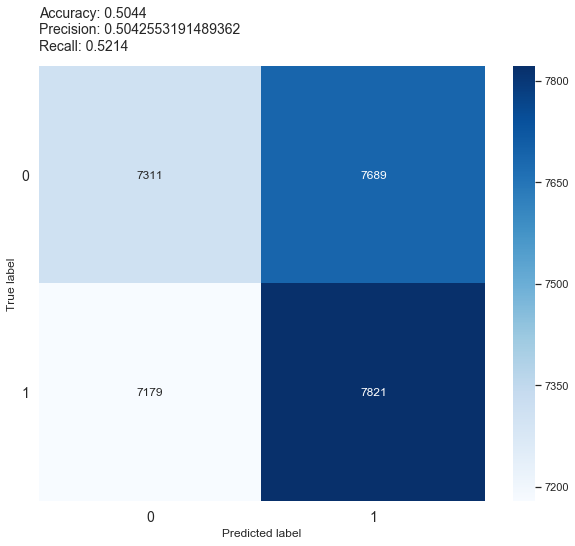

Training time: 1:39:11.705018


In [6]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'NB',
        'vocabulary_size': 10000,
        'alpha': 100,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-04-22T19-09-33.413198
Skipping training
Training times
training_time: 1:23:30.370207


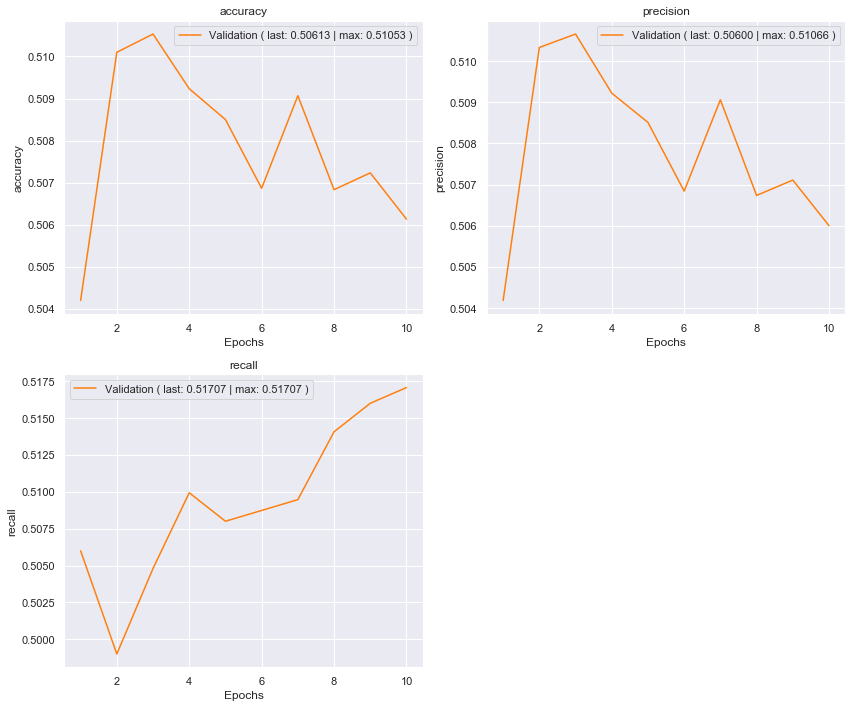

Validation confusion matrix


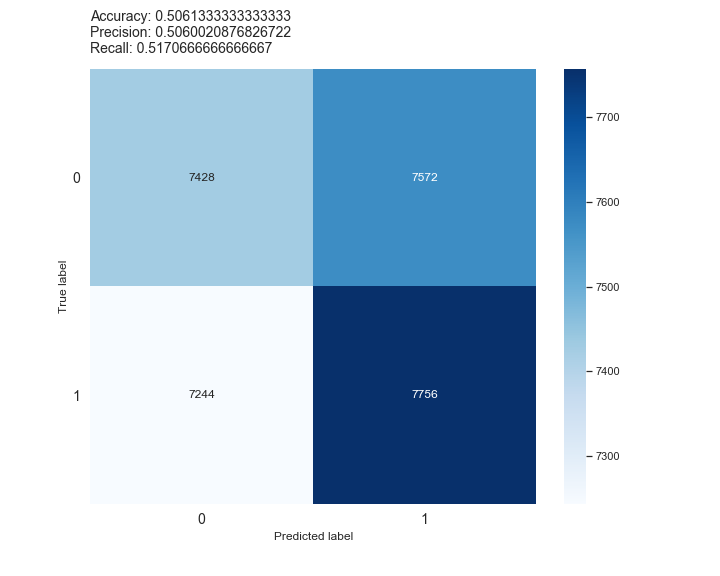

In [2]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'NB',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10,
        'previous_model_folder': '2020-04-22T19-09-33.413198'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-01-26T16-15-25.169634
Skipping training
Training times
training_time: 1:37:35.595827


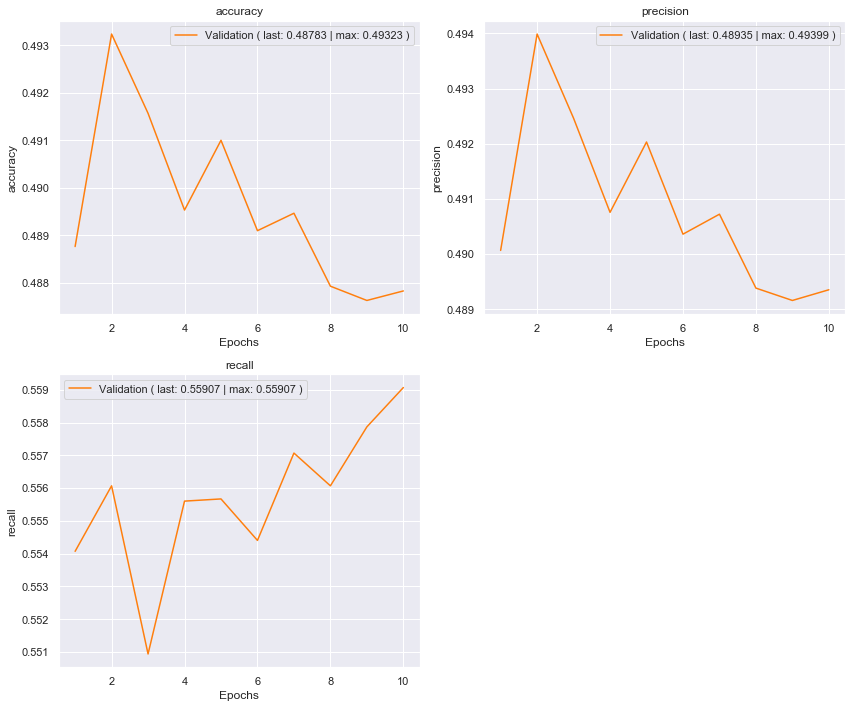

Validation confusion matrix


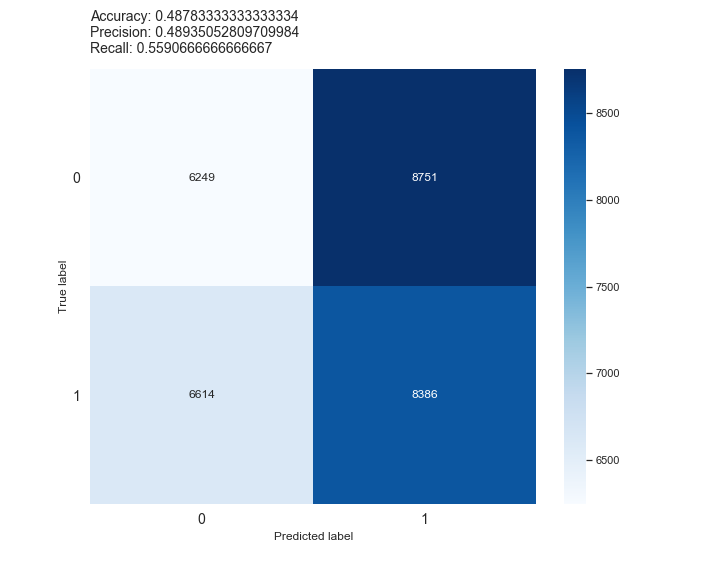

In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'NB',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10,
        'previous_model_folder': '2021-01-26T16-15-25.169634'
    }
)

## CS

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-04-22T17-30-04.403390
Validation confusion matrix

Threshold: 0.1


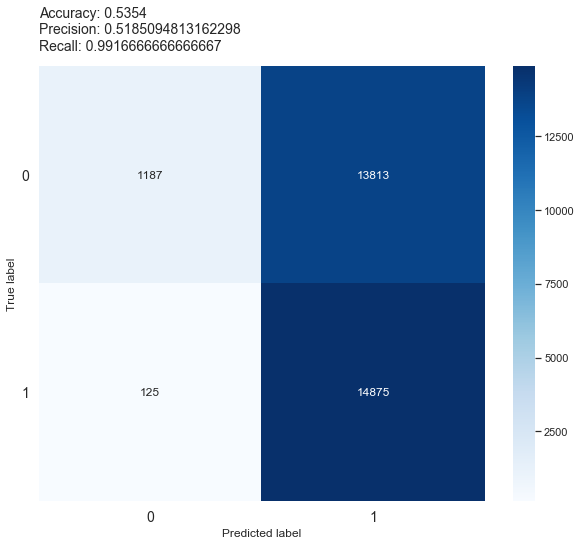

Threshold: 0.2


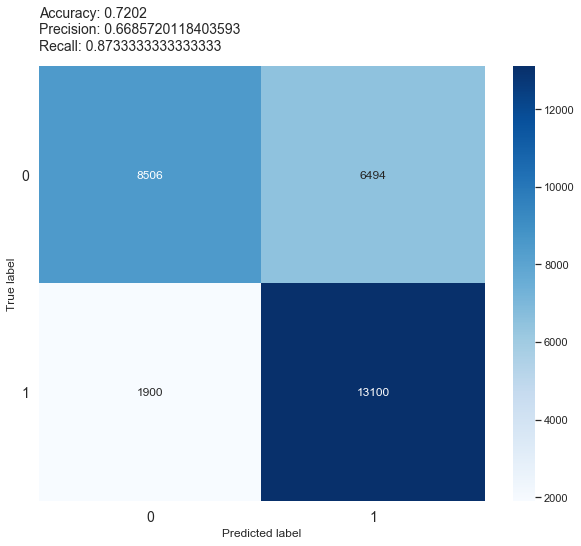

Threshold: 0.3


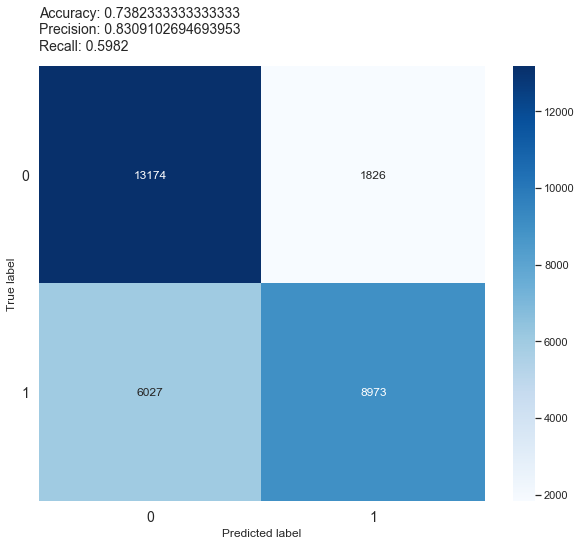

Threshold: 0.4


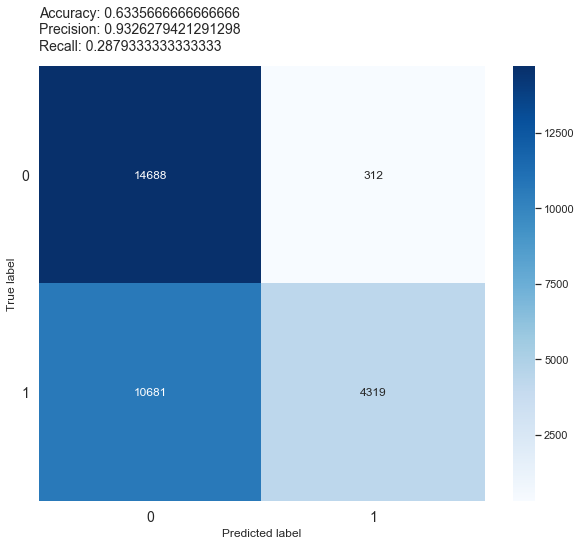

Threshold: 0.5


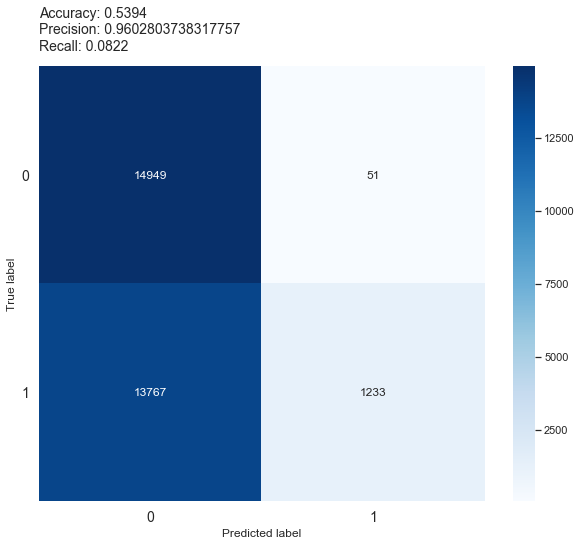

Threshold: 0.6


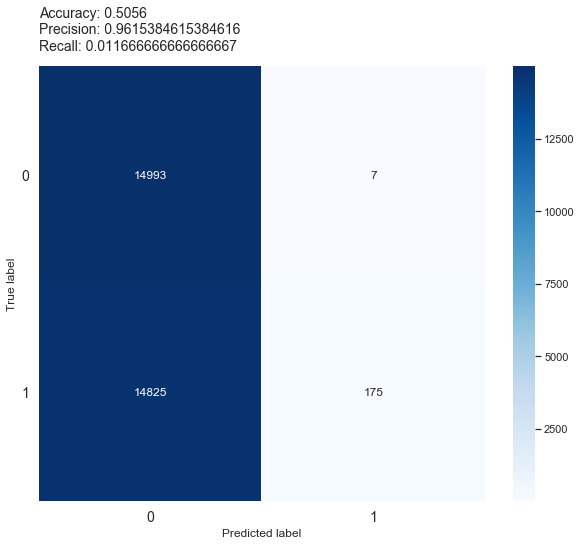

Threshold: 0.7


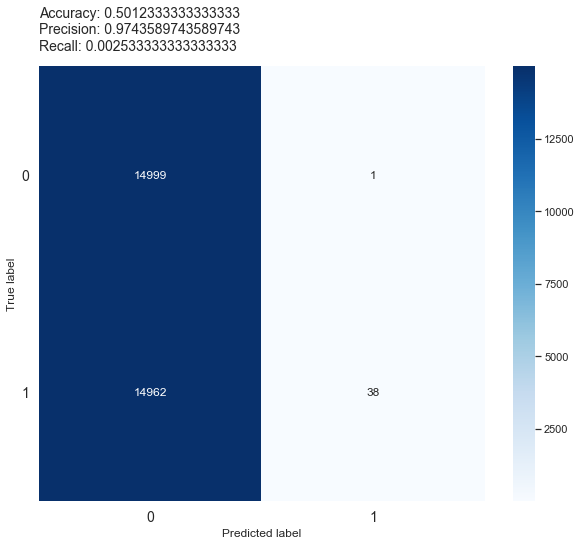

Threshold: 0.8


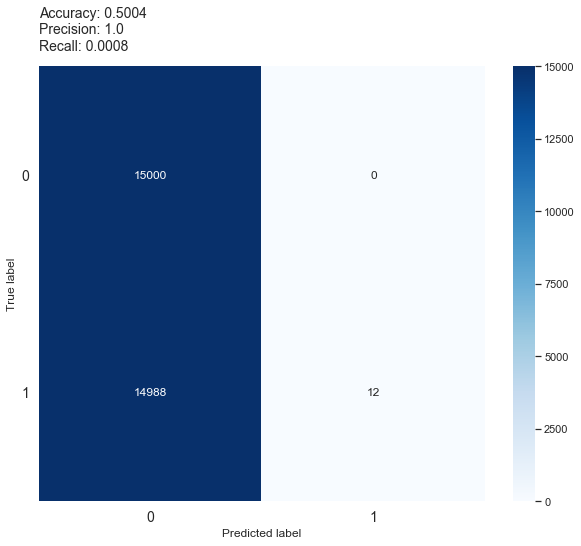

Threshold: 0.9


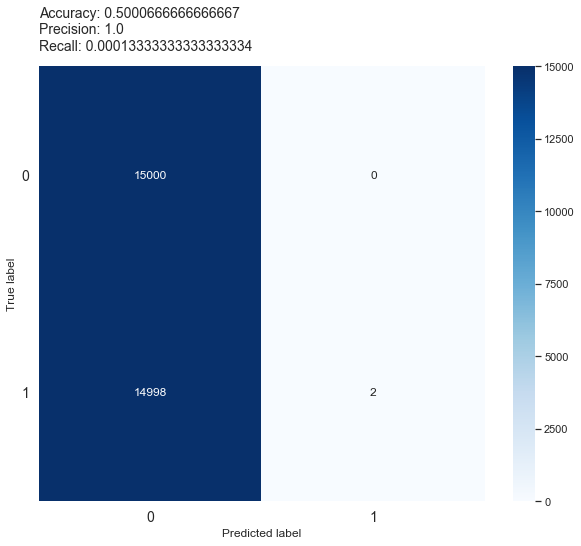

Training time: 0:22:12.287974


In [2]:
# 2020-04-22T17-30-04.403390
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'CS',
        'vocabulary_size': 10000,
        'validation_batch_size': 30000
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-04-22T18-06-21.124131
Validation confusion matrix

Threshold: 0.1


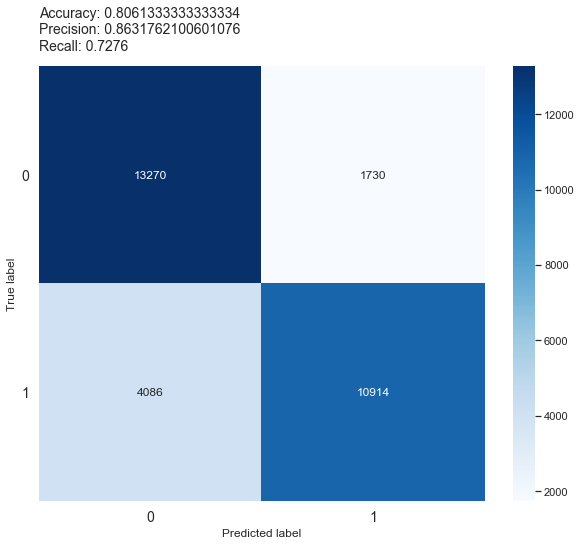

Threshold: 0.2


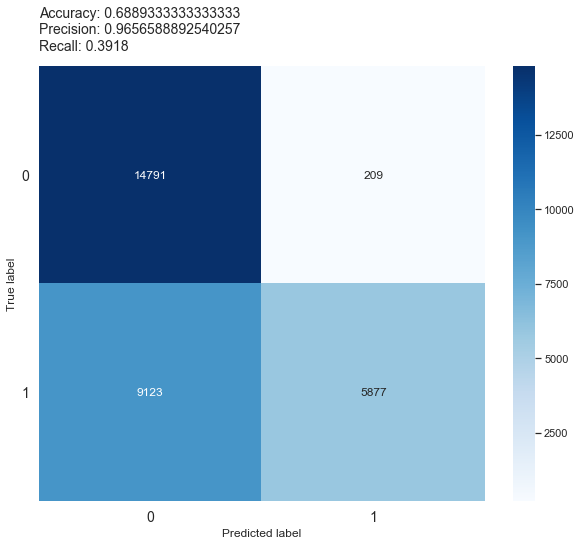

Threshold: 0.3


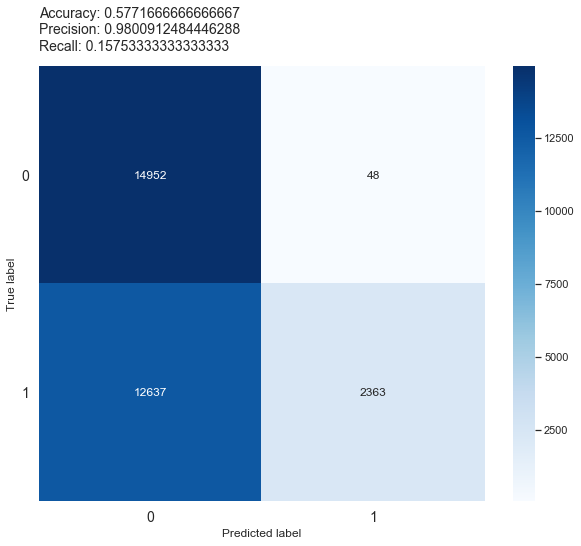

Threshold: 0.4


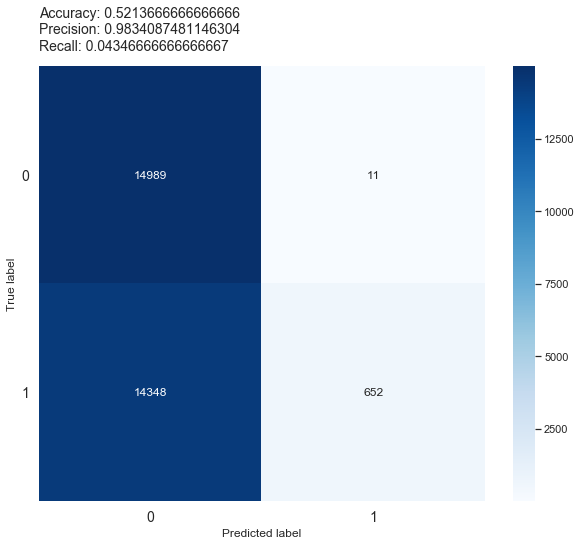

Threshold: 0.5


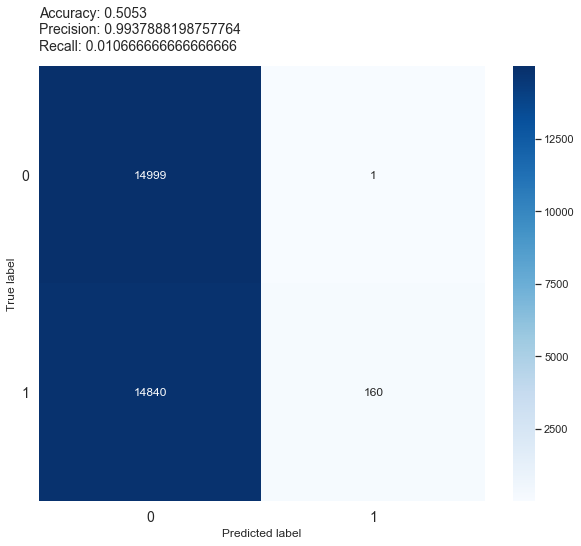

Threshold: 0.6


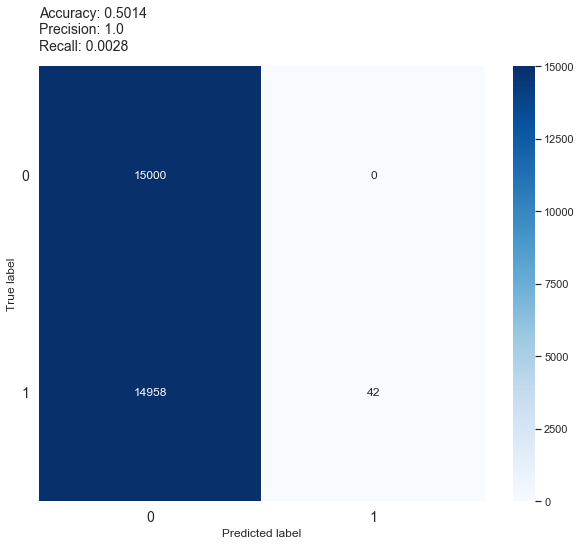

Threshold: 0.7


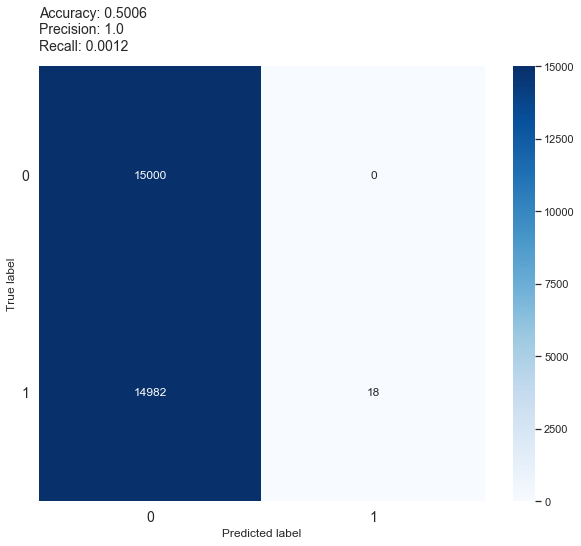

Threshold: 0.8


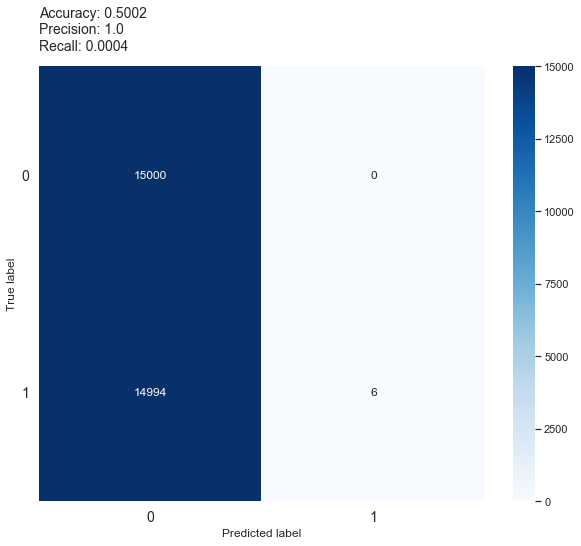

Threshold: 0.9


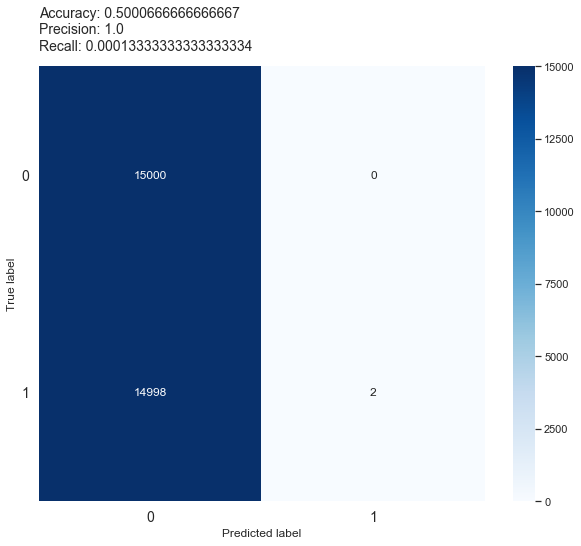

Training time: 0:23:47.361833


In [2]:
# 2020-04-22T18-06-21.124131
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'CS',
        'vocabulary_size': 10000,
        'validation_batch_size': 30000
    }
)

## LR

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-03-16T20-56-54.384098
Skipping training
Minimum val_loss: 0.7897517085075378 - Epoch: 1
Training times
training_time (0 => 20): 2:24:51.420629


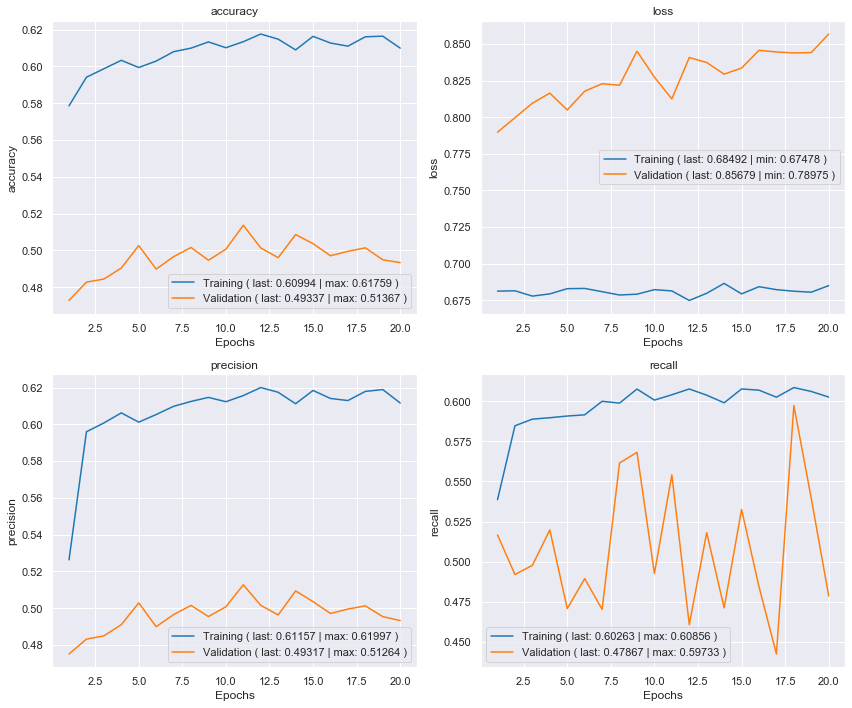

Validation confusion matrix


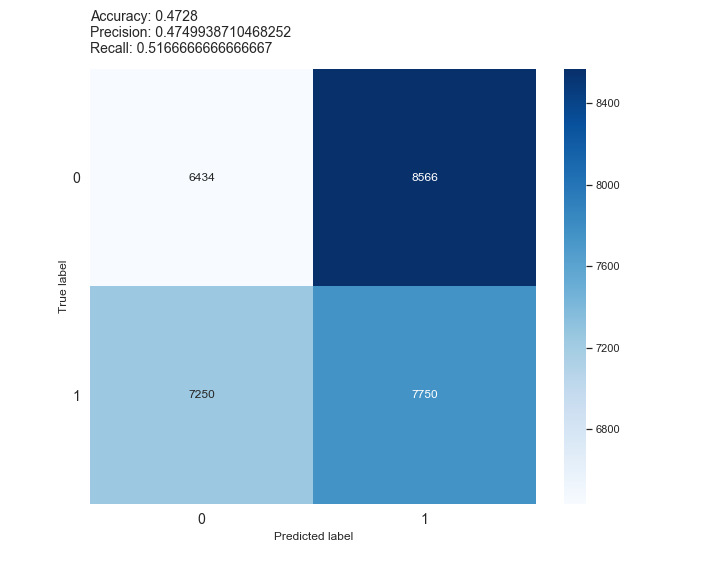

In [5]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'LR',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 20,
        'previous_model_folder': '2021-03-16T20-56-54.384098'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-03-16T23-21-45.819210
Skipping training
Minimum val_loss: 0.7041077017784119 - Epoch: 1
Training times
training_time (0 => 20): 3:01:04.498946


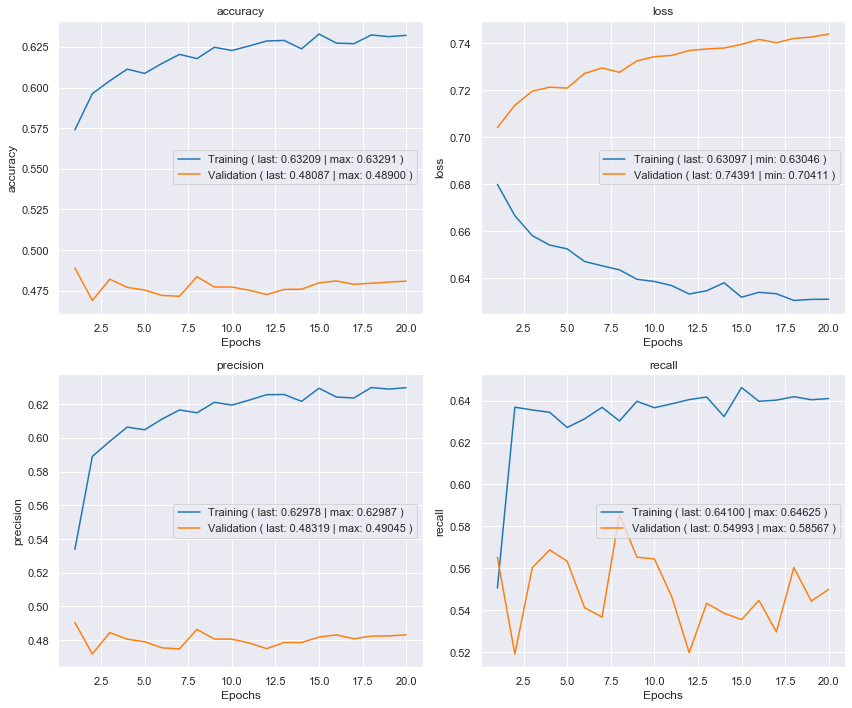

Validation confusion matrix


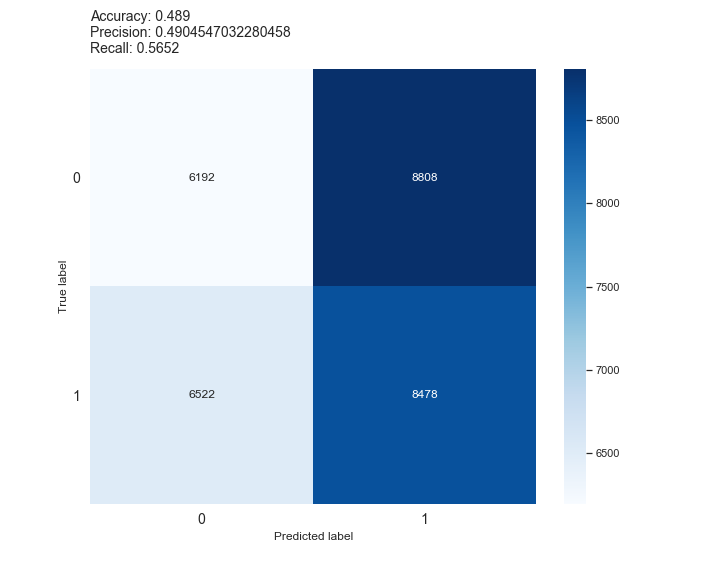

In [6]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'LR',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 20,
        'previous_model_folder': '2021-03-16T23-21-45.819210'
    }
)

## MLP

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-12T20-59-17.680974
Skipping training
Minimum val_loss: 0.38946625590324396 - Epoch: 20
Training times
training_time: 2:16:09.674853
training_time (20 => 30): 1:38:34.214918


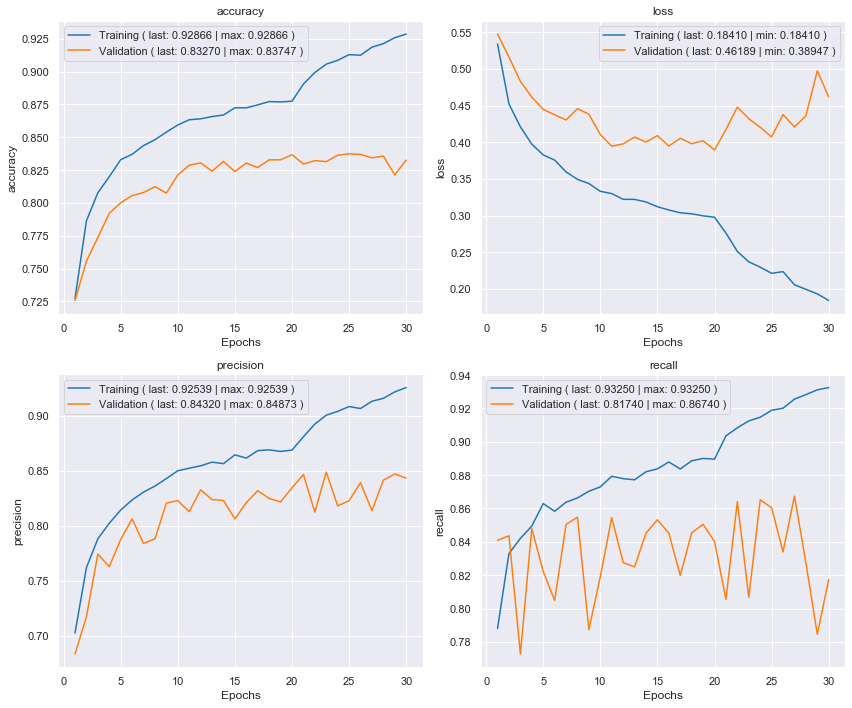

Validation confusion matrix


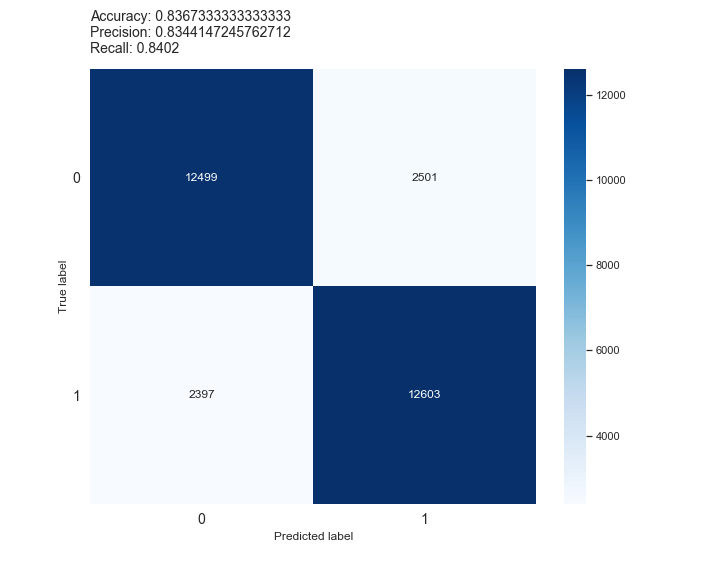

In [7]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'MLP',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 30,
        'previous_model_folder': '2021-02-12T20-59-17.680974'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-05-21T18-20-56.774052
Skipping training
Minimum val_loss: 0.3737531006336212 - Epoch: 10
Training times
training_time: 1:17:43.867679
training_time (10 => 20): 1:37:26.412679


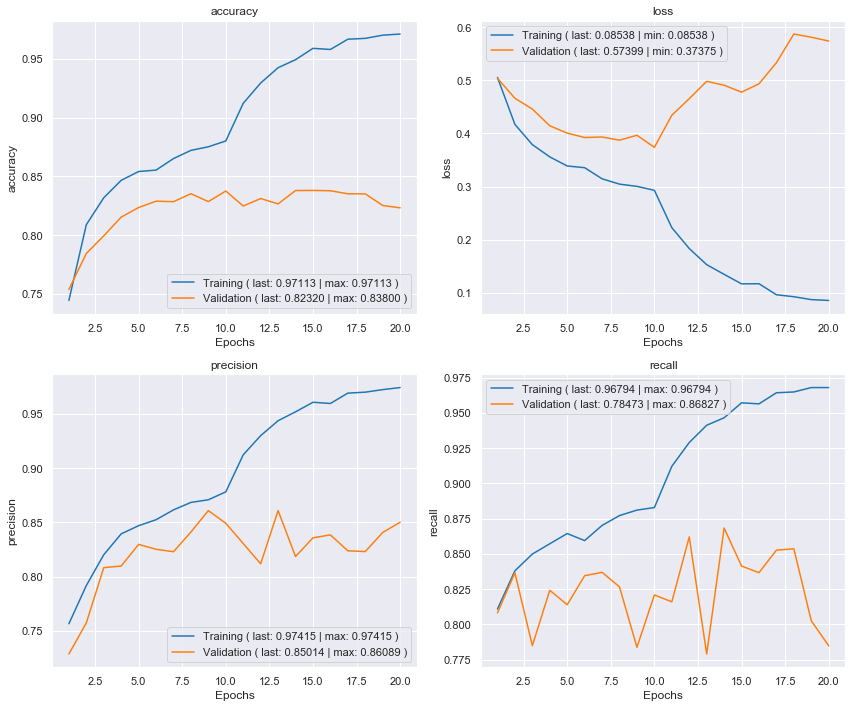

Validation confusion matrix


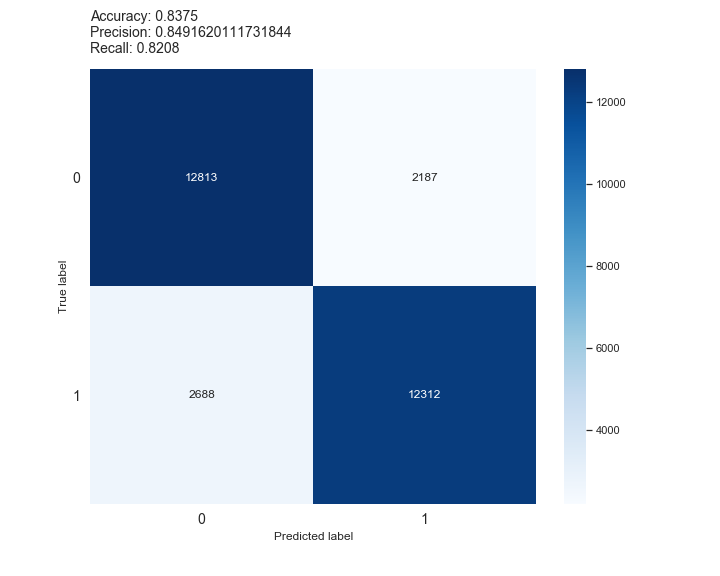

In [8]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'MLP',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 20,
        'previous_model_folder': '2020-05-21T18-20-56.774052'
    }
)

## -

## SNN + MLP

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-14T22-41-27.175503
Skipping training
Minimum val_loss: 0.3934634327888489 - Epoch: 20
Training times
training_time (20): 2:38:16.199492
training_time (30): 1:28:29.650159


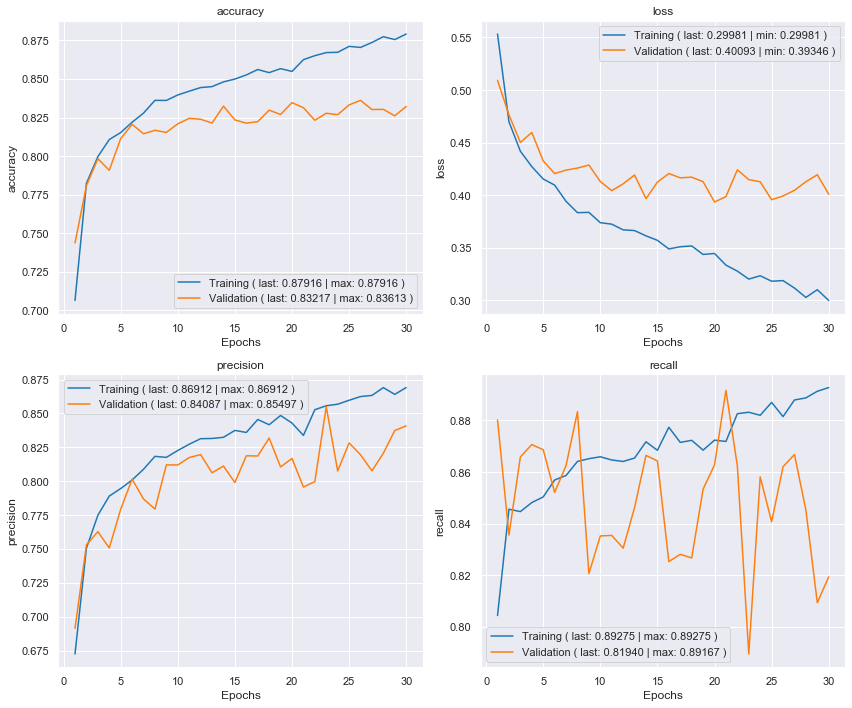

Validation confusion matrix


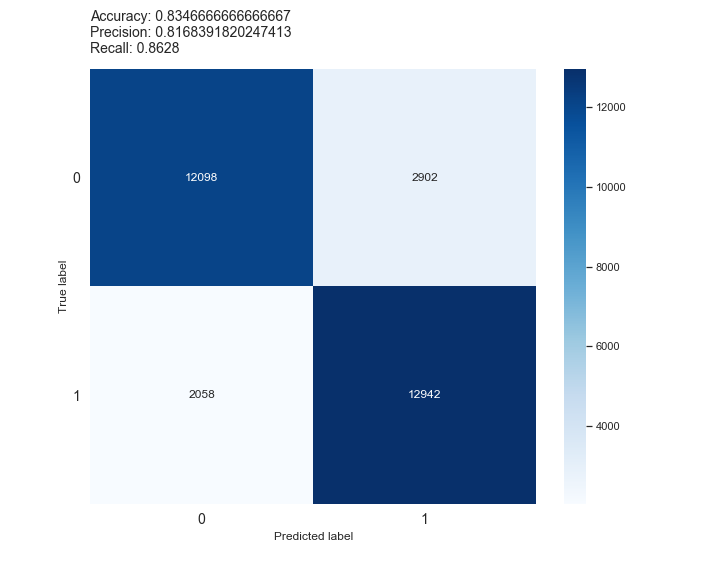

In [9]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 30,
        'previous_model_folder': '2021-02-14T22-41-27.175503'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-15T03-06-07.834443
Skipping training
Minimum val_loss: 0.3664770126342773 - Epoch: 15
Training times
training_time (20): 2:33:14.907348
training_time (30): 1:34:59.508089


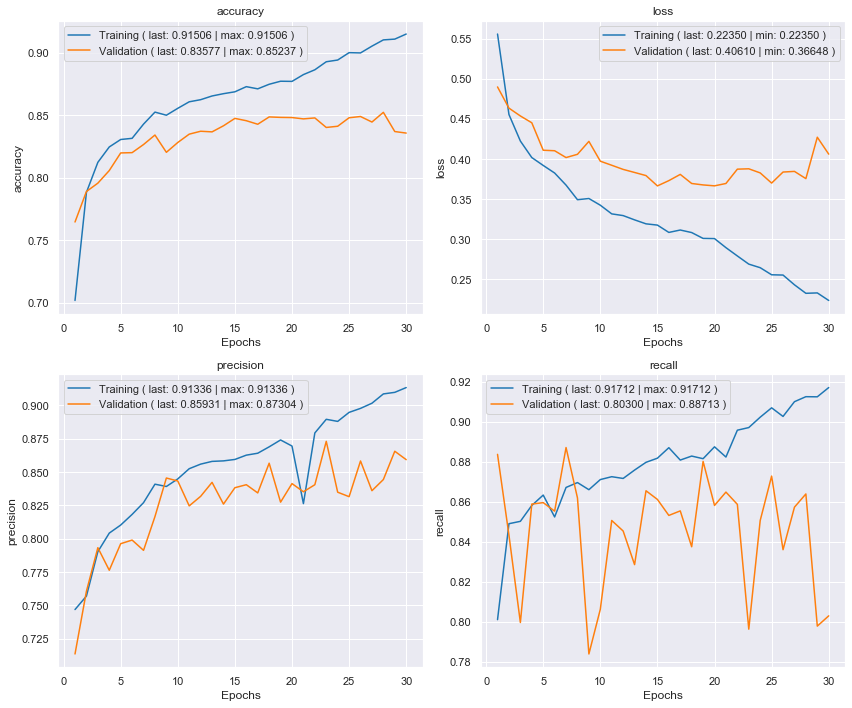

Validation confusion matrix


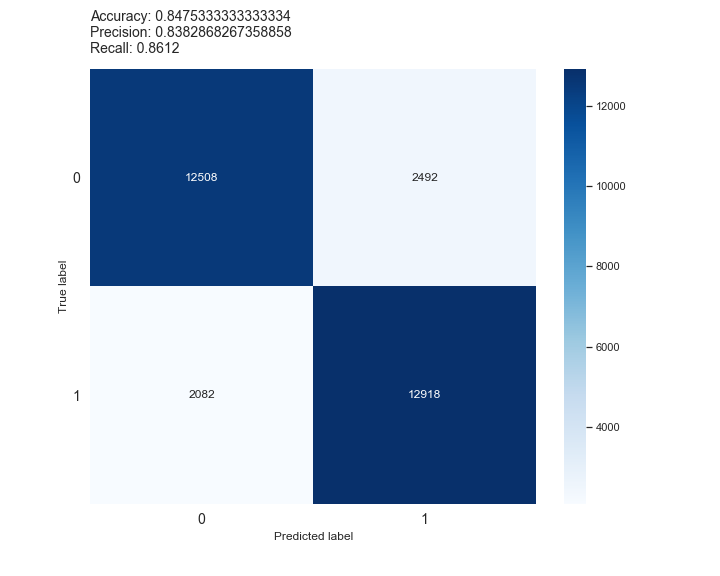

In [10]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 30,
        'previous_model_folder': '2021-02-15T03-06-07.834443'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-15T17-14-54.733575
Skipping training
Minimum val_loss: 0.4159237742424011 - Epoch: 26
Training times
training_time (20): 2:24:33.521969
training_time (30): 1:18:17.896617
training_time (30 => 40): 1:18:13.925470


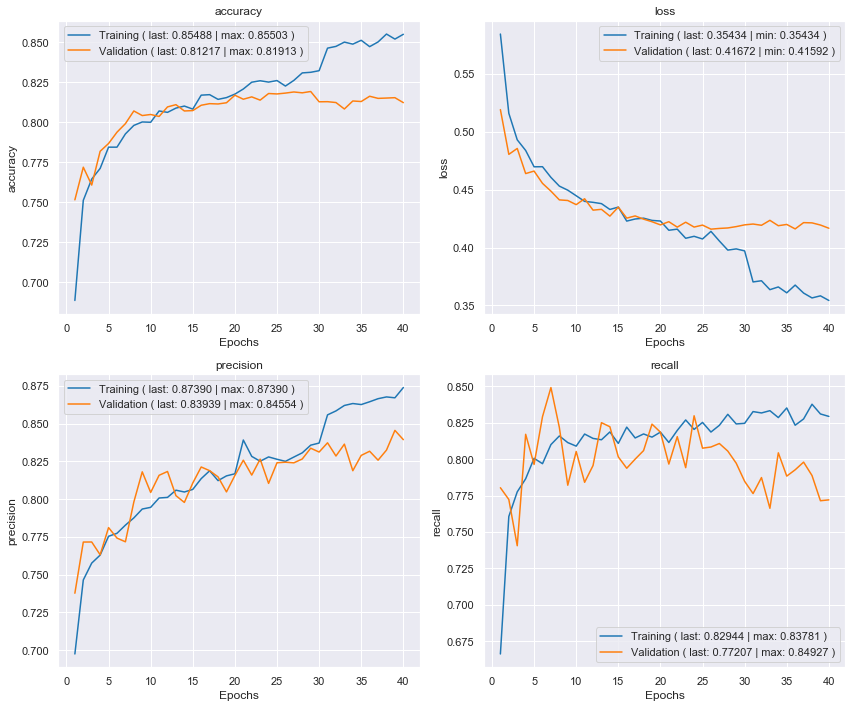

Validation confusion matrix


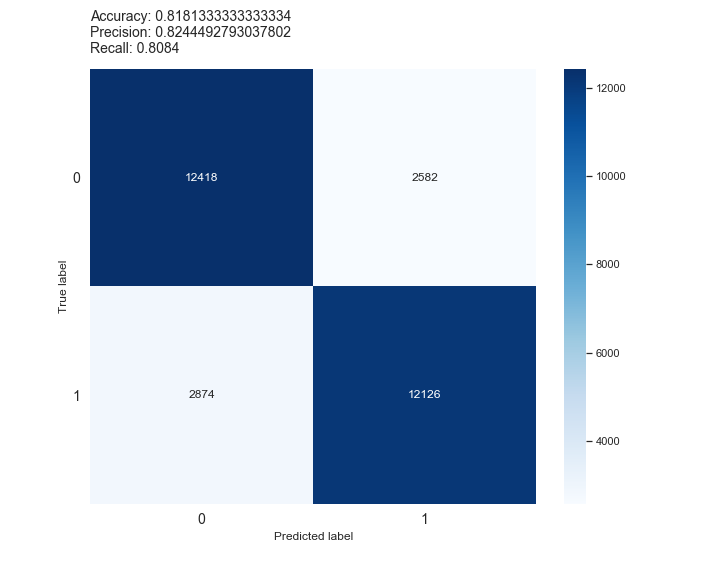

In [11]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'BoW',
        'type': 'SNN + MLP',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 40,
        'previous_model_folder': '2021-02-15T17-14-54.733575'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-15T19-39-28.272547
Skipping training
Minimum val_loss: 0.39113008975982666 - Epoch: 26
Training times
training_time (20): 2:35:56.566801
training_time (30): 1:32:42.665670
training_time (30 => 40): 1:21:29.927201


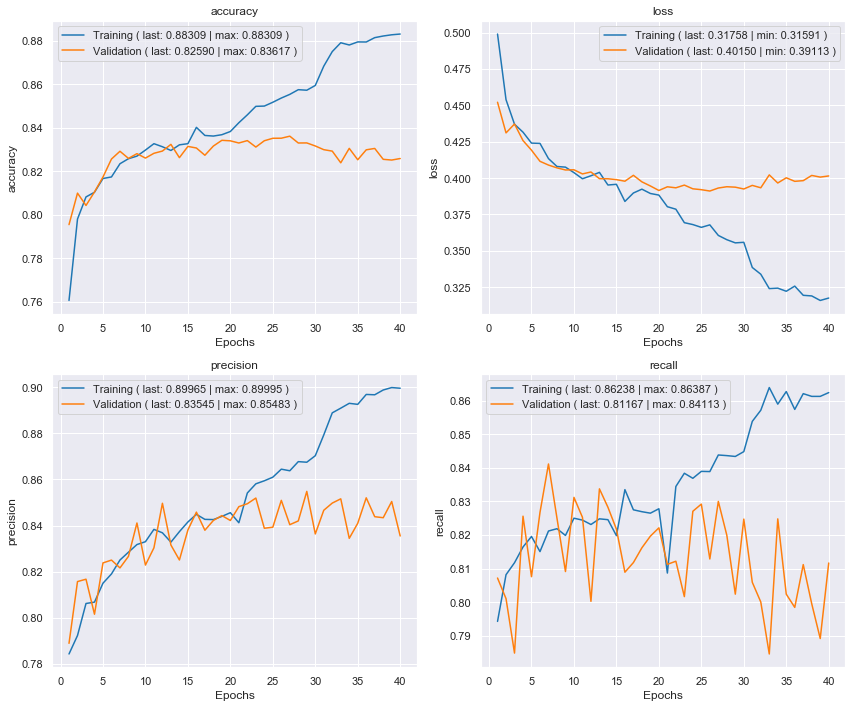

Validation confusion matrix


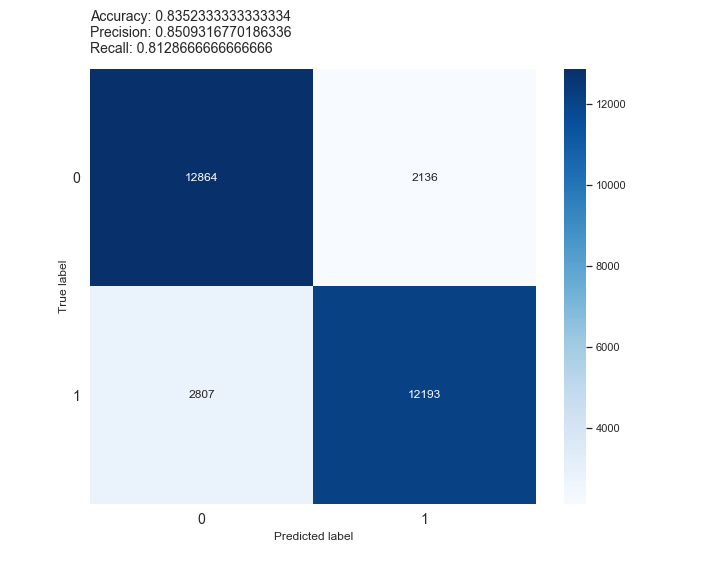

In [12]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 40,
        'previous_model_folder': '2021-02-15T19-39-28.272547'
    }
)

## -

## SNN + LSTM

### WE

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-18T18-16-28.179442
Skipping training
Minimum val_loss: 0.43645498156547546 - Epoch: 30
Training times
training_time: 4:34:15.512183
training_time (13 => 20): 4:53:08.257117
training_time (20 => 30): 5:33:40.170308
training_time (30 => 40): 6:20:55.981611


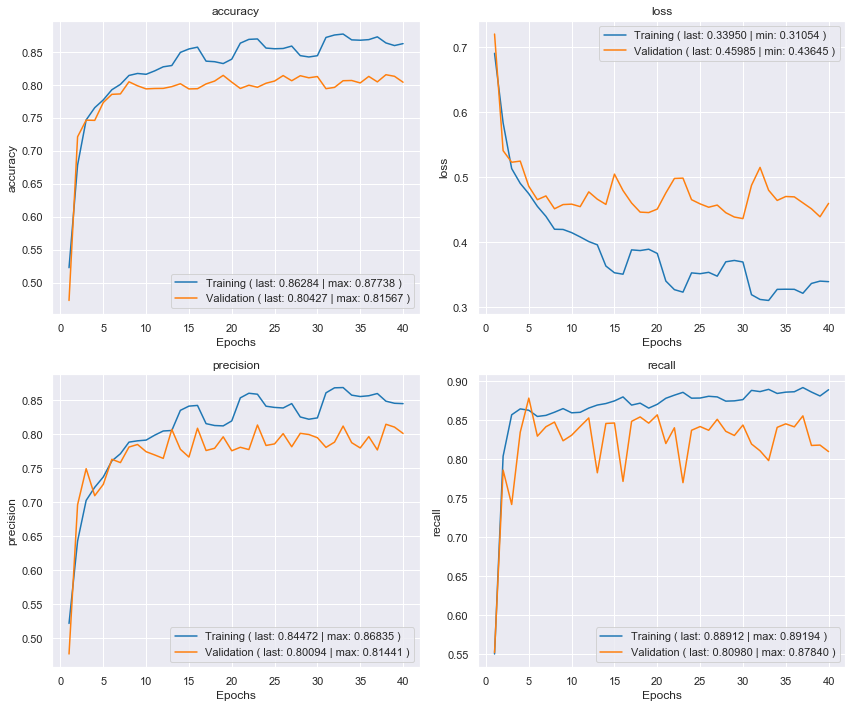

Validation confusion matrix


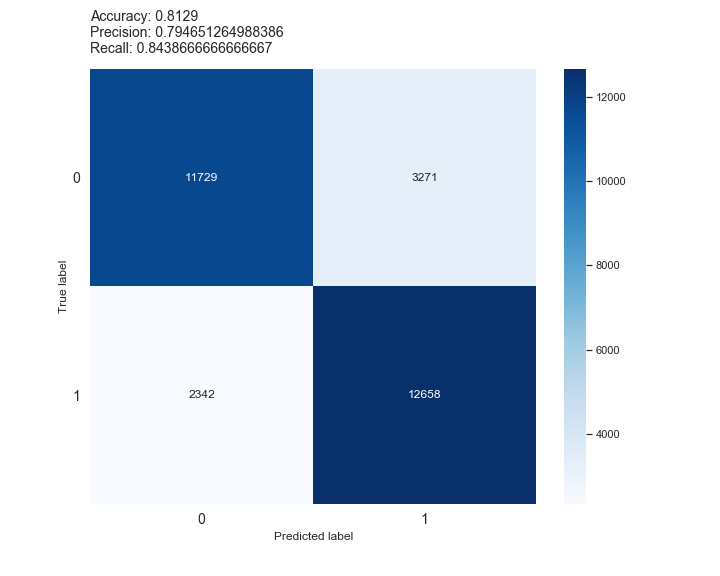

In [13]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 40,
        'previous_model_folder': '2021-02-18T18-16-28.179442'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-17T15-27-40.865071
Skipping training
Minimum val_loss: 0.4123730659484863 - Epoch: 30
Training times
training_time (10): 4:18:44.810040
training_time (17 => 20): 3:11:54.739710
training_time (20 => 30): 8:26:35.563603
training_time (30 => 40): 9:13:22.584860


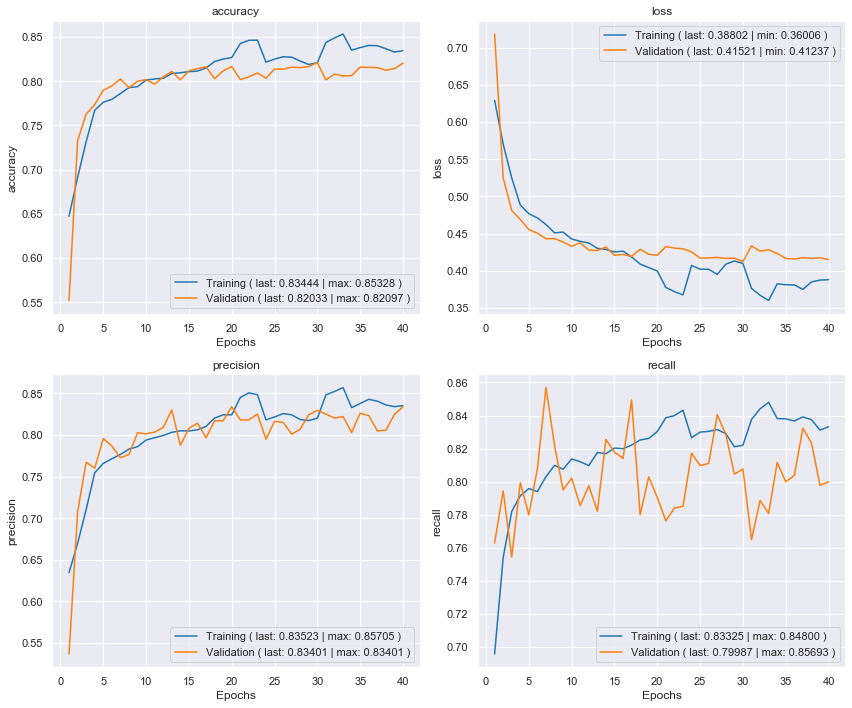

Validation confusion matrix


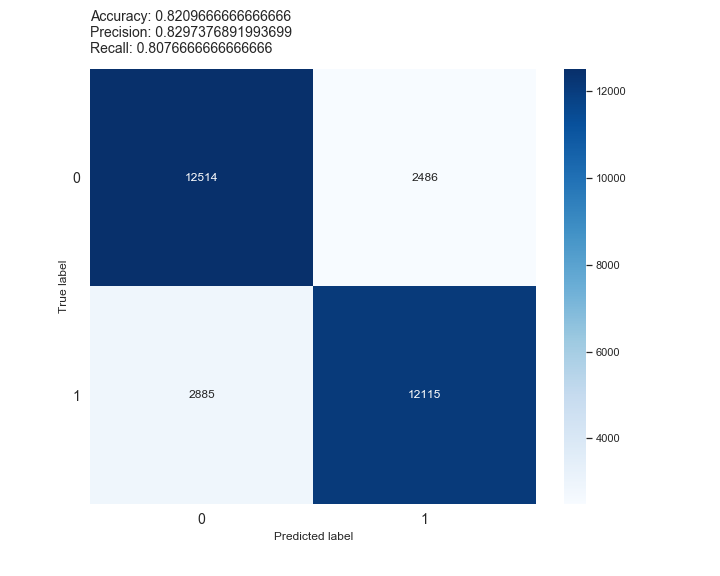

In [14]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 40,
        'previous_model_folder': '2021-02-17T15-27-40.865071'
    }
)

#### Other tests

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-06T14-19-21.095559
Epoch 1/10
2000/2000 [==============================] - 2027s 1s/step - loss: 0.6542 - accuracy: 0.5856 - precision: 0.5726 - recall: 0.6756 - val_loss: 0.5907 - val_accuracy: 0.6814 - val_precision: 0.6413 - val_recall: 0.8235
Epoch 2/10
2000/2000 [==============================] - 2020s 1s/step - loss: 0.5371 - accuracy: 0.7222 - precision: 0.6760 - recall: 0.8532 - val_loss: 0.5109 - val_accuracy: 0.7386 - val_precision: 0.6999 - val_recall: 0.8355
Epoch 3/10
2000/2000 [==============================] - 2033s 1s/step - loss: 0.4948 - accuracy: 0.7627 - precision: 0.7199 - recall: 0.8600 - val_loss: 0.4891 - val_accuracy: 0.7649 - val_precision: 0.7304 - val_recall: 0.8397
Epoch 4/10
2000/2000 [==============================] - 2022s 1s/step - loss: 0.4749 - accuracy: 0.7783 - precision: 0.7368 - recall: 0.8660 - val_loss: 0.5005 - val_accuracy: 0.7631 - val_precision: 0.7228 - val_recall: 0.8537
Epoch 5/1

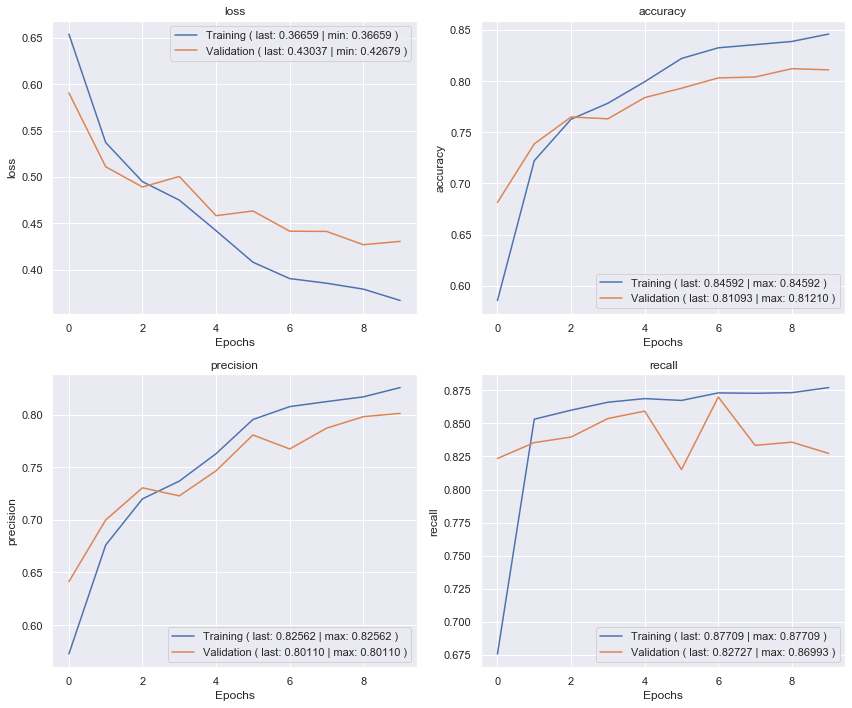

Validation confusion matrix


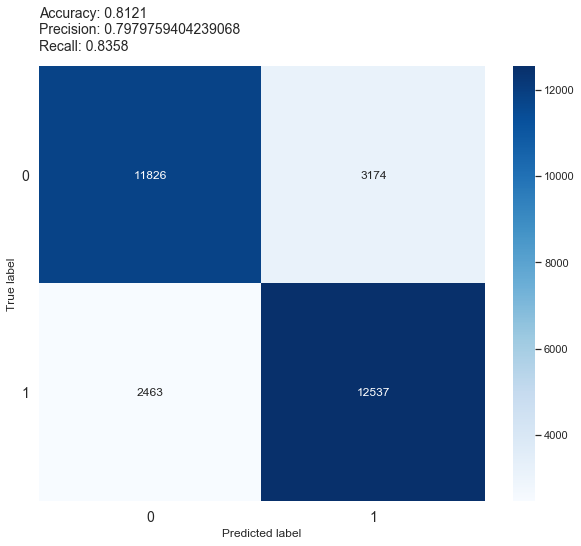

Training time: 5:53:53.068950


In [2]:
# 2020-06-06T14-19-21.095559
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-05-21T15-21-08.253730
Epoch 1/10
2000/2000 [==============================] - 662s 331ms/step - loss: 0.6355 - accuracy: 0.6339 - precision: 0.6239 - recall: 0.6739 - val_loss: 0.6330 - val_accuracy: 0.6564 - val_precision: 0.6364 - val_recall: 0.7298
Epoch 2/10
2000/2000 [==============================] - 662s 331ms/step - loss: 0.5643 - accuracy: 0.6942 - precision: 0.6711 - recall: 0.7617 - val_loss: 0.4983 - val_accuracy: 0.7476 - val_precision: 0.7214 - val_recall: 0.8067
Epoch 3/10
2000/2000 [==============================] - 1154s 577ms/step - loss: 0.5032 - accuracy: 0.7495 - precision: 0.7318 - recall: 0.7877 - val_loss: 0.4624 - val_accuracy: 0.7832 - val_precision: 0.7817 - val_recall: 0.7858
Epoch 4/10
2000/2000 [==============================] - 1069s 534ms/step - loss: 0.4744 - accuracy: 0.7788 - precision: 0.7668 - recall: 0.8012 - val_loss: 0.4499 - val_accuracy: 0.7874 - val_precision: 0.7701 - val_recall: 0.8195

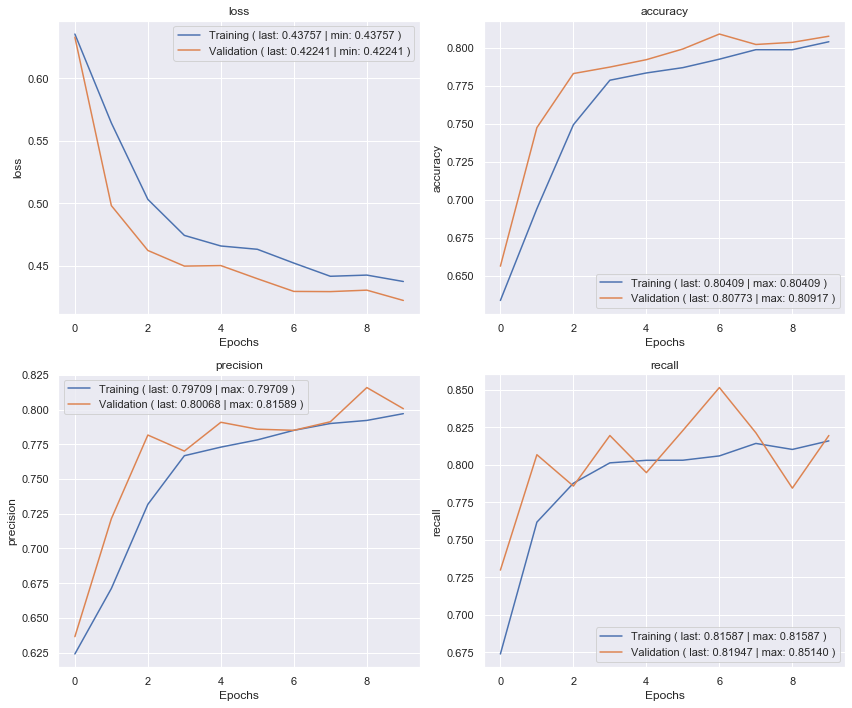

Validation confusion matrix


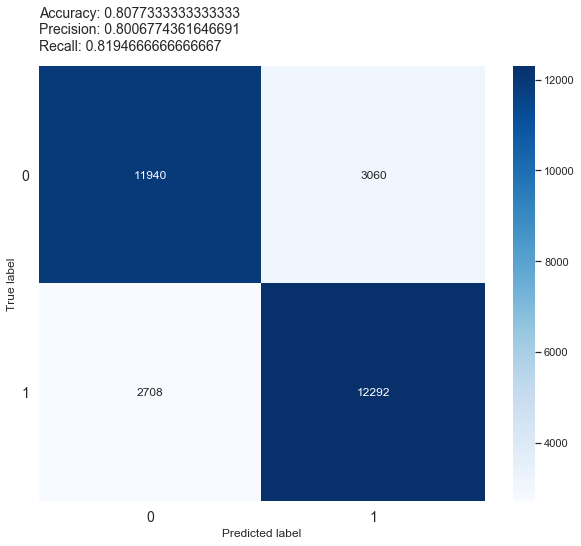

Training time: 2:59:48.512775


In [2]:
# 2020-05-21T15-21-08.253730
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 400,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

### Glove

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-02T15-33-03.859926
Skipping training
Minimum val_loss: 0.44189509749412537 - Epoch: 37
Training times
training_time: 5:07:08.395822
training_time (10 => 20): 8:29:00.744362
training_time (20 => 30): 5:17:31.855395
training_time (30 => 40): 5:15:24.941060
training_time (40 => 50): 5:12:23.692798


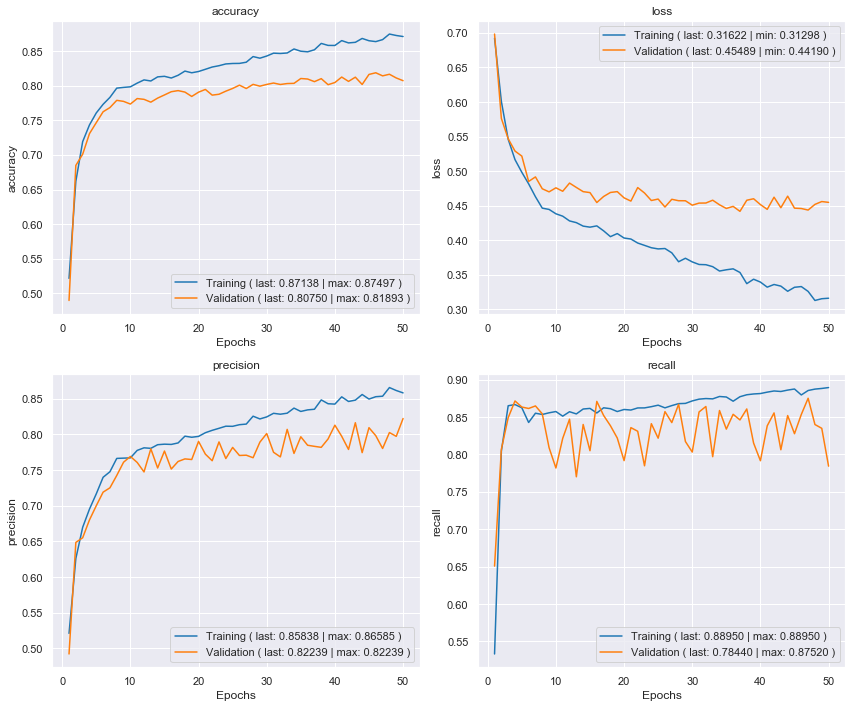

Validation confusion matrix


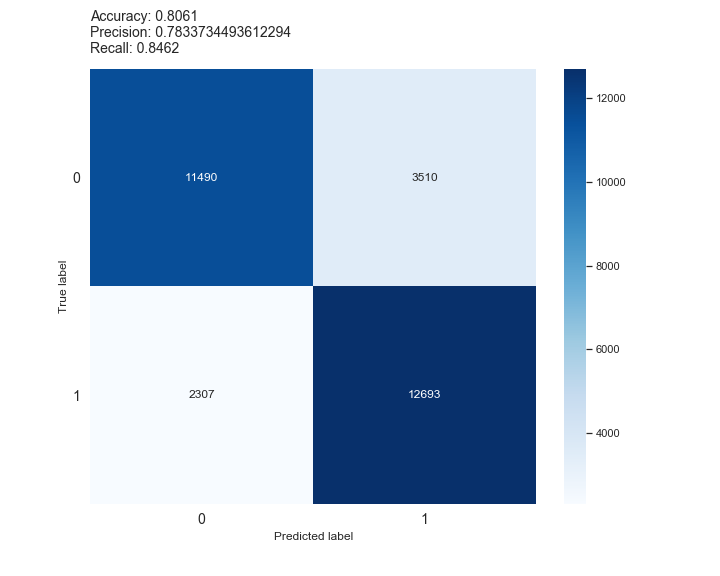

In [15]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'MLP',
        'pre_trained_embedding': 'Glove300',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 50,
        'previous_model_folder': '2020-06-02T15-33-03.859926'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-01T21-46-19.918872
Skipping training
Minimum val_loss: 0.4037600159645081 - Epoch: 50
Training times
training_time: 6:26:47.624129
training_time (10 => 20): 8:39:49.077176
training_time (24 => 30): 3:21:25.267901
training_time (30 => 40): 5:24:10.727626
training_time (42 => 50): 4:18:11.980958
training_time (59 => 60): 0:53:31.299057


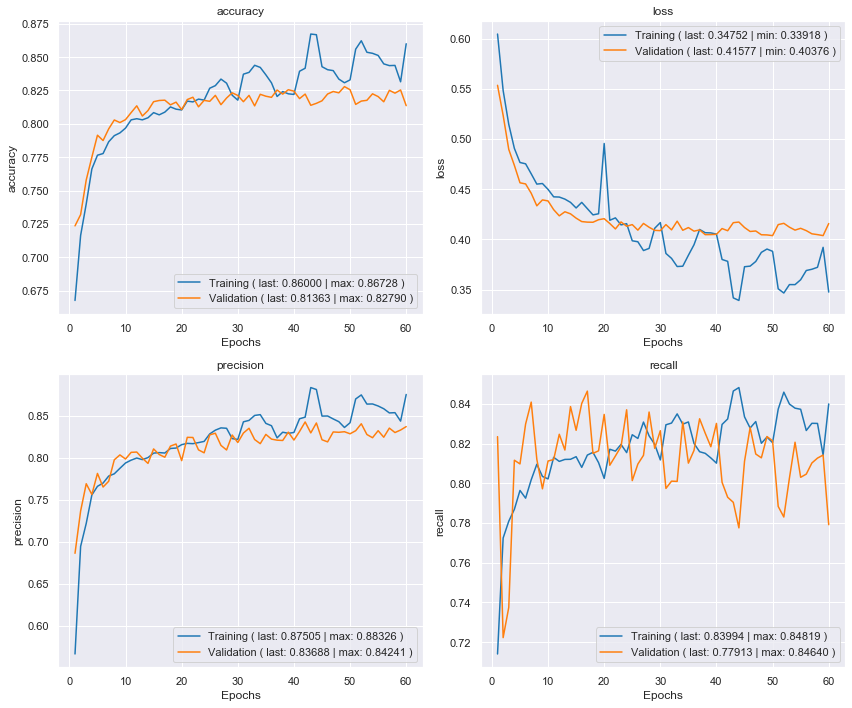

Validation confusion matrix


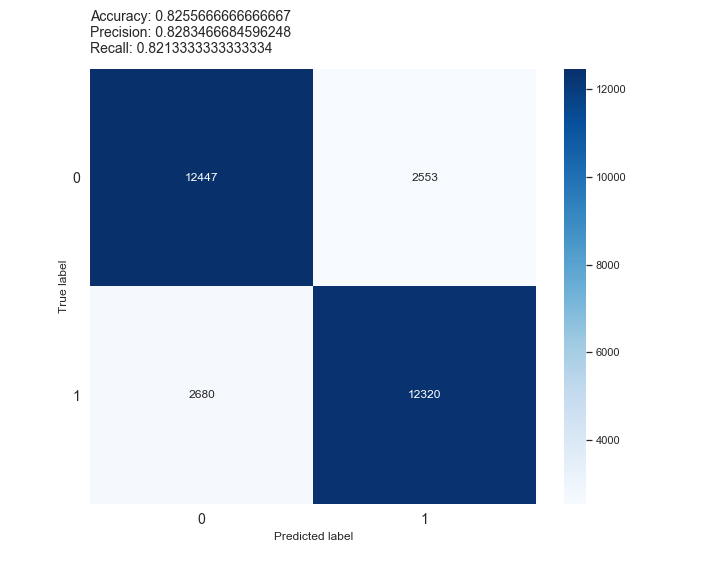

In [16]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'Glove300',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 60,
        'previous_model_folder': '2020-06-01T21-46-19.918872'
    }
)

### Word2Vec

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-05T23-59-36.987023
Skipping training
Minimum val_loss: 0.4198039174079895 - Epoch: 37
Training times
training_time: 7:11:44.380403
training_time (10 => 20): 6:36:17.660721
training_time (20 => 30): 5:12:09.658520
training_time (30 => 40): 7:00:23.637836
training_time (40 => 50): 7:28:27.089065


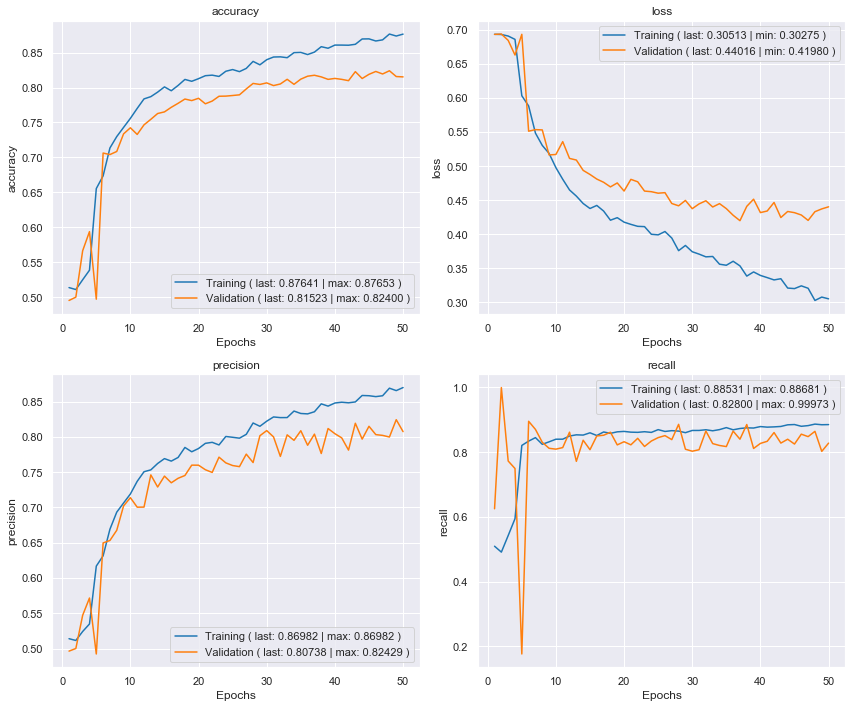

Validation confusion matrix


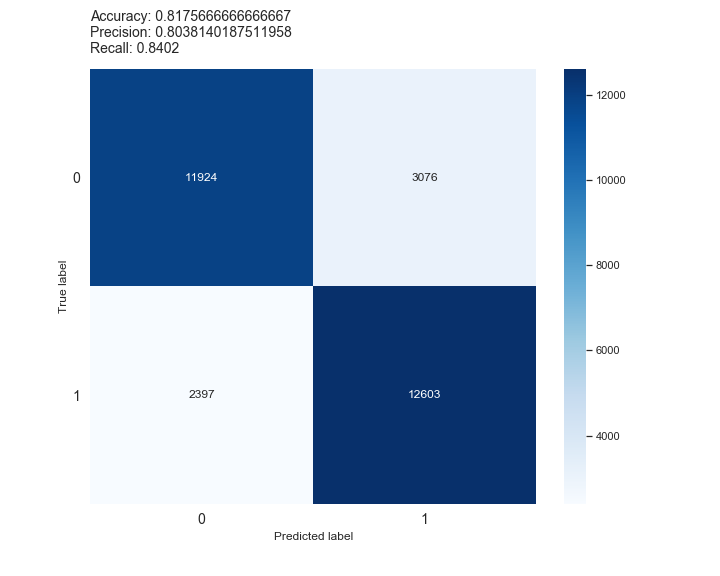

In [17]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'MLP',
        'pre_trained_embedding': 'Word2Vec300',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 50,
        'previous_model_folder': '2021-02-05T23-59-36.987023'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-06T18-05-08.056646
Skipping training
Minimum val_loss: 0.4128428399562836 - Epoch: 42
Training times
training_time: 6:23:44.856476
training_time (10 => 20): 5:38:08.766077
training_time (21 => 30): 4:50:15.564967
training_time (30 => 40): 6:36:52.928670
training_time (40 => 50): 5:15:19.318130
training_time (58 => 60): 1:26:12.840759


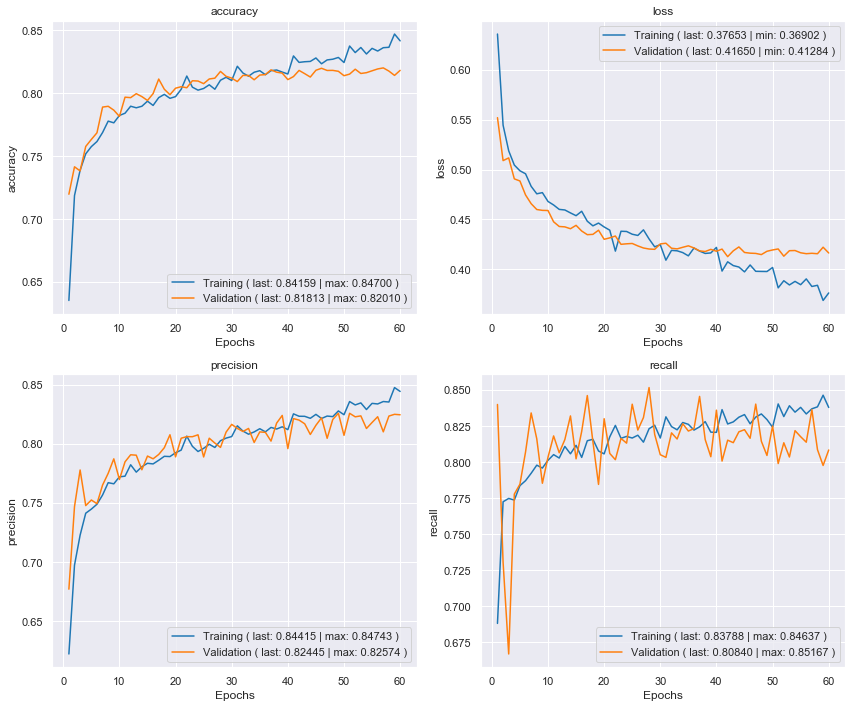

Validation confusion matrix


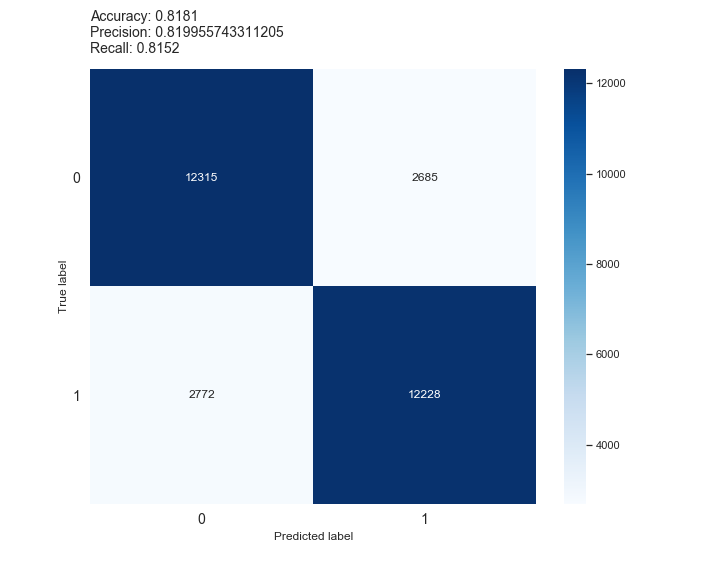

In [18]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'Word2Vec300',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 60,
        'previous_model_folder': '2021-02-06T18-05-08.056646'
    }
)

### FastText

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-07T19-33-58.130983
Skipping training
Minimum val_loss: 0.4377647638320923 - Epoch: 39
Training times
training_time: 6:17:37.093953
training_time (10 => 20): 5:21:07.954981
training_time (20 => 30): 5:19:55.396278
training_time (32 => 40): 4:16:01.170547
training_time (43 => 50): 5:03:43.052242


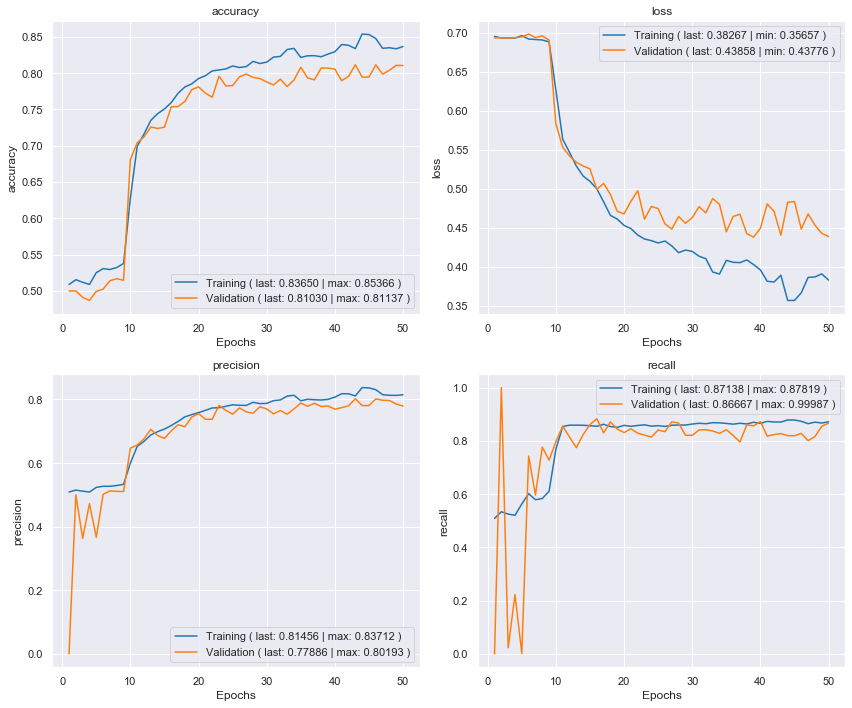

Validation confusion matrix


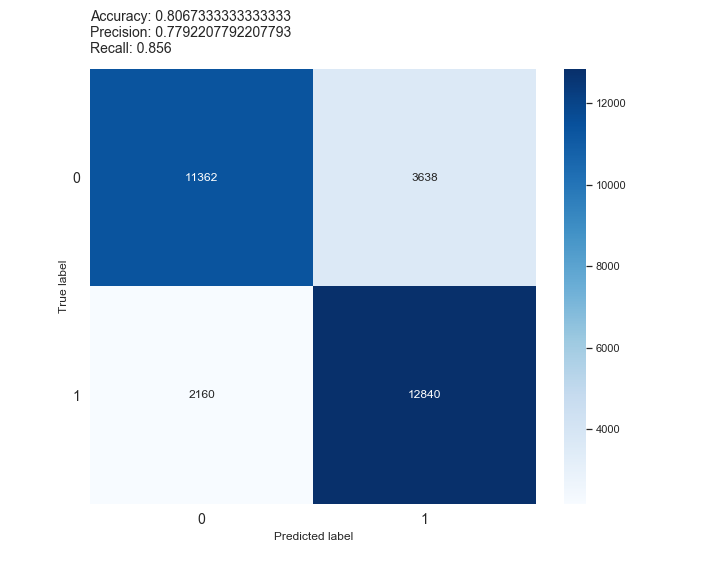

In [19]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'MLP',
        'pre_trained_embedding': 'FastText300',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 50,
        'previous_model_folder': '2021-02-07T19-33-58.130983'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-08T18-19-53.697885
Skipping training
Minimum val_loss: 0.4086264967918396 - Epoch: 50
Training times
training_time: 4:11:54.290863
training_time (10 => 20): 6:17:25.066200
training_time (20 => 30): 6:52:18.541871
training_time (30 => 40): 7:42:38.004784
training_time (40 => 50): 8:11:46.580775
training_time (54 => 60): 3:21:48.858848


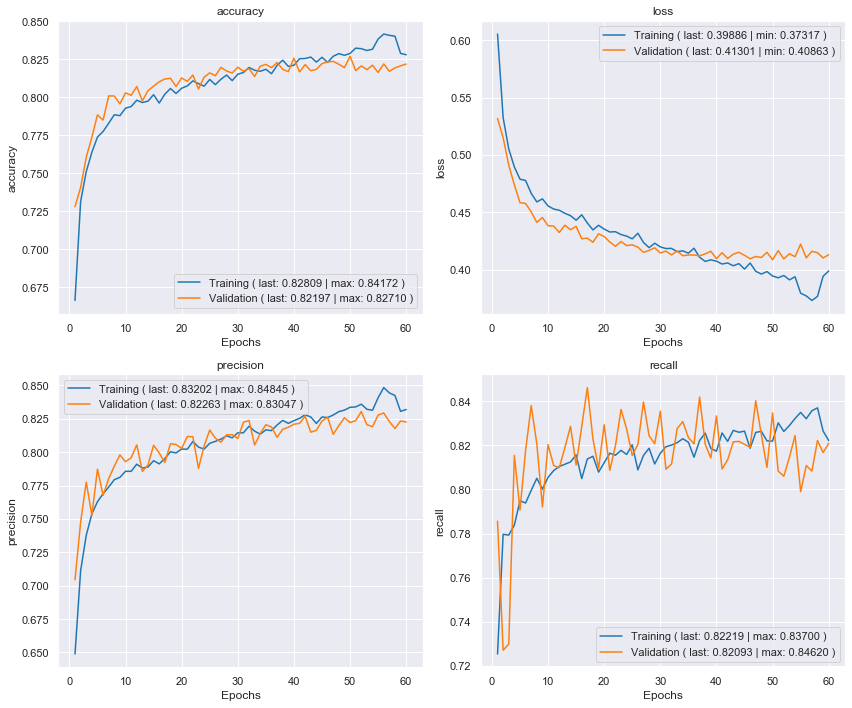

Validation confusion matrix


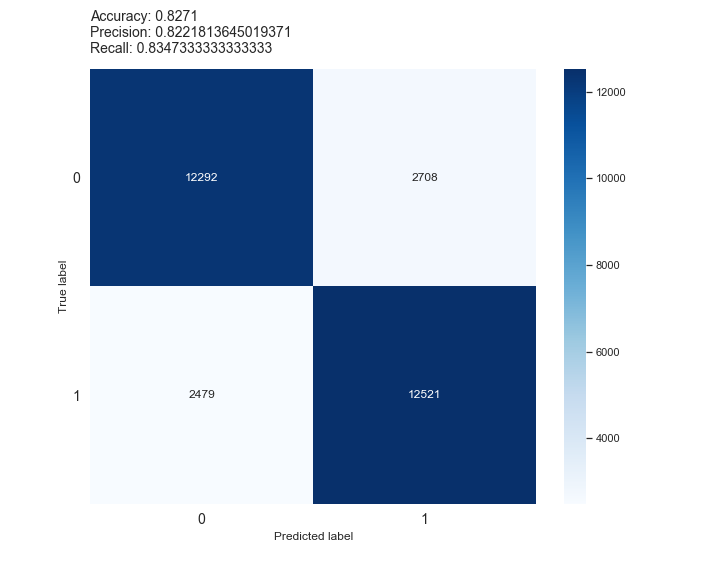

In [20]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + LSTM',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'FastText300',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 60,
        'previous_model_folder': '2021-02-08T18-19-53.697885'
    }
)

## SNN + Transformer

### WE

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-18T02-50-06.094242
Skipping training
Minimum val_loss: 0.4241519272327423 - Epoch: 60
Training times
training_time (10): 1:27:23.812934
training_time (10 => 20): 1:14:30.165463
training_time (20 => 30): 1:48:36.932823
training_time (30 => 40): 1:21:27.198216
training_time (44 => 50): 0:53:06.350425
training_time (50 => 60): 1:31:31.524410
training_time (60 => 70): 1:20:33.147855


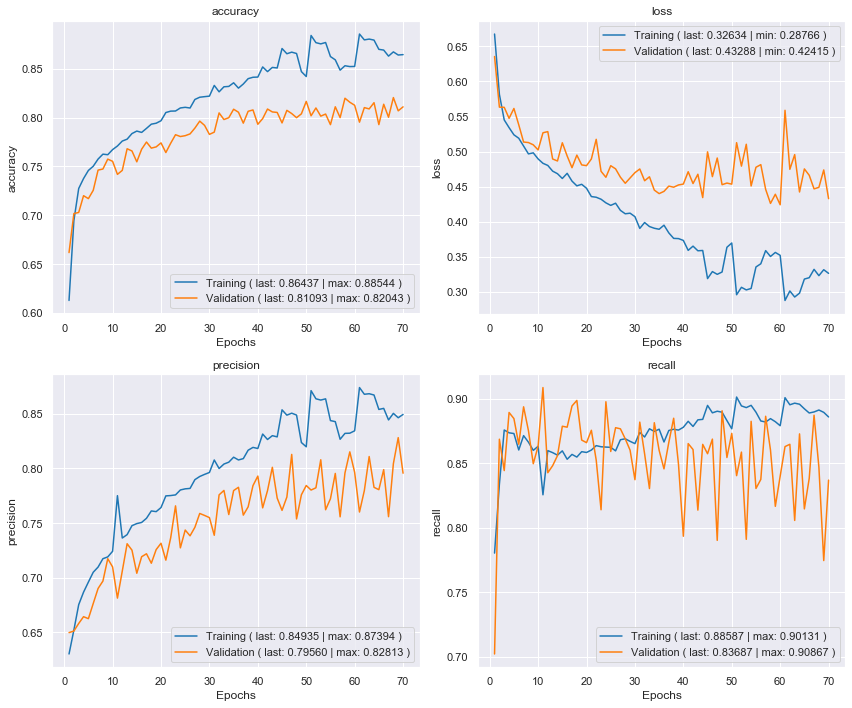

Validation confusion matrix


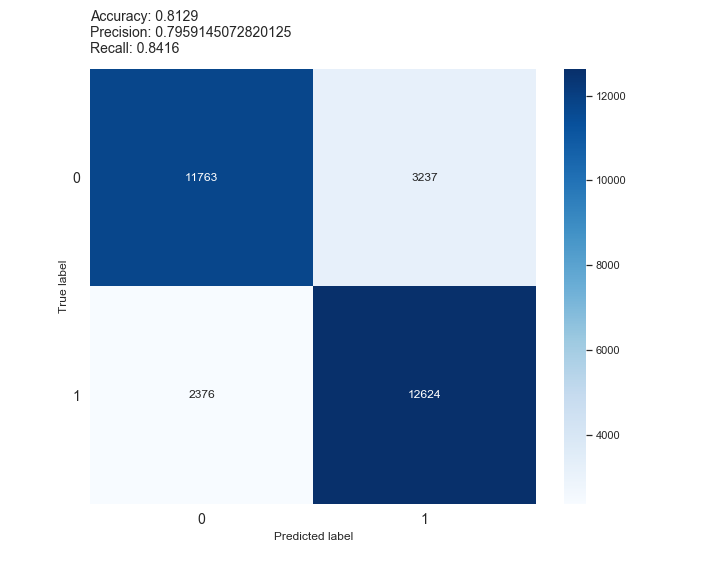

In [21]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 70,
        'previous_model_folder': '2021-02-18T02-50-06.094242'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-11T01-08-48.016575
Skipping training
Minimum val_loss: 0.7440057396888733 - Epoch: 39
Training times
training_time: 4:05:32.484307
training_time (10 => 20): 1:15:54.126991
training_time (20 => 30): 1:49:28.155062
training_time (30 => 40): 1:28:54.628309
training_time (40 => 50): 1:15:09.673447


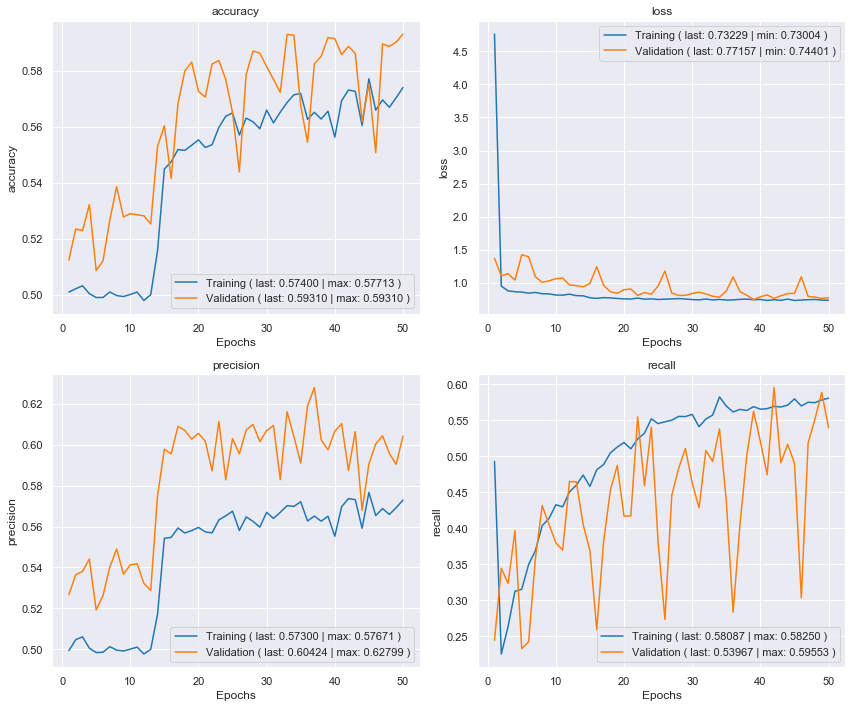

Validation confusion matrix


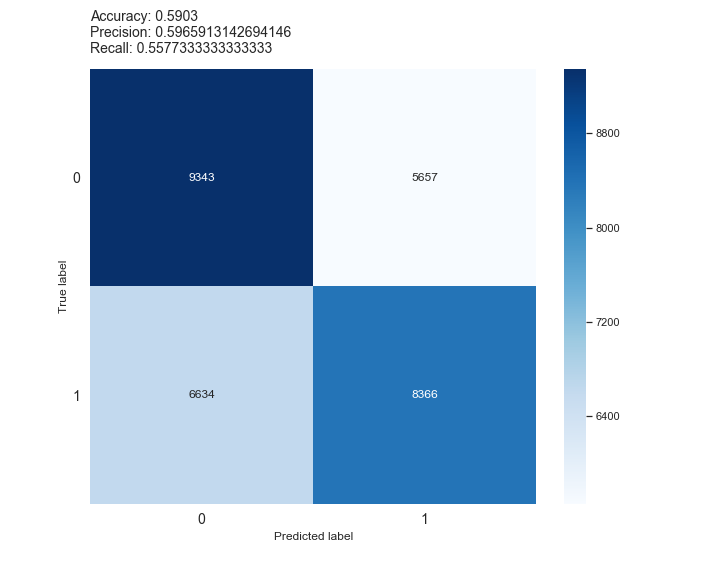

In [22]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 50,
        'previous_model_folder': '2021-02-11T01-08-48.016575'
    }
)

#### Other tests

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-09T01-35-04.718948
Epoch 1/10
2000/2000 [==============================] - 873s 436ms/step - loss: 0.7655 - accuracy: 0.5009 - precision: 0.6499 - recall: 0.6377 - val_loss: 0.6959 - val_accuracy: 0.4991 - val_precision: 0.4955 - val_recall: 0.0955
Epoch 2/10
2000/2000 [==============================] - 910s 455ms/step - loss: 0.6958 - accuracy: 0.5014 - precision: 0.5012 - recall: 0.6168 - val_loss: 0.6932 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 3/10
2000/2000 [==============================] - 1656s 828ms/step - loss: 0.6932 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.7565 - val_loss: 0.6932 - val_accuracy: 0.4989 - val_precision: 0.4995 - val_recall: 0.9979
Epoch 4/10
2000/2000 [==============================] - 1950s 975ms/step - loss: 0.6956 - accuracy: 0.4997 - precision: 0.4998 - recall: 0.6439 - val_loss: 0.6932 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000

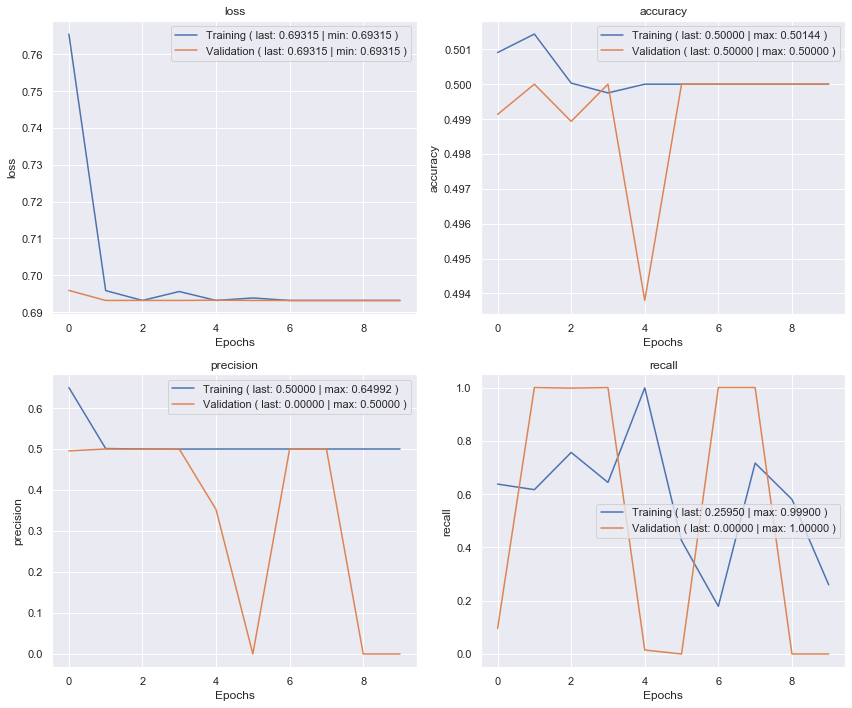

Validation confusion matrix


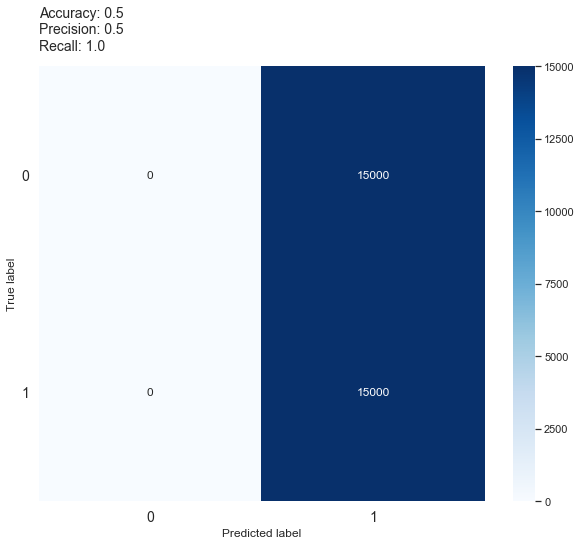

Training time: 3:56:07.794446


In [3]:
# 2021-02-09T01-35-04.718948
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 300,
            'num_heads': 4,
            'd_ff': 32,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-09T21-24-22.383155
Epoch 1/10
2000/2000 [==============================] - 516s 258ms/step - loss: 0.6716 - accuracy: 0.6251 - precision: 0.5701 - recall: 0.6423 - val_loss: 0.6028 - val_accuracy: 0.6953 - val_precision: 0.6468 - val_recall: 0.8605
Epoch 2/10
2000/2000 [==============================] - 516s 258ms/step - loss: 0.5850 - accuracy: 0.6952 - precision: 0.6515 - recall: 0.8396 - val_loss: 0.5614 - val_accuracy: 0.7110 - val_precision: 0.6447 - val_recall: 0.9403
Epoch 3/10
2000/2000 [==============================] - 517s 258ms/step - loss: 0.5559 - accuracy: 0.7200 - precision: 0.6658 - recall: 0.8832 - val_loss: 0.5792 - val_accuracy: 0.6824 - val_precision: 0.6423 - val_recall: 0.8233
Epoch 4/10
2000/2000 [==============================] - 517s 258ms/step - loss: 0.5457 - accuracy: 0.7266 - precision: 0.6692 - recall: 0.8963 - val_loss: 0.5600 - val_accuracy: 0.7042 - val_precision: 0.6448 - val_recall: 0.9093
E

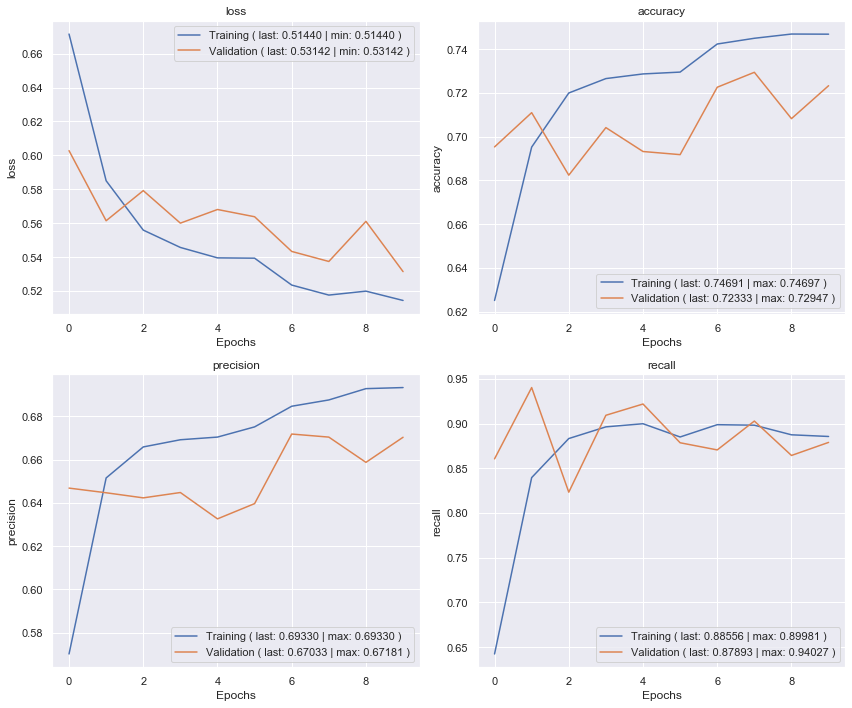

Validation confusion matrix


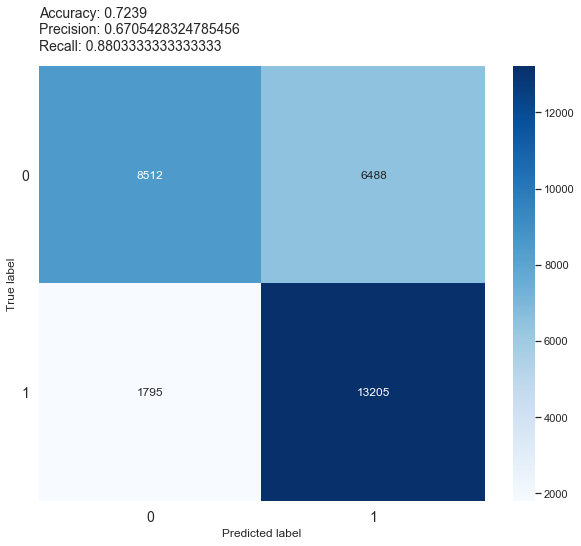

Training time: 1:38:13.296052


In [4]:
# 2021-02-09T21-24-22.383155
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 50,
            'num_heads': 5,
            'd_ff': 32,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-09T23-55-22.885327
Epoch 1/10
2000/2000 [==============================] - 1676s 838ms/step - loss: 0.7266 - accuracy: 0.5226 - precision: 0.6051 - recall: 0.6890 - val_loss: 0.7062 - val_accuracy: 0.4736 - val_precision: 0.4420 - val_recall: 0.2013
Epoch 2/10
2000/2000 [==============================] - 1408s 704ms/step - loss: 0.6716 - accuracy: 0.5708 - precision: 0.5576 - recall: 0.6856 - val_loss: 0.6105 - val_accuracy: 0.6598 - val_precision: 0.6126 - val_recall: 0.8698
Epoch 3/10
2000/2000 [==============================] - 1770s 885ms/step - loss: 0.5941 - accuracy: 0.6683 - precision: 0.6113 - recall: 0.9242 - val_loss: 0.5716 - val_accuracy: 0.6932 - val_precision: 0.6353 - val_recall: 0.9070
Epoch 4/10
2000/2000 [==============================] - 1616s 808ms/step - loss: 0.6157 - accuracy: 0.6379 - precision: 0.5936 - recall: 0.8746 - val_loss: 0.6164 - val_accuracy: 0.6701 - val_precision: 0.6170 - val_recall: 0.89

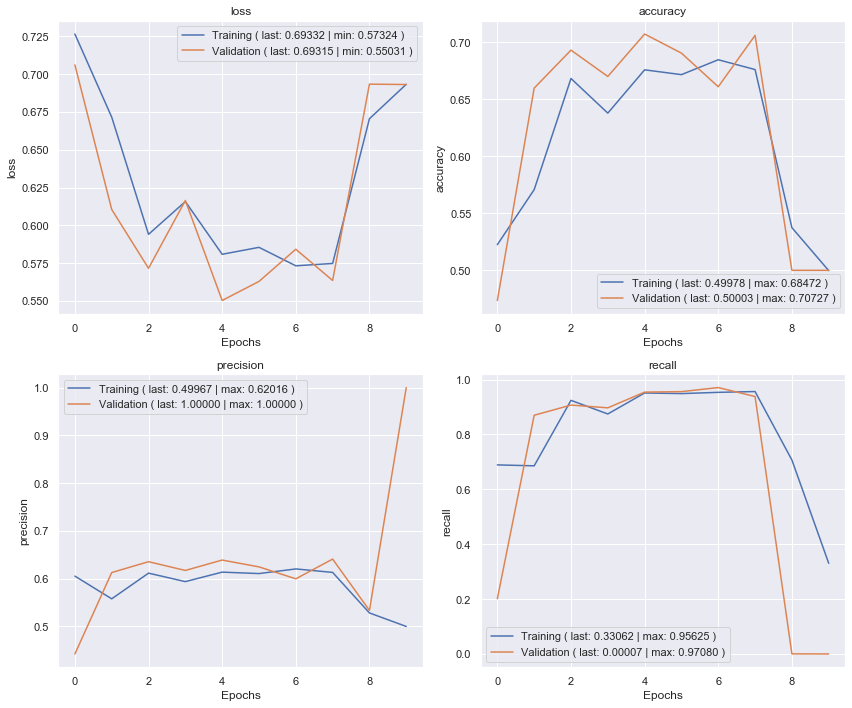

Validation confusion matrix


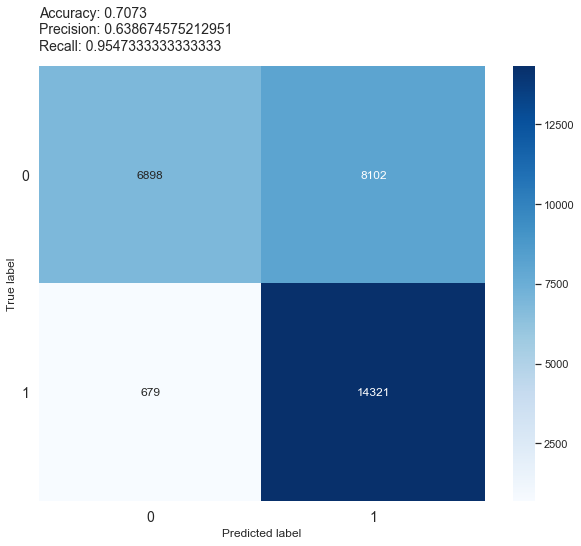

Training time: 4:48:00.833286


In [5]:
# 2021-02-09T23-55-22.885327
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 5,
            'd_model': 50,
            'num_heads': 5,
            'd_ff': 50,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-10T20-18-55.538210
Epoch 1/10
2000/2000 [==============================] - 2449s 1s/step - loss: 0.7287 - accuracy: 0.5252 - precision: 0.6236 - recall: 0.6887 - val_loss: 0.7244 - val_accuracy: 0.5022 - val_precision: 0.5013 - val_recall: 0.8101
Epoch 2/10
2000/2000 [==============================] - 1154s 577ms/step - loss: 0.6513 - accuracy: 0.6134 - precision: 0.5885 - recall: 0.7544 - val_loss: 0.6015 - val_accuracy: 0.6640 - val_precision: 0.6205 - val_recall: 0.8444
Epoch 3/10
2000/2000 [==============================] - 988s 494ms/step - loss: 0.5898 - accuracy: 0.6778 - precision: 0.6277 - recall: 0.8738 - val_loss: 0.5597 - val_accuracy: 0.6990 - val_precision: 0.6406 - val_recall: 0.9067
Epoch 4/10
2000/2000 [==============================] - 988s 494ms/step - loss: 0.5752 - accuracy: 0.6841 - precision: 0.6268 - recall: 0.9101 - val_loss: 0.5735 - val_accuracy: 0.6967 - val_precision: 0.6398 - val_recall: 0.9003
Ep

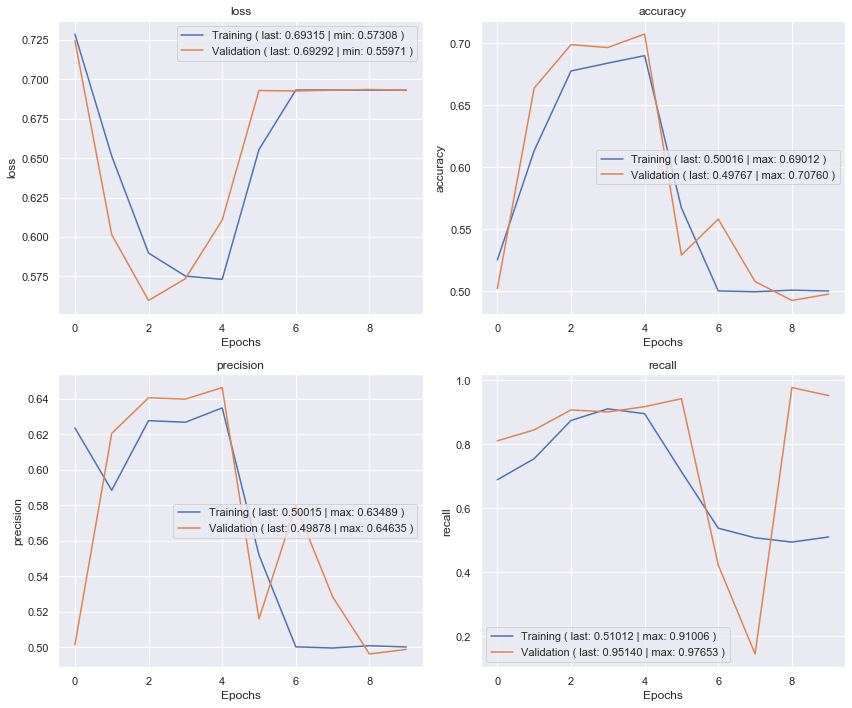

Validation confusion matrix


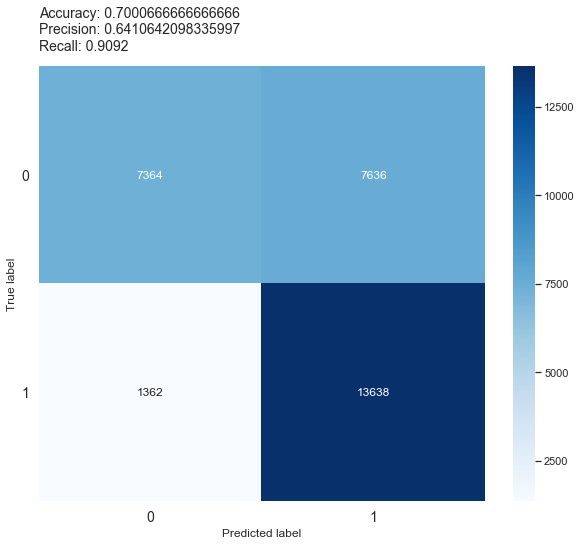

Training time: 3:45:04.809260


In [4]:
# 2021-02-10T20-18-55.538210
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 5,
            'd_model': 50,
            'num_heads': 5,
            'd_ff': 50,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-10T04-54-50.680098
Epoch 1/10
2000/2000 [==============================] - 379s 190ms/step - loss: 0.6778 - accuracy: 0.5950 - precision: 0.5860 - recall: 0.3344 - val_loss: 0.6007 - val_accuracy: 0.6848 - val_precision: 0.6518 - val_recall: 0.7935accuracy: 0
Epoch 2/10
2000/2000 [==============================] - 378s 189ms/step - loss: 0.5768 - accuracy: 0.7023 - precision: 0.6565 - recall: 0.8486 - val_loss: 0.5990 - val_accuracy: 0.6819 - val_precision: 0.6436 - val_recall: 0.8153
Epoch 3/10
2000/2000 [==============================] - 377s 189ms/step - loss: 0.5462 - accuracy: 0.7280 - precision: 0.6723 - recall: 0.8896 - val_loss: 0.5737 - val_accuracy: 0.6928 - val_precision: 0.6458 - val_recall: 0.8541
Epoch 4/10
2000/2000 [==============================] - 377s 189ms/step - loss: 0.5403 - accuracy: 0.7334 - precision: 0.6782 - recall: 0.8883 - val_loss: 0.5611 - val_accuracy: 0.7101 - val_precision: 0.6580 - val_recal

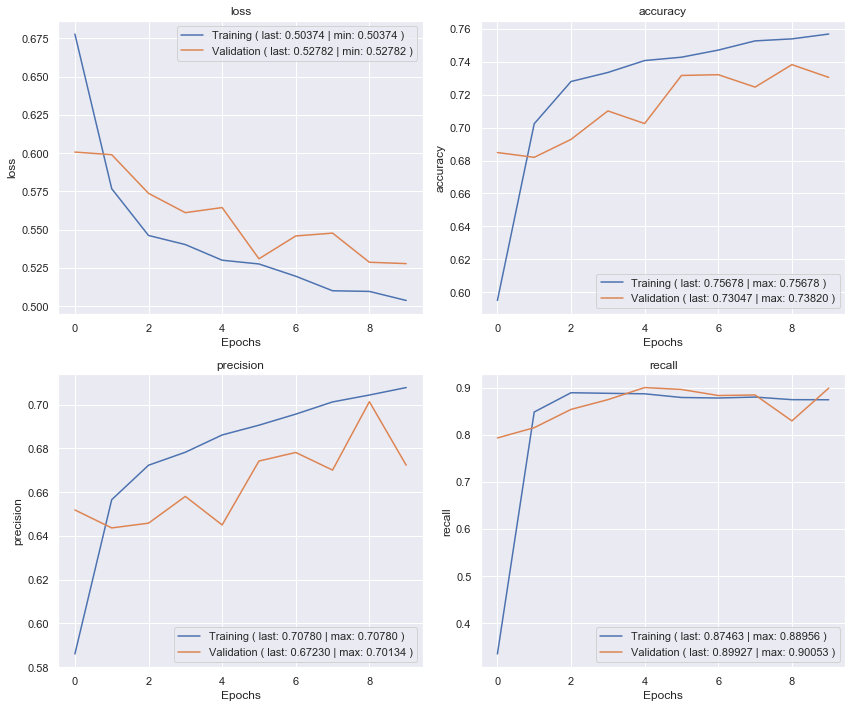

Validation confusion matrix


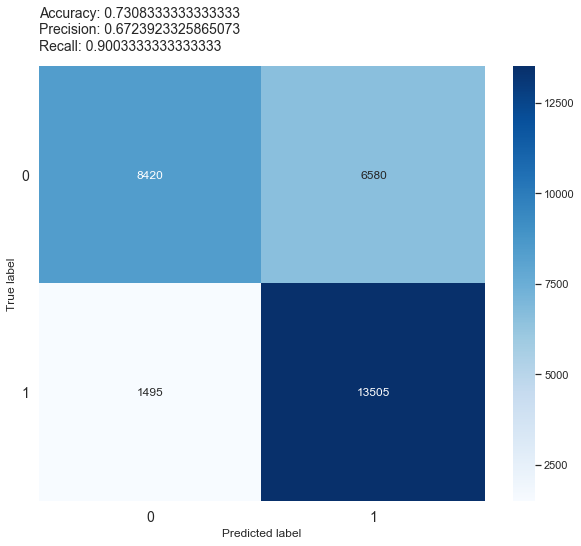

Training time: 1:13:57.933494


In [6]:
# 2021-02-10T04-54-50.680098
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 50,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-10T16-34-03.783677
Epoch 1/10
2000/2000 [==============================] - 711s 356ms/step - loss: 0.7249 - accuracy: 0.5303 - precision: 0.5305 - recall: 0.5271 - val_loss: 0.7364 - val_accuracy: 0.4638 - val_precision: 0.4628 - val_recall: 0.4498
Epoch 2/10
2000/2000 [==============================] - 689s 344ms/step - loss: 0.6542 - accuracy: 0.6059 - precision: 0.5833 - recall: 0.7412 - val_loss: 0.6120 - val_accuracy: 0.6595 - val_precision: 0.6148 - val_recall: 0.8541
Epoch 3/10
2000/2000 [==============================] - 716s 358ms/step - loss: 0.5910 - accuracy: 0.6777 - precision: 0.6251 - recall: 0.8879 - val_loss: 0.5830 - val_accuracy: 0.6795 - val_precision: 0.6366 - val_recall: 0.8363
Epoch 4/10
2000/2000 [==============================] - 667s 334ms/step - loss: 0.5754 - accuracy: 0.7062 - precision: 0.6545 - recall: 0.8731 - val_loss: 0.5956 - val_accuracy: 0.6876 - val_precision: 0.6492 - val_recall: 0.8166
E

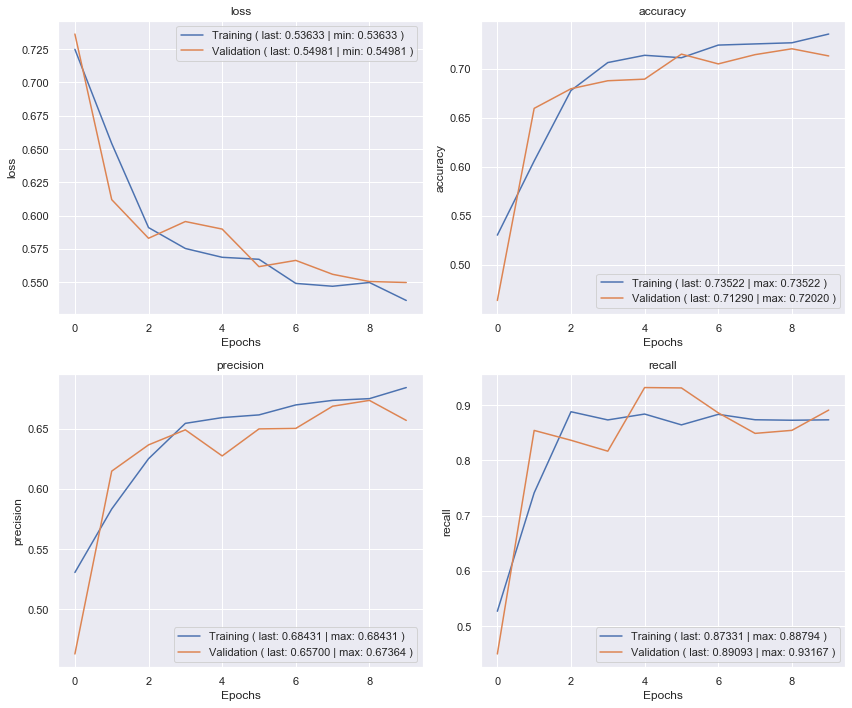

Validation confusion matrix


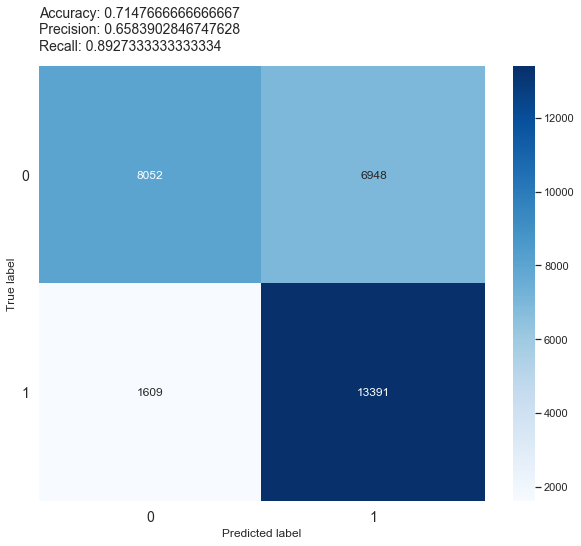

Training time: 2:04:00.357893


In [2]:
# 2021-02-10T16-34-03.783677
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 5,
            'd_model': 50,
            'num_heads': 5,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-01-29T21-04-39.806011
Epoch 1/10
2000/2000 [==============================] - 543s 271ms/step - loss: 0.6430 - accuracy: 0.6537 - precision: 0.6321 - recall: 0.5981 - val_loss: 0.5838 - val_accuracy: 0.7071 - val_precision: 0.6522 - val_recall: 0.8876
Epoch 2/10
2000/2000 [==============================] - 538s 269ms/step - loss: 0.5589 - accuracy: 0.7216 - precision: 0.6754 - recall: 0.8533 - val_loss: 0.5674 - val_accuracy: 0.7068 - val_precision: 0.6481 - val_recall: 0.9051
Epoch 3/10
2000/2000 [==============================] - 539s 269ms/step - loss: 0.5311 - accuracy: 0.7417 - precision: 0.6883 - recall: 0.8835 - val_loss: 0.5904 - val_accuracy: 0.6861 - val_precision: 0.6522 - val_recall: 0.7975
Epoch 4/10
2000/2000 [==============================] - 538s 269ms/step - loss: 0.5188 - accuracy: 0.7502 - precision: 0.6956 - recall: 0.8899 - val_loss: 0.5708 - val_accuracy: 0.7265 - val_precision: 0.6655 - val_recall: 0.9109
E

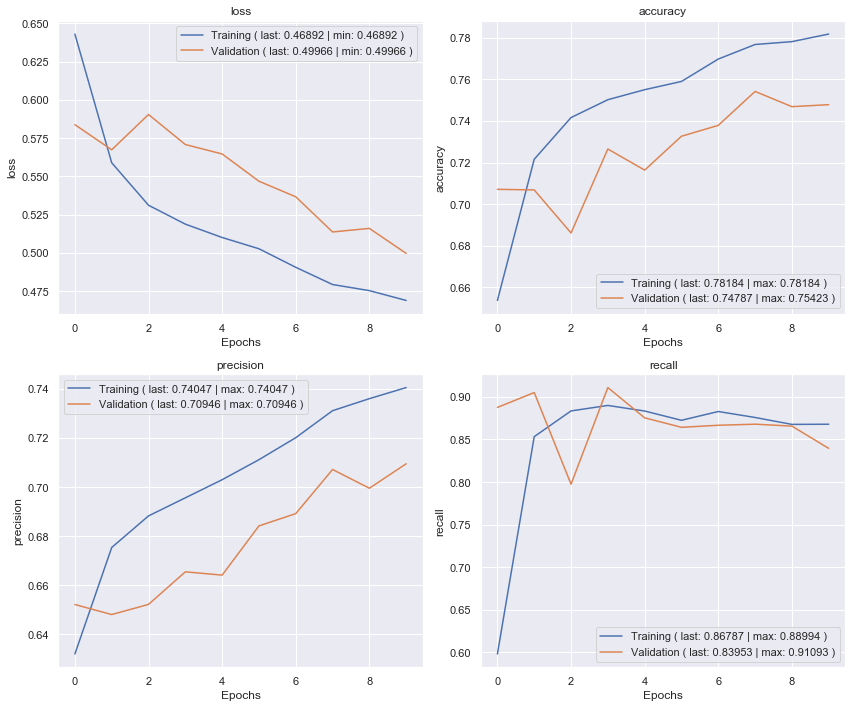

Validation confusion matrix


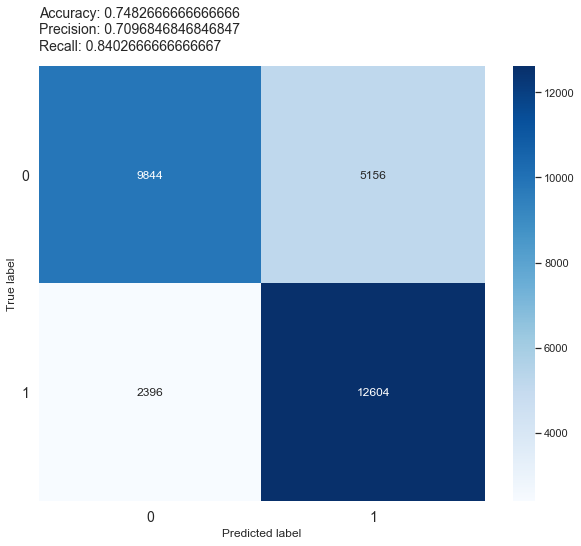

Training time: 1:42:53.608893


In [3]:
# 2021-01-29T21-04-39.806011
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 32,
            'num_heads': 4,
            'd_ff': 32,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-01T21-15-54.887969
Epoch 1/10
2000/2000 [==============================] - 451s 225ms/step - loss: 2.7528 - accuracy: 0.5012 - precision: 0.5025 - recall: 0.2344 - val_loss: 1.1240 - val_accuracy: 0.5220 - val_precision: 0.5357 - val_recall: 0.3304
Epoch 2/10
2000/2000 [==============================] - 448s 224ms/step - loss: 0.8674 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.4708 - val_loss: 0.9676 - val_accuracy: 0.5303 - val_precision: 0.5358 - val_recall: 0.4540
Epoch 3/10
2000/2000 [==============================] - 447s 223ms/step - loss: 0.7964 - accuracy: 0.5256 - precision: 0.5274 - recall: 0.4928 - val_loss: 0.7853 - val_accuracy: 0.6125 - val_precision: 0.6473 - val_recall: 0.4945
Epoch 4/10
2000/2000 [==============================] - 447s 223ms/step - loss: 0.7441 - accuracy: 0.5868 - precision: 0.5957 - recall: 0.5405 - val_loss: 0.7488 - val_accuracy: 0.6111 - val_precision: 0.6183 - val_recall: 0.5808
E

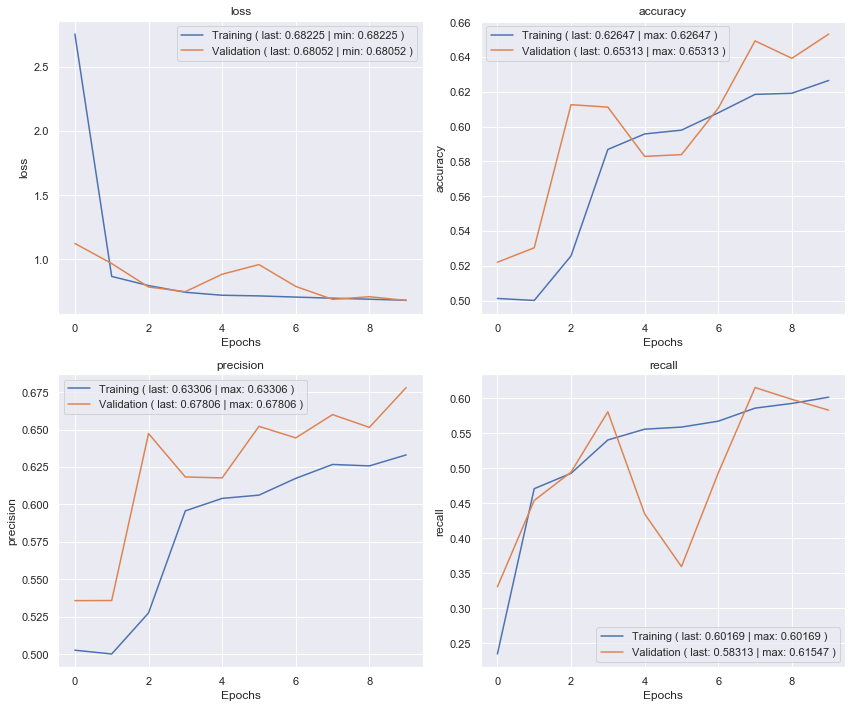

Validation confusion matrix


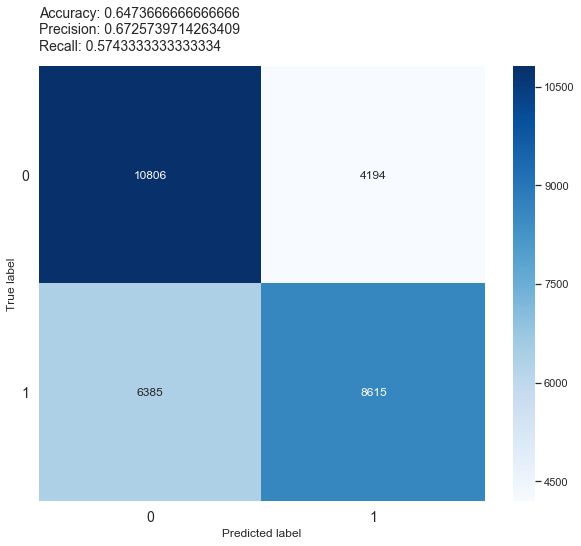

Training time: 1:26:01.840441


In [2]:
# 2021-02-01T21-15-54.887969
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 32,
            'num_heads': 4,
            'd_ff': 32,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-02T20-31-57.126403
Epoch 1/10
2000/2000 [==============================] - 855s 427ms/step - loss: 0.7651 - accuracy: 0.5003 - precision: 0.5003 - recall: 0.1977 - val_loss: 0.6934 - val_accuracy: 0.4615 - val_precision: 0.4736 - val_recall: 0.6889
Epoch 2/10
2000/2000 [==============================] - 789s 394ms/step - loss: 0.6957 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.4105 - val_loss: 0.6932 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
2000/2000 [==============================] - 761s 381ms/step - loss: 0.6932 - accuracy: 0.4998 - precision: 0.4998 - recall: 0.3761 - val_loss: 0.6932 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/10
2000/2000 [==============================] - 741s 371ms/step - loss: 0.6980 - accuracy: 0.4999 - precision: 0.4997 - recall: 0.1393 - val_loss: 0.6931 - val_accuracy: 0.5011 - val_precision: 1.0000 - val_

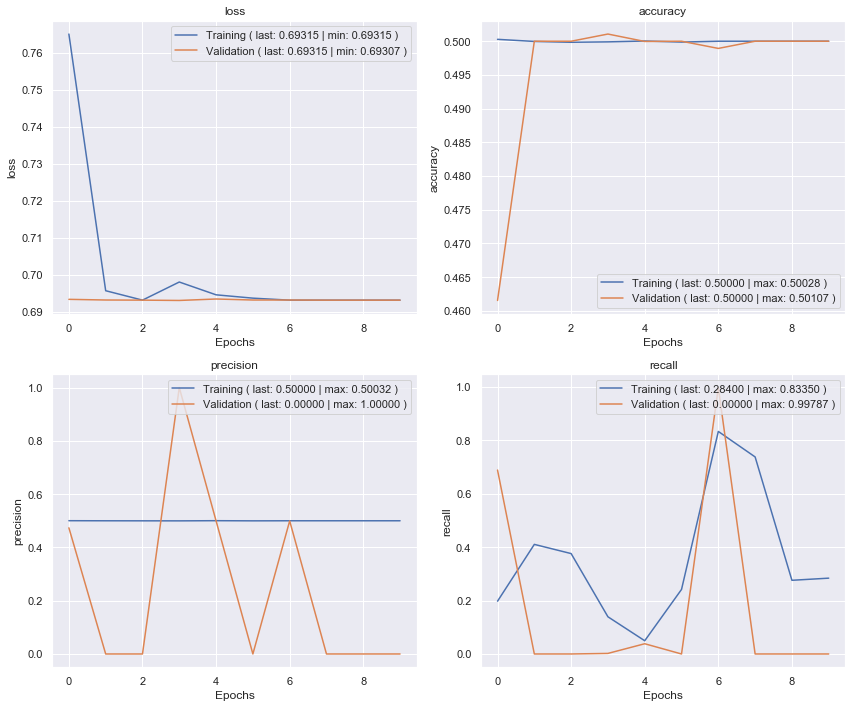

Validation confusion matrix


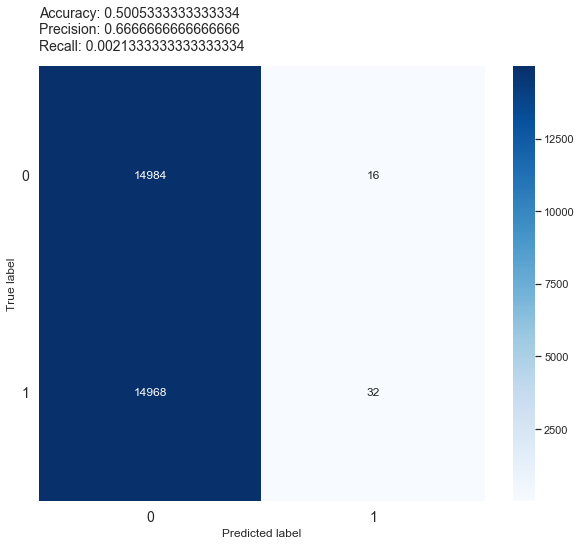

Training time: 2:21:02.064247


In [6]:
# 2021-02-02T20-31-57.126403
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 300,
            'num_heads': 4,
            'd_ff': 32,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

### Glove

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-11T16-54-12.650904
Skipping training
Minimum val_loss: 0.4632245004177094 - Epoch: 60
Training times
training_time: 1:13:47.893245
training_time (10 => 20): 1:37:50.358967
training_time (20 => 30): 1:43:08.953412
training_time (30 => 40): 1:14:45.512104
training_time (40 => 50): 1:24:56.281171
training_time (50 => 60): 1:15:13.166772
training_time (60 => 70): 1:35:14.264054


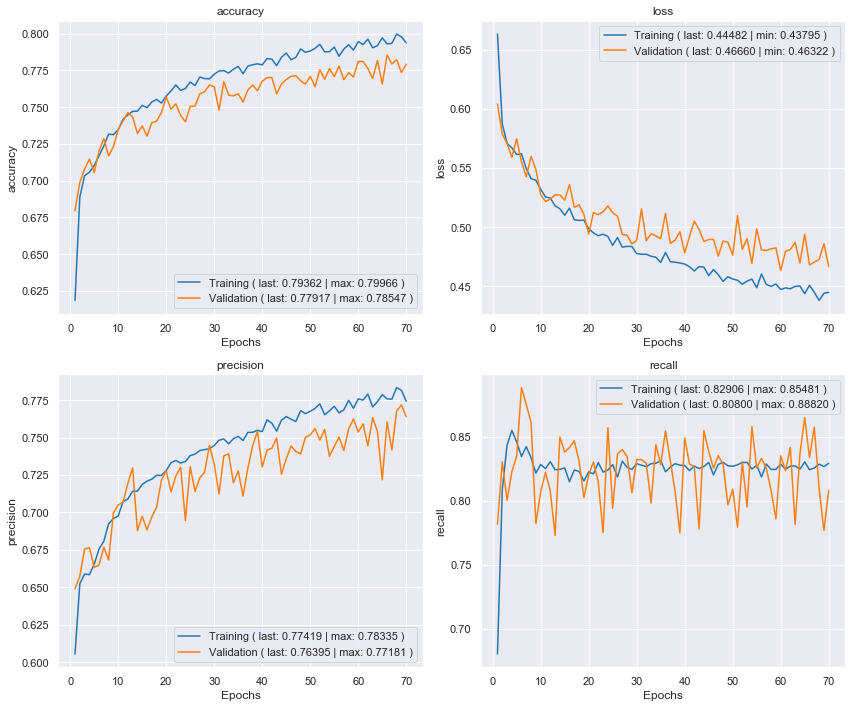

Validation confusion matrix


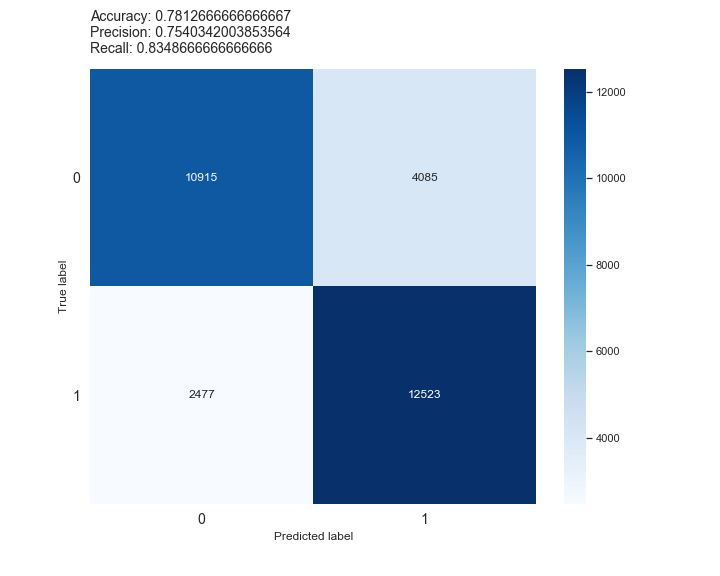

In [23]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'pre_trained_embedding': 'Glove50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 70,
        'previous_model_folder': '2021-02-11T16-54-12.650904'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-26T04-34-07.406905
Skipping training
Minimum val_loss: 0.6581583619117737 - Epoch: 22
Training times
training_time (0 => 10): 1:42:05.746261
training_time (10 => 20): 1:39:01.798828
training_time (20 => 30): 1:33:37.781829
training_time (30 => 40): 1:43:07.871754


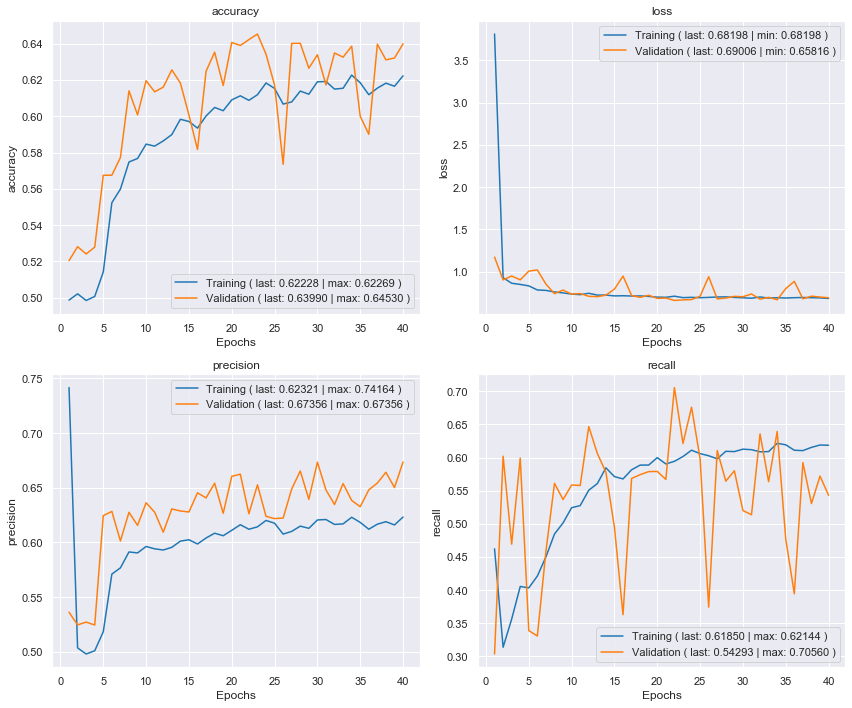

Validation confusion matrix


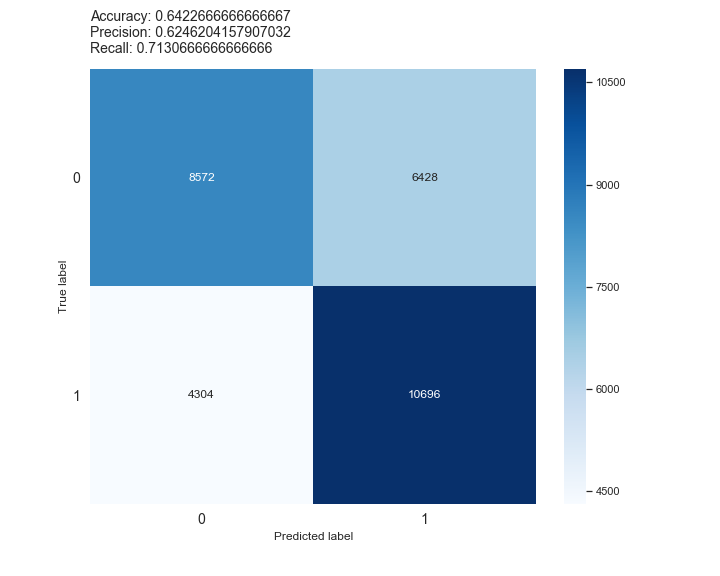

In [24]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'Glove50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 40,
        'previous_model_folder': '2021-02-26T04-34-07.406905'
    }
)

#### Other tests

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-09T19-01-08.160253
Epoch 1/10
2000/2000 [==============================] - 642s 321ms/step - loss: 3.6203 - accuracy: 0.5033 - precision: 0.5116 - recall: 0.1451 - val_loss: 1.4186 - val_accuracy: 0.5085 - val_precision: 0.5190 - val_recall: 0.2325
Epoch 2/10
2000/2000 [==============================] - 639s 319ms/step - loss: 0.9155 - accuracy: 0.4979 - precision: 0.4973 - recall: 0.3791 - val_loss: 1.0140 - val_accuracy: 0.5363 - val_precision: 0.5464 - val_recall: 0.4267
Epoch 3/10
2000/2000 [==============================] - 629s 314ms/step - loss: 0.8526 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.4353 - val_loss: 0.9944 - val_accuracy: 0.5373 - val_precision: 0.5459 - val_recall: 0.4437
Epoch 4/10
2000/2000 [==============================] - 629s 314ms/step - loss: 0.8563 - accuracy: 0.5028 - precision: 0.5029 - recall: 0.4839 - val_loss: 0.9827 - val_accuracy: 0.5331 - val_precision: 0.5394 - val_recall: 0.4523
E

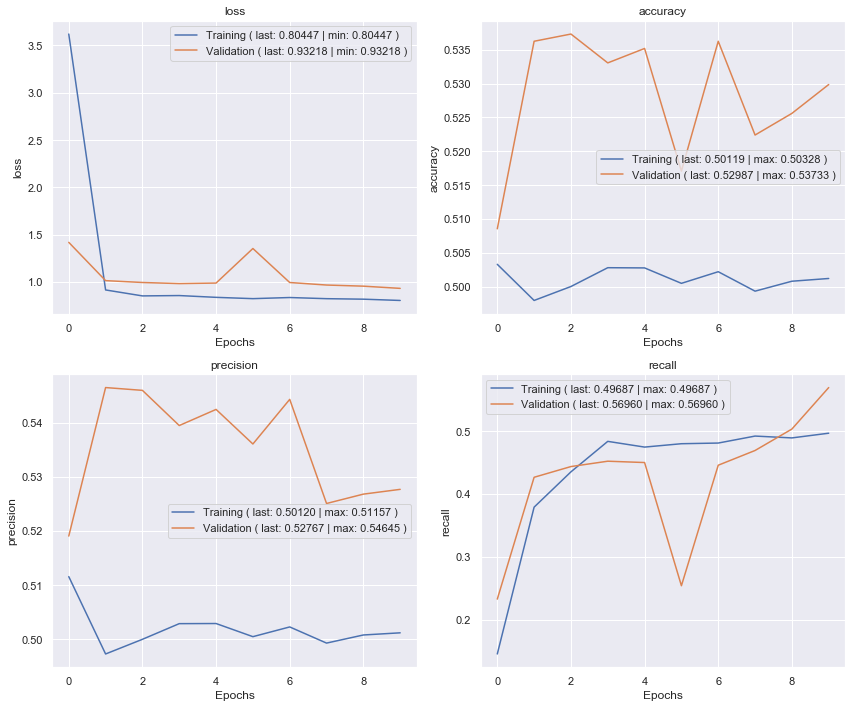

Validation confusion matrix


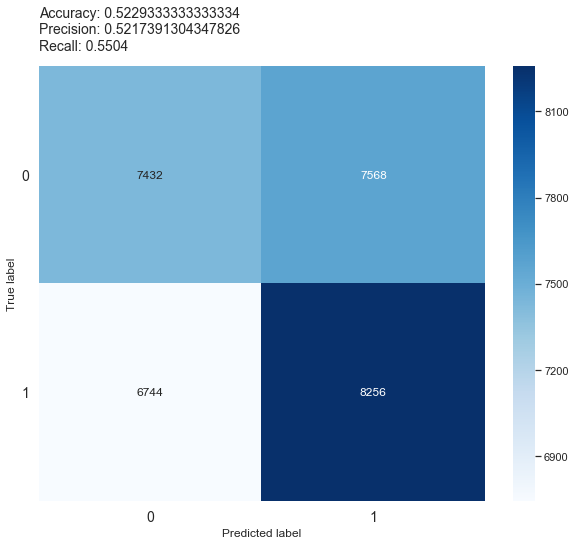

Training time: 2:23:14.207625


In [3]:
# 2021-02-09T19-01-08.160253
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'Glove50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 5,
            'd_model': 50,
            'num_heads': 5,
            'd_ff': 50,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

In [7]:
# 2021-02-02T22-52-59.208348
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'Glove',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 300,
            'num_heads': 4,
            'd_ff': 32,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-02T22-52-59.208348
Epoch 1/10
2000/2000 [==============================] - 685s 342ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
2000/2000 [==============================] - 684s 342ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
2000/2000 [==============================] - 684s 342ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/10
2000/2000 [==============================] - 684s 342ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accurac

KeyboardInterrupt: 

### Word2Vec

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-11T19-35-34.412902
Skipping training
Minimum val_loss: 0.5149941444396973 - Epoch: 40
Training times
training_time: 1:14:16.369997
training_time (10 => 20): 1:28:19.738155
training_time (20 => 30): 1:38:39.425188
training_time (30 => 40): 1:23:31.725118
training_time (49 => 50): 0:20:58.957517


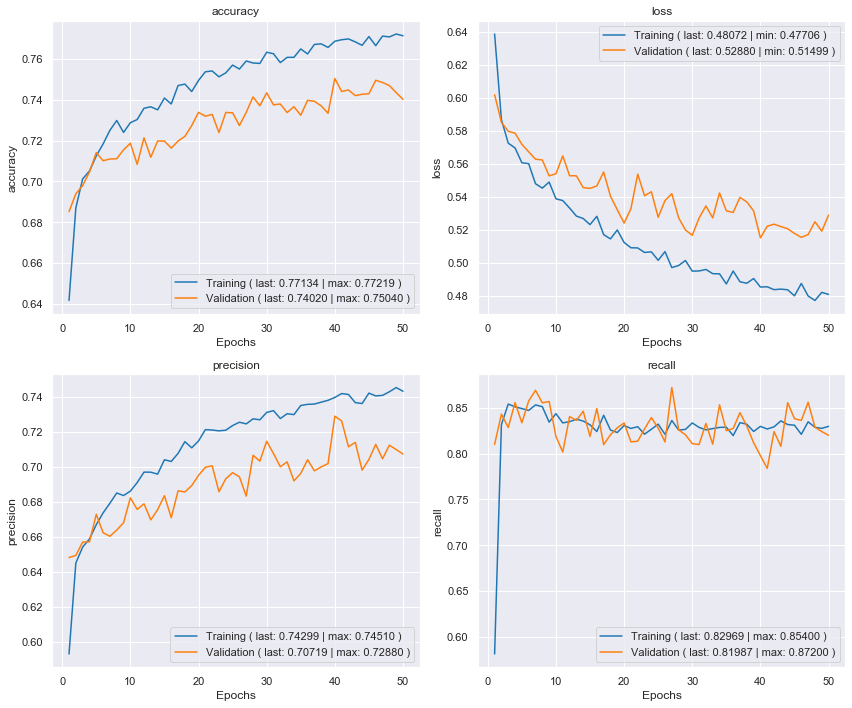

Validation confusion matrix


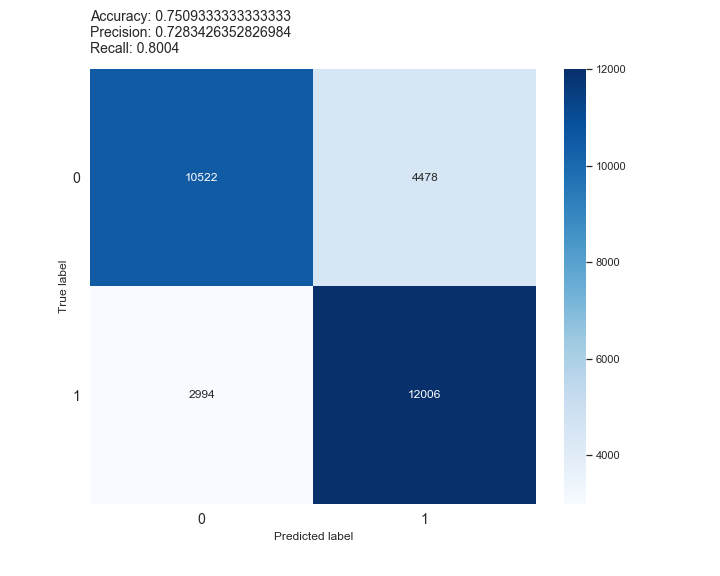

In [25]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'pre_trained_embedding': 'Word2Vec50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 50,
        'previous_model_folder': '2021-02-11T19-35-34.412902'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-11T20-49-50.809050
Skipping training
Minimum val_loss: 0.6608126163482666 - Epoch: 43
Training times
training_time: 1:13:14.198633
training_time (10 => 20): 1:14:45.239110
training_time (20 => 30): 1:48:33.794180
training_time (38 => 40): 0:24:33.850477
training_time (40 => 50): 1:25:24.861838
training_time (50 => 60): 1:41:10.824914


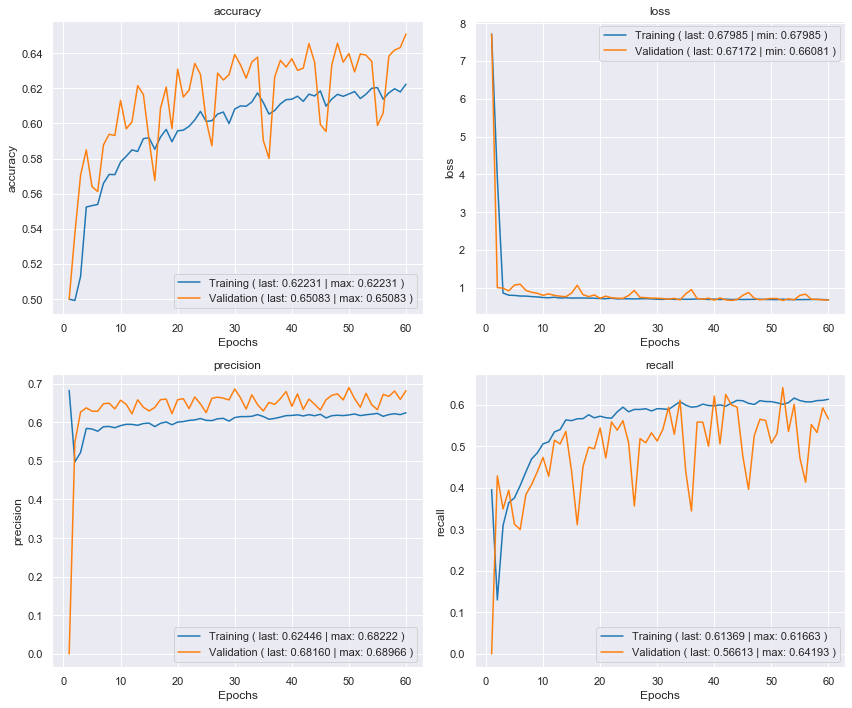

Validation confusion matrix


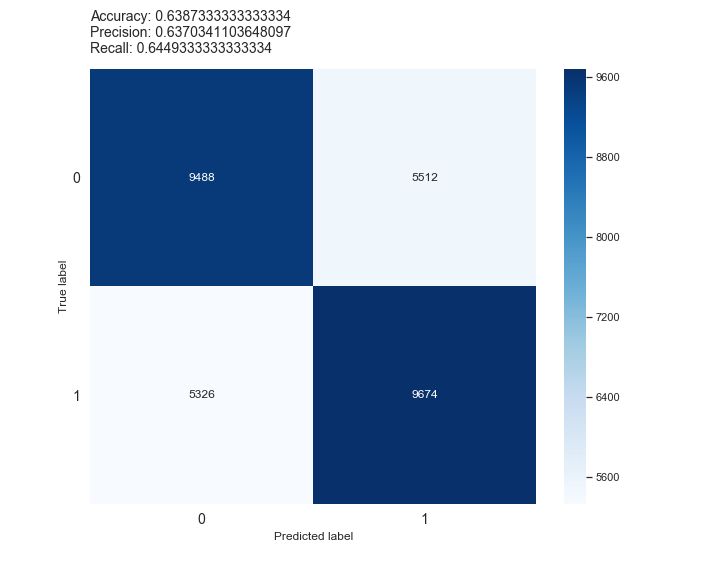

In [26]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'Word2Vec50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 60,
        'previous_model_folder': '2021-02-11T20-49-50.809050'
    }
)

### FastText

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-18T23-10-05.018756
Skipping training
Minimum val_loss: 0.4720060229301453 - Epoch: 40
Training times
training_time: 1:13:12.215037
training_time (10 => 20): 1:16:11.793336
training_time (20 => 30): 1:40:06.193292
training_time (30 => 40): 1:14:25.403782
training_time (40 => 50): 1:41:58.181803


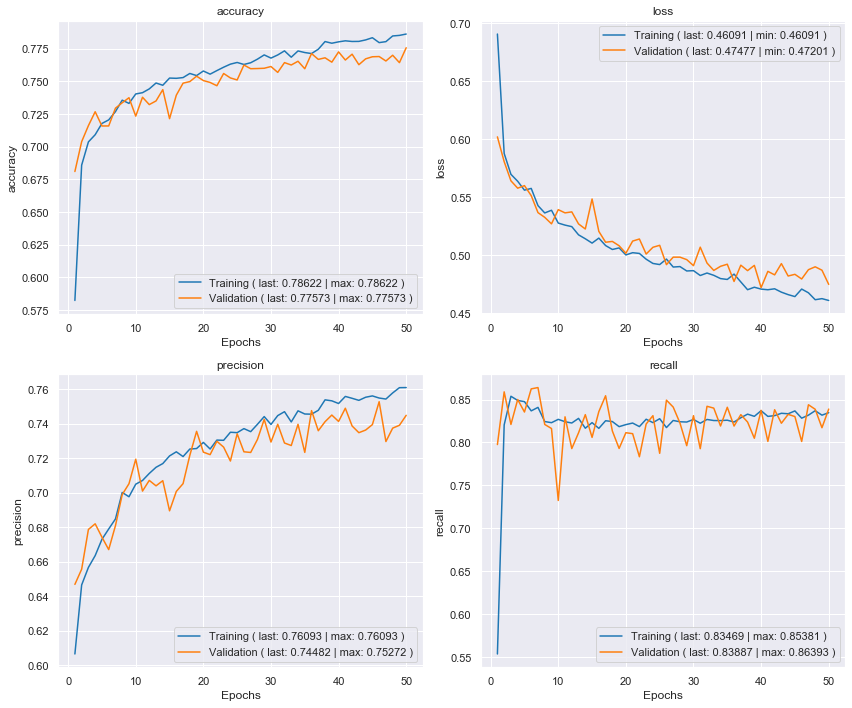

Validation confusion matrix


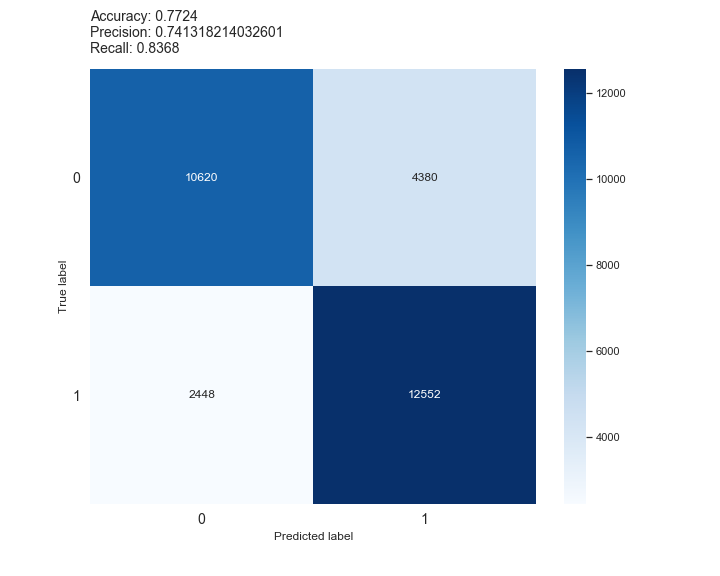

In [27]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'pre_trained_embedding': 'FastText50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 50,
        'previous_model_folder': '2021-02-18T23-10-05.018756'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-11T23-16-17.239982
Skipping training
Minimum val_loss: 0.6119263768196106 - Epoch: 103
Training times
training_time: 1:16:24.616678
training_time (10 => 20): 1:14:39.912794
training_time (20 => 30): 1:17:31.079928
training_time (30 => 40): 1:14:16.703402
training_time (40 => 50): 1:40:44.739442
training_time (50 => 60): 1:26:57.794745
training_time (60 => 70): 1:30:56.775823
training_time (78 => 80): 0:31:25.560050
training_time (80 => 90): 1:31:57.486164
training_time (90 => 100): 1:33:41.374581
training_time (100 => 110): 1:15:54.211853
training_time (110 => 120): 1:14:20.081352


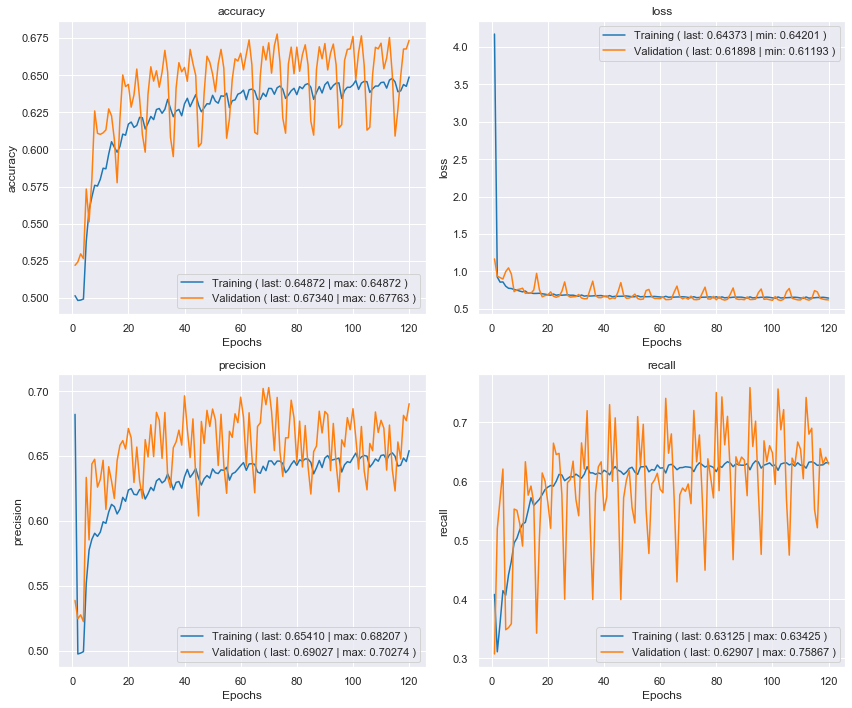

Validation confusion matrix


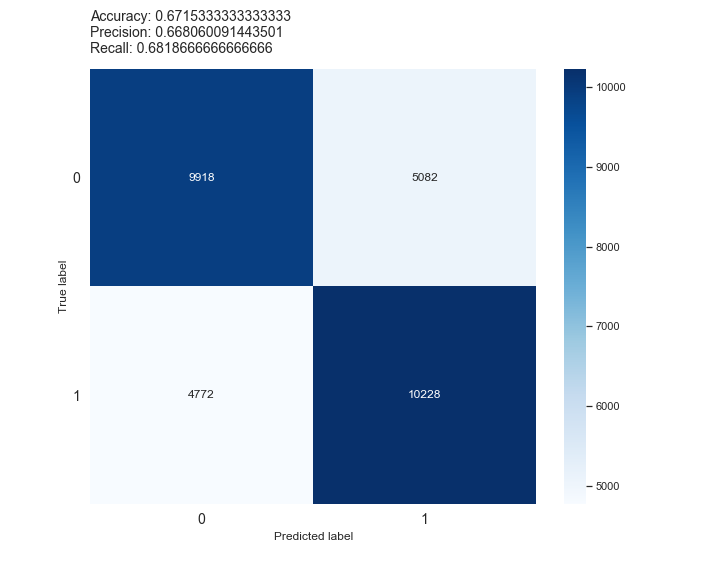

In [28]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'pre_trained_embedding': 'FastText50',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 50,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0.1
        },
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 120,
        'previous_model_folder': '2021-02-11T23-16-17.239982'
    }
)

### Other tests

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-02T20-40-12.261797
Epoch 1/10
2000/2000 [==============================] - 690s 345ms/step - loss: 0.5848 - accuracy: 0.6925 - precision: 0.6946 - recall: 0.7794 - val_loss: 0.5546 - val_accuracy: 0.7198 - val_precision: 0.6750 - val_recall: 0.8477
Epoch 2/10
2000/2000 [==============================] - 688s 344ms/step - loss: 0.4883 - accuracy: 0.7760 - precision: 0.7321 - recall: 0.8703 - val_loss: 0.5455 - val_accuracy: 0.7357 - val_precision: 0.7504 - val_recall: 0.7063
Epoch 3/10
2000/2000 [==============================] - 689s 345ms/step - loss: 0.4591 - accuracy: 0.7949 - precision: 0.7550 - recall: 0.8732 - val_loss: 0.4921 - val_accuracy: 0.7808 - val_precision: 0.7574 - val_recall: 0.8261
Epoch 4/10
2000/2000 [==============================] - 689s 345ms/step - loss: 0.4339 - accuracy: 0.8113 - precision: 0.7774 - recall: 0.8723 - val_loss: 0.4592 - val_accuracy: 0.7946 - val_precision: 0.7487 - val_recall: 0.8867
E

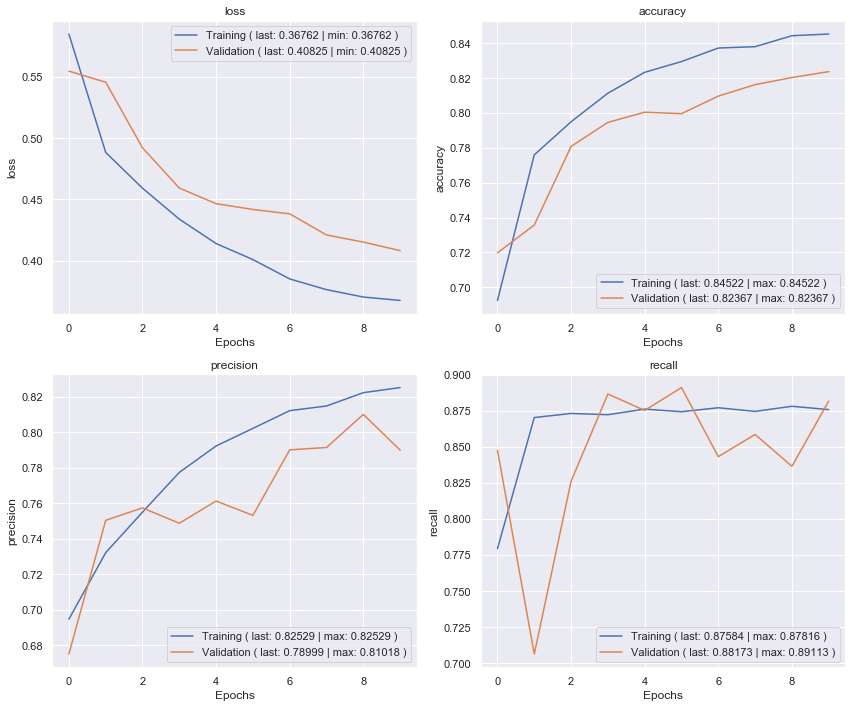

Validation confusion matrix


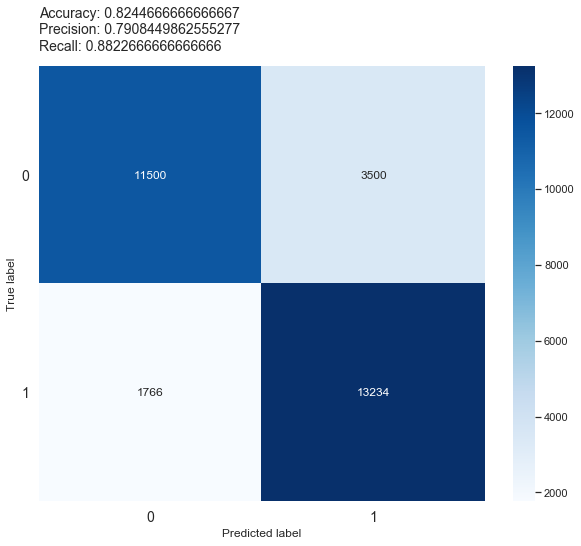

Training time: 2:05:33.561569


In [3]:
# 2020-06-02T20-40-12.261797
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 16,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0
        },
        'training_batch_size': 32,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-03T21-12-25.066890
Epoch 1/10
2000/2000 [==============================] - 1334s 667ms/step - loss: 0.5660 - accuracy: 0.7101 - precision: 0.6934 - recall: 0.7582 - val_loss: 0.5351 - val_accuracy: 0.7505 - val_precision: 0.6962 - val_recall: 0.8887
Epoch 2/10
2000/2000 [==============================] - 1332s 666ms/step - loss: 0.4550 - accuracy: 0.7995 - precision: 0.7628 - recall: 0.8692 - val_loss: 0.4787 - val_accuracy: 0.7823 - val_precision: 0.7423 - val_recall: 0.8649
Epoch 3/10
2000/2000 [==============================] - 1335s 667ms/step - loss: 0.4099 - accuracy: 0.8266 - precision: 0.7986 - recall: 0.8736 - val_loss: 0.4462 - val_accuracy: 0.8077 - val_precision: 0.8002 - val_recall: 0.8201
Epoch 4/10
2000/2000 [==============================] - 1538s 769ms/step - loss: 0.3890 - accuracy: 0.8354 - precision: 0.8108 - recall: 0.8749 - val_loss: 0.4236 - val_accuracy: 0.8180 - val_precision: 0.8100 - val_recall: 0.83

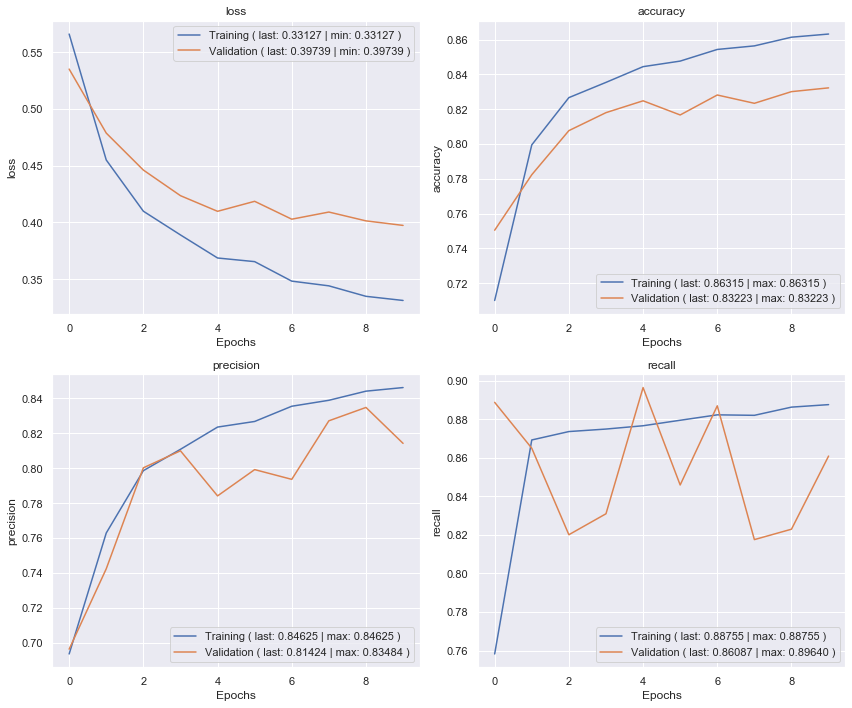

Validation confusion matrix


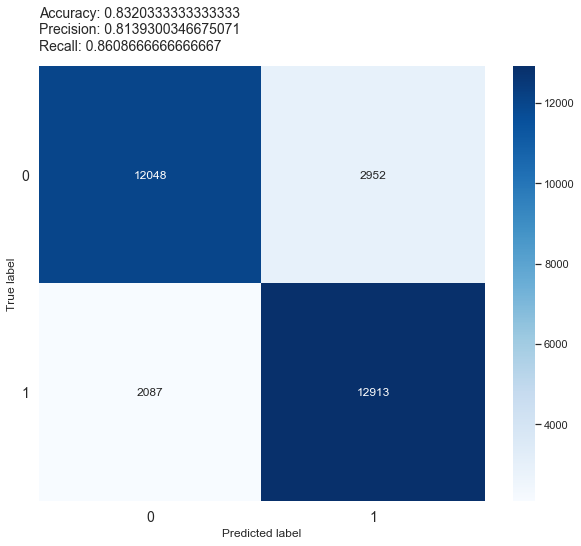

Training time: 4:47:55.911905


In [4]:
# 2020-06-03T21-12-25.066890
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 16,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0
        },
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-03T14-38-27.707711
Epoch 1/10
2000/2000 [==============================] - 1327s 664ms/step - loss: 2.2319 - accuracy: 0.5674 - precision: 0.5994 - recall: 0.4066 - val_loss: 0.6366 - val_accuracy: 0.6740 - val_precision: 0.6978 - val_recall: 0.6139
Epoch 2/10
2000/2000 [==============================] - 1328s 664ms/step - loss: 0.6460 - accuracy: 0.6490 - precision: 0.6484 - recall: 0.6512 - val_loss: 0.5896 - val_accuracy: 0.6961 - val_precision: 0.6997 - val_recall: 0.6873
Epoch 3/10
2000/2000 [==============================] - 1346s 673ms/step - loss: 0.6222 - accuracy: 0.6681 - precision: 0.6675 - recall: 0.6697 - val_loss: 0.5810 - val_accuracy: 0.6982 - val_precision: 0.6856 - val_recall: 0.7322
Epoch 4/10
2000/2000 [==============================] - 1757s 878ms/step - loss: 0.6194 - accuracy: 0.6734 - precision: 0.6731 - recall: 0.6740 - val_loss: 0.6006 - val_accuracy: 0.6971 - val_precision: 0.7224 - val_recall: 0.64

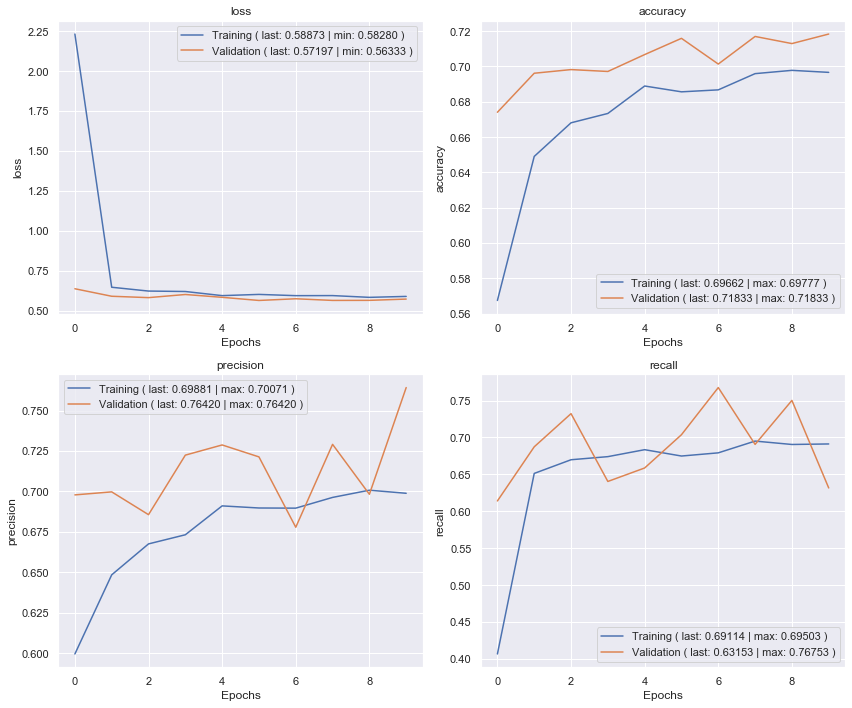

Validation confusion matrix


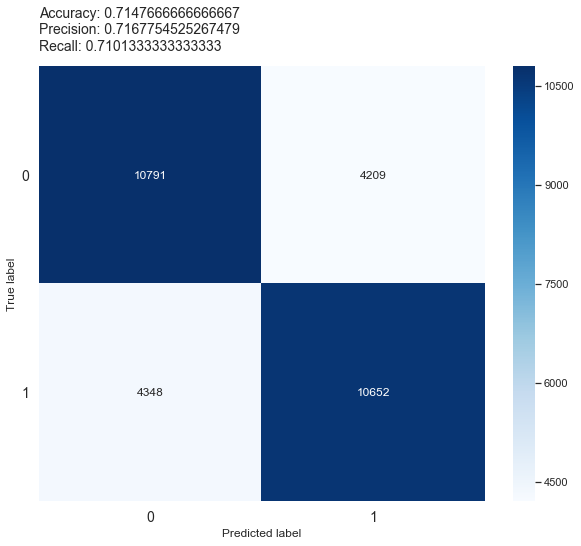

Training time: 4:44:19.464457


In [2]:
# 2020-06-03T14-38-27.707711
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 16,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0
        },
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-05-27T18-18-44.941586
Epoch 1/10
2000/2000 [==============================] - 209s 105ms/step - loss: 2.2220 - accuracy: 0.5501 - precision: 0.5817 - recall: 0.3566 - val_loss: 0.7209 - val_accuracy: 0.6322 - val_precision: 0.6764 - val_recall: 0.5069
Epoch 2/10
2000/2000 [==============================] - 207s 103ms/step - loss: 0.7092 - accuracy: 0.6208 - precision: 0.6307 - recall: 0.5830 - val_loss: 0.6782 - val_accuracy: 0.6462 - val_precision: 0.6668 - val_recall: 0.5845
Epoch 3/10
2000/2000 [==============================] - 206s 103ms/step - loss: 0.6854 - accuracy: 0.6324 - precision: 0.6404 - recall: 0.6040 - val_loss: 0.6312 - val_accuracy: 0.6754 - val_precision: 0.6923 - val_recall: 0.6314
Epoch 4/10
2000/2000 [==============================] - 206s 103ms/step - loss: 0.6688 - accuracy: 0.6369 - precision: 0.6445 - recall: 0.6104 - val_loss: 0.6561 - val_accuracy: 0.6538 - val_precision: 0.6625 - val_recall: 0.6270
E

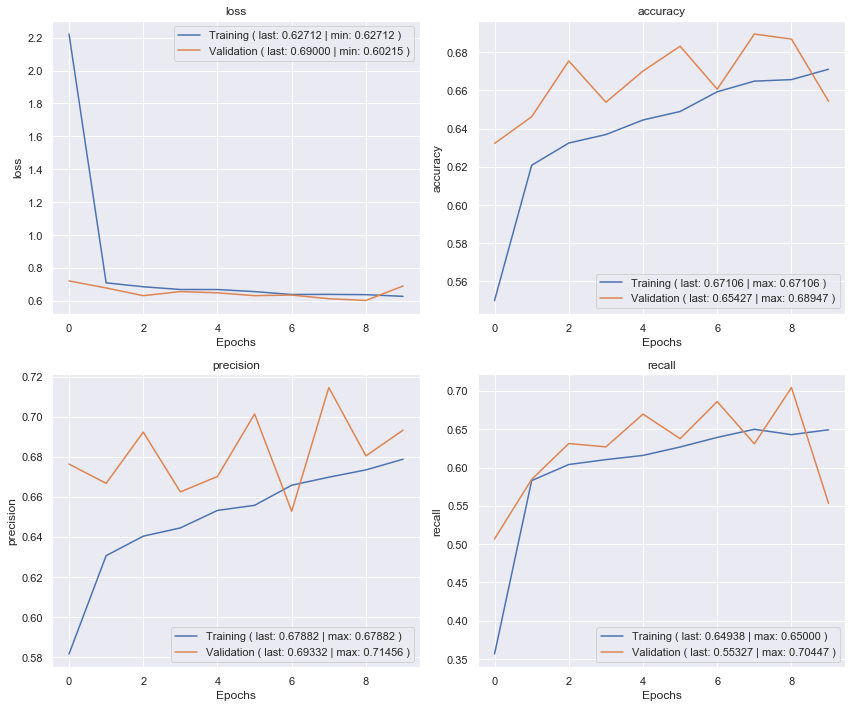

Validation confusion matrix


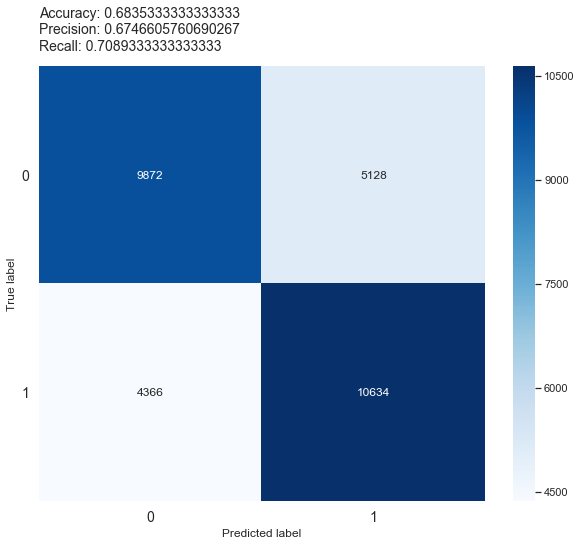

Training time: 0:45:07.068724


In [2]:
# 2020-05-27T18-18-44.941586
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 16,
            'num_heads': 2,
            'd_ff': 16,
            'dropout_rate': 0
        },
        'training_batch_size': 8,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-05-29T19-11-43.474292
Epoch 1/10
2000/2000 [==============================] - 741s 370ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.7471 - recall: 0.1927 - val_loss: 7.7125 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
2000/2000 [==============================] - 738s 369ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
2000/2000 [==============================] - 739s 370ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/10
2000/2000 [==============================] - 740s 370ms/step - loss: 7.7126 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7125 - val_accuracy: 0.500

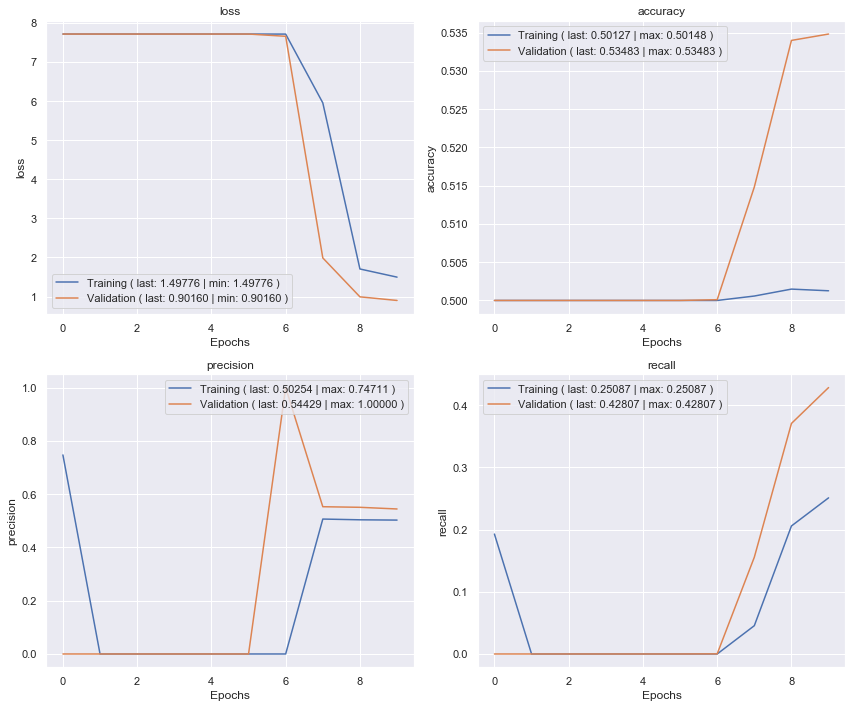

Validation confusion matrix


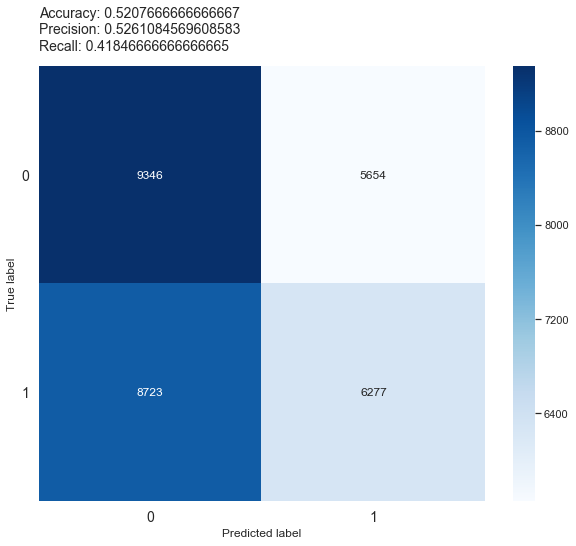

Training time: 2:14:27.635670


In [3]:
# 2020-05-29T19-11-43.474292
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 2,
            'd_model': 256,
            'num_heads': 2,
            'd_ff': 256,
            'dropout_rate': 0
        },
        'training_batch_size': 32,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-05-29T16-48-20.338570
Epoch 1/10
2000/2000 [==============================] - 796s 398ms/step - loss: 2.8095 - accuracy: 0.5437 - precision: 0.5858 - recall: 0.2982 - val_loss: 0.7313 - val_accuracy: 0.6344 - val_precision: 0.6828 - val_recall: 0.5021
Epoch 2/10
2000/2000 [==============================] - 795s 397ms/step - loss: 0.7249 - accuracy: 0.6200 - precision: 0.6336 - recall: 0.5693 - val_loss: 0.9023 - val_accuracy: 0.5876 - val_precision: 0.6478 - val_recall: 0.3841
Epoch 3/10
2000/2000 [==============================] - 791s 396ms/step - loss: 0.6830 - accuracy: 0.6388 - precision: 0.6525 - recall: 0.5938 - val_loss: 0.6175 - val_accuracy: 0.6666 - val_precision: 0.6569 - val_recall: 0.6976
Epoch 4/10
2000/2000 [==============================] - 788s 394ms/step - loss: 0.6624 - accuracy: 0.6488 - precision: 0.6612 - recall: 0.6103 - val_loss: 0.6251 - val_accuracy: 0.6607 - val_precision: 0.6511 - val_recall: 0.6924
E

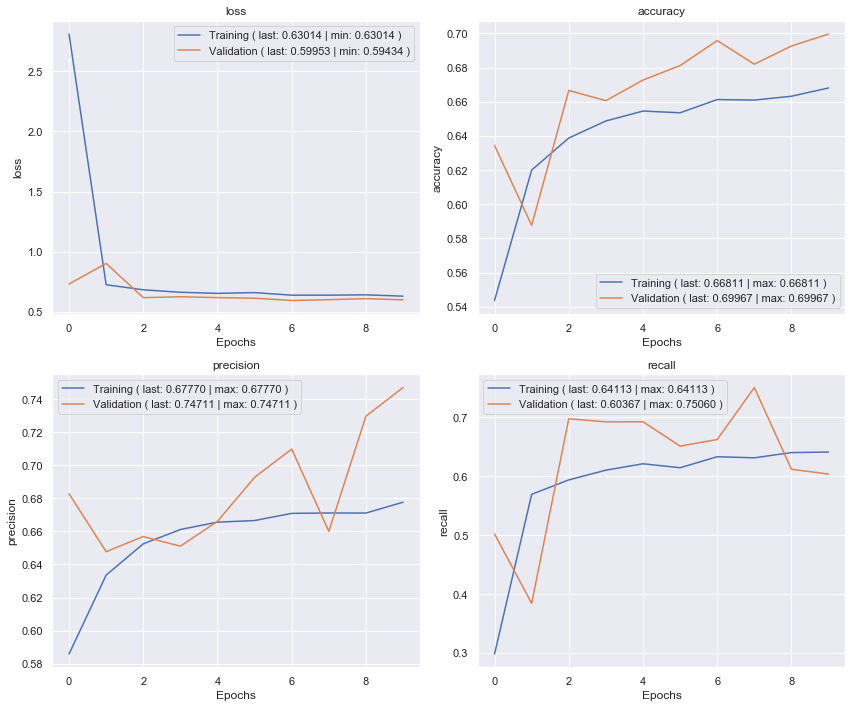

Validation confusion matrix


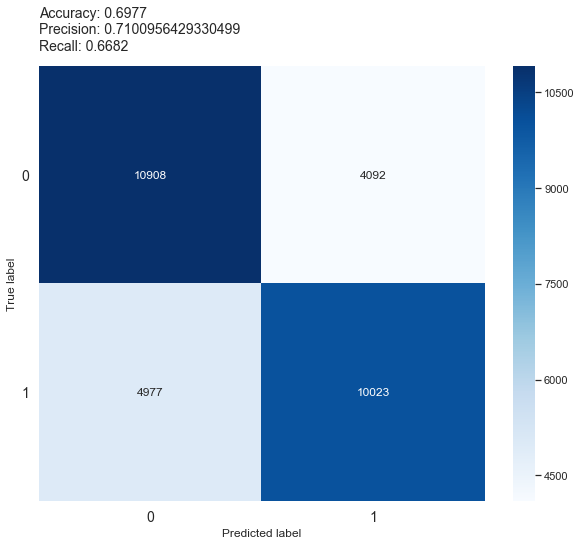

Training time: 2:23:23.127735


In [2]:
# 2020-05-29T16-48-20.338570
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'Tokenized',
        'type': 'SNN + Transformer',
        'snn_output_type': 'Manhattan',
        'vocabulary_size': 10000,
        'maximum_sequence_length': 1000,
        'transformer_parameters': {
            'num_layers': 4,
            'd_model': 32,
            'num_heads': 4,
            'd_ff': 32,
            'dropout_rate': 0
        },
        'training_batch_size': 32,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 10
    }
)

### Testing

In [119]:
from Transformer import Encoder, PaddingMask


inputs1 = tf.random.uniform((32, 100), dtype = tf.int64, minval = 1, maxval = 101)
inputs2 = tf.random.uniform((32, 100), dtype = tf.int64, minval = 1, maxval = 201)
inputs = tf.concat([inputs1, inputs2], axis = 0).numpy()

for sentenceIndex in range(inputs.shape[0]):
    for wordIndex in range(np.random.randint(50)):
        inputs[sentenceIndex][wordIndex] = 0

inputs = tf.convert_to_tensor(inputs)


padding_mask = PaddingMask()(inputs)

encoder = Encoder(
    num_layers = 2,
    d_model = 256,
    num_heads = 8,
    d_ff = 2048,
    vocab_size = 10000,
    dropout_rate = 0
)

encoder_output, encoder_attention = encoder(inputs, padding_mask)


print(inputs.shape)
print(encoder_output.shape)  # (batch_size, input_seq_len, d_model)

(64, 100)
(64, 100, 256)


In [2]:
import numpy as np
from tensorflow.keras.layers import Bidirectional, concatenate, Dense, Embedding, Input, Lambda, LSTM, GlobalAveragePooling1D
from tensorflow.keras.models import Model, Sequential
from functools import reduce
import tensorflow as tf
from Transformer import Encoder, PaddingMask
from tensorflow.keras import backend as K


precision = tf.keras.metrics.Precision()
recall = tf.keras.metrics.Recall()

n = 3000
maximum_sequence_length = 1000
vocabulary_size = 10000

maximum_number_of_words = vocabulary_size - 1

inputs1 = np.concatenate([
    np.random.randint(maximum_number_of_words / 2, size = (int(n / 4), maximum_sequence_length)) + 1,
    np.random.randint(maximum_number_of_words / 2, size = (int(n / 4), maximum_sequence_length)) + 1,
    np.random.randint(maximum_number_of_words, size = (int(n / 4), maximum_sequence_length)) + 1,
    np.random.randint(maximum_number_of_words, size = (int(n / 4), maximum_sequence_length)) + 1
])
inputs2 = np.concatenate([
    np.random.randint(maximum_number_of_words / 2, size = (int(n / 4), maximum_sequence_length)) + 1,
    np.random.randint(maximum_number_of_words, size = (int(n / 4), maximum_sequence_length)) + 1,
    np.random.randint(maximum_number_of_words / 2, size = (int(n / 4), maximum_sequence_length)) + 1,
    np.random.randint(maximum_number_of_words, size = (int(n / 4), maximum_sequence_length)) + 1
])
outputs = np.concatenate([
    np.ones((int(n / 4), 1)),
    np.zeros((int(n / 4), 1)),
    np.zeros((int(n / 4), 1)),
    np.ones((int(n / 4), 1))
])
# outputs = np.zeros((n, 1))
d = (
    [
        inputs1,
        inputs2
    ],
    outputs
)


input_1 = Input(shape = (maximum_sequence_length,))
input_2 = Input(shape = (maximum_sequence_length,))

encoder = Encoder(
    num_layers = 4,
    d_model = 32,
    num_heads = 4,
    d_ff = 32,
    vocab_size = vocabulary_size,
    dropout_rate = 0
)

def encoder_with_mask(input_n):
    padding_mask = PaddingMask()(input_n)
    encoder_output, encoder_attention = encoder(input_n, padding_mask)
#     return GlobalAveragePooling1D()(encoder_output)
    return K.sum(encoder_output, axis = 1) / 100000#K.sum(K.cast_to_floatx(padding_mask[0] == 0))
#     return K.sum(encoder_output, axis = 1) / K.sqrt(K.sum(K.cast_to_floatx(padding_mask[0] == 0)))

features_1 = encoder_with_mask(input_1) # (None, 200, 256)
features_2 = encoder_with_mask(input_2)

# output = reduce(lambda output, layer: layer(output), [
#     concatenate([features_1, features_2]),
#     Dense(
#         units = 256,
#         activation = 'relu'
#     ),
#     Dense(
#         units = 256,
#         activation = 'relu'
#     ),
#     Dense(
#         units = 1,
#         activation = 'sigmoid'
#     )
# ])
output = Lambda(
    function = lambda x: K.exp(-K.sum(K.abs(x[0] - x[1]), axis = 1, keepdims = True)),
    output_shape = lambda x: (x[0][0], 1)
)([features_1, features_2])

model = Model(inputs = [input_1, input_2], outputs = [output])

model.compile(
    loss = 'binary_crossentropy',
    optimizer = 'adam',
    metrics = ['accuracy', precision, recall]
)

history = model.fit(
    x = d[0],
    y = d[1],
    batch_size = 4,
    epochs = 2,
    verbose = 1,
    validation_data = d
)

print('Done!')

Train on 3000 samples, validate on 3000 samples
Epoch 1/2
3000/3000 [==============================] - 54s 18ms/sample - loss: 0.3220 - accuracy: 0.9203 - precision_1: 0.8626 - recall_1: 1.0000 - val_loss: 0.2338 - val_accuracy: 1.0000 - val_precision_1: 1.0000 - val_recall_1: 1.0000
Epoch 2/2
3000/3000 [==============================] - 47s 16ms/sample - loss: 0.1952 - accuracy: 1.0000 - precision_1: 1.0000 - recall_1: 1.0000


KeyboardInterrupt: 

In [2]:
from STJModels import create_model, load_experiment_data

parameters = {
    'text_processing_type': 'clean_report_without_nltk_stopwords',
    'representation_type': 'Tokenized',
    'type': 'SNN + Transformer',
    'snn_output_type': 'Manhattan',
    'vocabulary_size': 10000,
    'maximum_sequence_length': 1000,
    'transformer_parameters': {
        'num_layers': 8,
        'd_model': 64,
        'num_heads': 8,
        'd_ff': 64,
        'dropout_rate': 0
    },
    'training_batch_size': 4,
    'validation_batch_size': 30000,
    'steps_per_epoch': 2000,
    'epochs': 10
}

training_generator, validation_data = load_experiment_data(data_path, parameters)

In [6]:
parameters = {
    'text_processing_type': 'clean_report_without_nltk_stopwords',
    'representation_type': 'Tokenized',
    'type': 'SNN + Transformer',
    'snn_output_type': 'Manhattan',
    'vocabulary_size': 10000,
    'maximum_sequence_length': 1000,
    'transformer_parameters': {
        'num_layers': 2,
        'd_model': 16,
        'num_heads': 2,
        'd_ff': 16,
        'dropout_rate': 0
    },
    'training_batch_size': 4,
    'validation_batch_size': 30000,
    'steps_per_epoch': 2000,
    'epochs': 4
}

model = create_model(parameters)

history = model.fit(
    x = validation_data[0],
    y = validation_data[1],
    batch_size = parameters['training_batch_size'],
    epochs = parameters['epochs'],
    verbose = 1,
    validation_data = validation_data
).history

Train on 30000 samples, validate on 30000 samples
Epoch 1/4
30000/30000 [==============================] - 181s 6ms/sample - loss: 1.1555 - accuracy: 0.6099 - precision: 0.6363 - recall: 0.5130 - val_loss: 0.5735 - val_accuracy: 0.7049 - val_precision: 0.6883 - val_recall: 0.7488
Epoch 2/4
30000/30000 [==============================] - 177s 6ms/sample - loss: 0.6171 - accuracy: 0.6842 - precision: 0.6978 - recall: 0.6496 - val_loss: 0.5278 - val_accuracy: 0.7398 - val_precision: 0.7317 - val_recall: 0.7575
Epoch 3/4
30000/30000 [==============================] - 177s 6ms/sample - loss: 0.5644 - accuracy: 0.7169 - precision: 0.7269 - recall: 0.6947 - val_loss: 0.4961 - val_accuracy: 0.7589 - val_precision: 0.7254 - val_recall: 0.8331
Epoch 4/4
30000/30000 [==============================] - 183s 6ms/sample - loss: 0.5269 - accuracy: 0.7425 - precision: 0.7497 - recall: 0.7283 - val_loss: 0.4382 - val_accuracy: 0.7996 - val_precision: 0.8047 - val_recall: 0.7911


In [5]:
parameters = {
    'text_processing_type': 'clean_report_without_nltk_stopwords',
    'representation_type': 'Tokenized',
    'type': 'SNN + Transformer',
    'snn_output_type': 'Manhattan',
    'vocabulary_size': 10000,
    'maximum_sequence_length': 1000,
    'transformer_parameters': {
        'num_layers': 4,
        'd_model': 32,
        'num_heads': 4,
        'd_ff': 32,
        'dropout_rate': 0
    },
    'training_batch_size': 4,
    'validation_batch_size': 30000,
    'steps_per_epoch': 2000,
    'epochs': 4
}

model = create_model(parameters)

history = model.fit(
    x = validation_data[0],
    y = validation_data[1],
    batch_size = parameters['training_batch_size'],
    epochs = parameters['epochs'],
    verbose = 1,
    validation_data = validation_data
).history

Train on 30000 samples, validate on 30000 samples
Epoch 1/4
30000/30000 [==============================] - 496s 17ms/sample - loss: 2.1414 - accuracy: 0.5642 - precision: 0.6000 - recall: 0.3851 - val_loss: 0.6405 - val_accuracy: 0.6533 - val_precision: 0.6653 - val_recall: 0.6170
Epoch 2/4
30000/30000 [==============================] - 491s 16ms/sample - loss: 0.7347 - accuracy: 0.6152 - precision: 0.6340 - recall: 0.5452 - val_loss: 0.6748 - val_accuracy: 0.6285 - val_precision: 0.6199 - val_recall: 0.6647
Epoch 3/4
30000/30000 [==============================] - 493s 16ms/sample - loss: 0.7113 - accuracy: 0.6277 - precision: 0.6434 - recall: 0.5729 - val_loss: 0.6542 - val_accuracy: 0.6577 - val_precision: 0.6922 - val_recall: 0.5679
Epoch 4/4
30000/30000 [==============================] - 492s 16ms/sample - loss: 0.6881 - accuracy: 0.6378 - precision: 0.6533 - recall: 0.5871 - val_loss: 0.7221 - val_accuracy: 0.6341 - val_precision: 0.6853 - val_recall: 0.4959


In [3]:
parameters = {
    'text_processing_type': 'clean_report_without_nltk_stopwords',
    'representation_type': 'Tokenized',
    'type': 'SNN + Transformer',
    'snn_output_type': 'Manhattan',
    'vocabulary_size': 10000,
    'maximum_sequence_length': 1000,
    'transformer_parameters': {
        'num_layers': 8,
        'd_model': 64,
        'num_heads': 8,
        'd_ff': 64,
        'dropout_rate': 0
    },
    'training_batch_size': 4,
    'validation_batch_size': 30000,
    'steps_per_epoch': 2000,
    'epochs': 4
}

model = create_model(parameters)

history = model.fit(
    x = validation_data[0],
    y = validation_data[1],
    batch_size = parameters['training_batch_size'],
    epochs = parameters['epochs'],
    verbose = 1,
    validation_data = validation_data
).history

Epoch 1/4
7500/7500 [==============================] - 1602s 214ms/step - loss: 2.3797 - accuracy: 0.5055 - precision: 0.5089 - recall: 0.3127 - val_loss: 0.7861 - val_accuracy: 0.5442 - val_precision: 0.5394 - val_recall: 0.6053
Epoch 2/4
7500/7500 [==============================] - 1580s 211ms/step - loss: 0.9591 - accuracy: 0.5096 - precision: 0.5111 - recall: 0.4419 - val_loss: 0.9326 - val_accuracy: 0.5378 - val_precision: 0.5400 - val_recall: 0.5103
Epoch 3/4
7500/7500 [==============================] - 1580s 211ms/step - loss: 0.9401 - accuracy: 0.5108 - precision: 0.5119 - recall: 0.4654 - val_loss: 0.7998 - val_accuracy: 0.5475 - val_precision: 0.5513 - val_recall: 0.5101
Epoch 4/4
7500/7500 [==============================] - 1598s 213ms/step - loss: 0.8805 - accuracy: 0.5141 - precision: 0.5152 - recall: 0.4765 - val_loss: 0.7924 - val_accuracy: 0.5443 - val_precision: 0.5470 - val_recall: 0.5159


In [4]:
parameters = {
    'text_processing_type': 'clean_report_without_nltk_stopwords',
    'representation_type': 'Tokenized',
    'type': 'SNN + Transformer',
    'snn_output_type': 'Manhattan',
    'vocabulary_size': 10000,
    'maximum_sequence_length': 1000,
    'transformer_parameters': {
        'num_layers': 8,
        'd_model': 128,
        'num_heads': 8,
        'd_ff': 128,
        'dropout_rate': 0
    },
    'training_batch_size': 4,
    'validation_batch_size': 30000,
    'steps_per_epoch': 2000,
    'epochs': 4
}

model = create_model(parameters)

history = model.fit(
    x = validation_data[0],
    y = validation_data[1],
    batch_size = parameters['training_batch_size'],
    epochs = parameters['epochs'],
    verbose = 1,
    validation_data = validation_data
).history

Epoch 1/4
7500/7500 [==============================] - 1713s 228ms/step - loss: 7.7123 - accuracy: 0.5000 - precision: 0.5470 - recall: 0.2579 - val_loss: 7.7128 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/4
7500/7500 [==============================] - 1702s 227ms/step - loss: 7.7123 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7128 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/4
7500/7500 [==============================] - 1702s 227ms/step - loss: 7.7123 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7128 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/4
7500/7500 [==============================] - 1702s 227ms/step - loss: 7.7123 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7128 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00


## BERT

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-05-01T18-37-48.010760
Skipping training
Minimum val_loss: 0.5653246863365173 - Epoch: 6
Training times
training_time: 8:16:44.650940


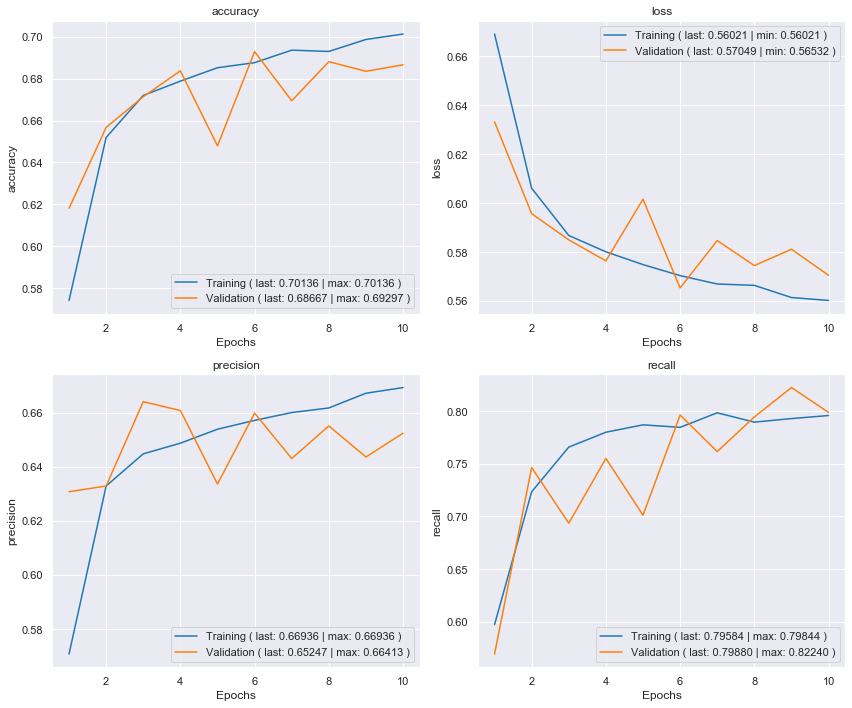

Validation confusion matrix


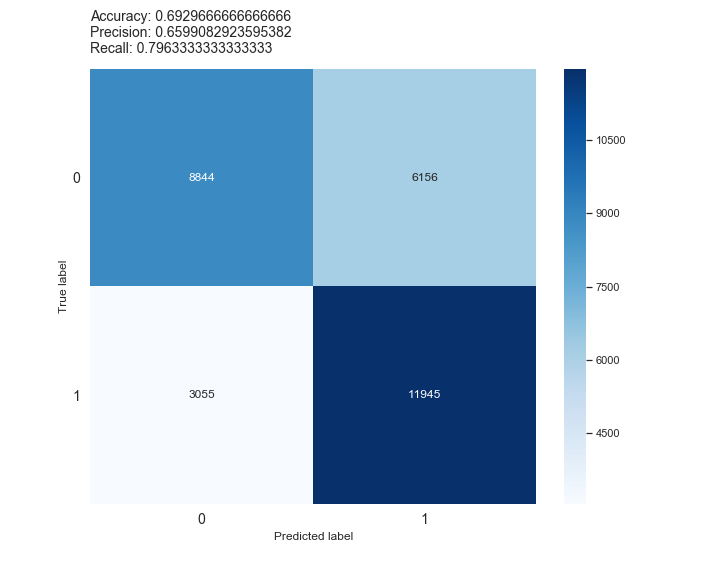

In [2]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'bert_tokenizer',
        'type': 'BERT',
        'snn_output_type': 'MLP',
        'maximum_sequence_length': 512,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 1000,
        'epochs': 10,
        'previous_model_folder': '2020-05-01T18-37-48.010760'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2020-06-05T18-12-25.367100
Epoch 1/10
1000/1000 [==============================] - 701s 701ms/step - loss: 7.7124 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7122 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
1000/1000 [==============================] - 709s 709ms/step - loss: 7.7124 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7122 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
1000/1000 [==============================] - 699s 699ms/step - loss: 7.7120 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7122 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 4/10
1000/1000 [==============================] - 699s 699ms/step - loss: 7.7115 - accuracy: 0.5000 - precision: 0.0000e+00 - recall: 0.0000e+00 - val_loss: 7.7122 - val_accurac

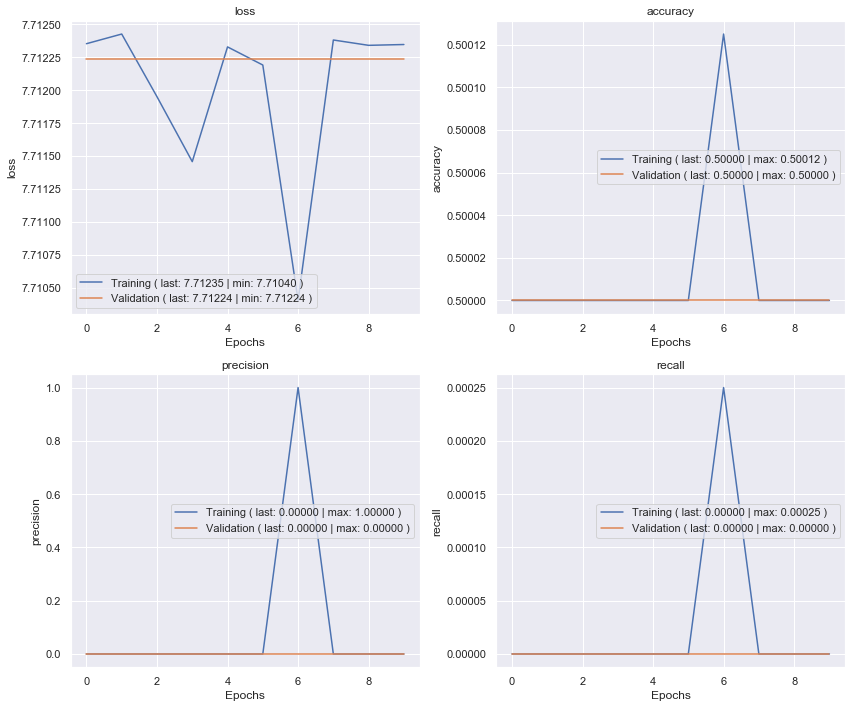

Validation confusion matrix


C:/Users/Gamer/Dropbox/Projetos/MLPython\Plot.py:104: RuntimeWarning: invalid value encountered in longlong_scalars
  f'Precision: {cm[1, 1] / (cm[1, 1] + cm[0, 1])}\n' +


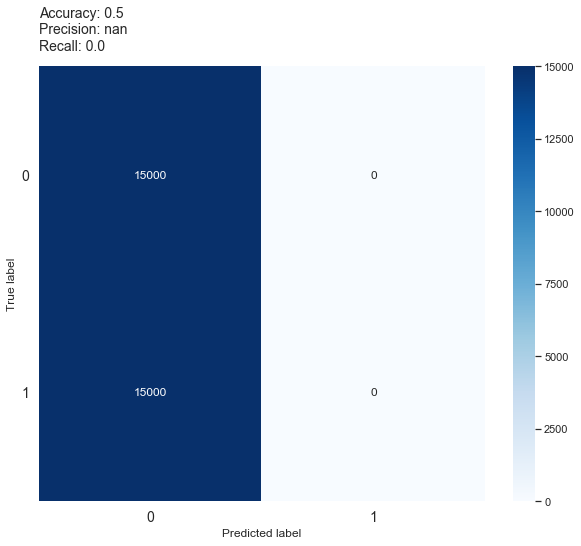

Training time: 2:21:21.340601


In [3]:
# 2020-06-05T18-12-25.367100
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'bert_tokenizer',
        'type': 'BERT',
        'snn_output_type': 'Manhattan',
        'maximum_sequence_length': 512,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 1000,
        'epochs': 10
    }
)

## Final Model

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-02-15T03-06-07.834443
Skipping training
Minimum val_loss: 0.3664770126342773 - Epoch: 15
Training times
training_time (20): 2:33:14.907348
training_time (30): 1:34:59.508089


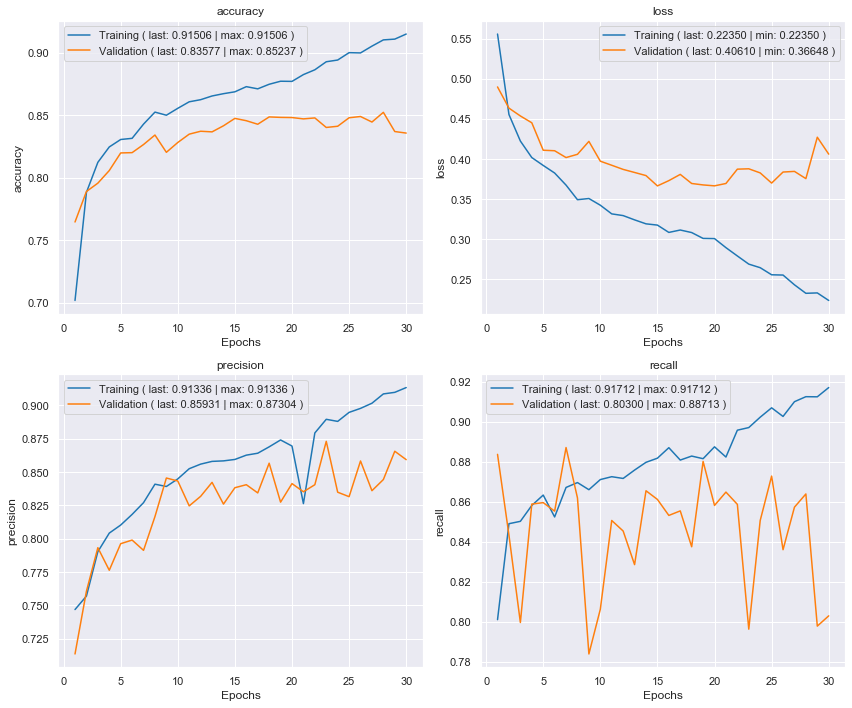

Validation confusion matrix


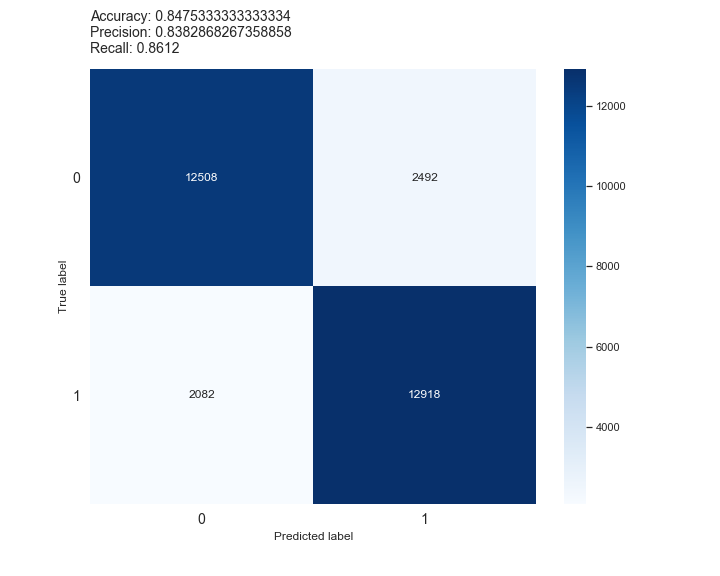

In [2]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 30,
        'previous_model_folder': '2021-02-15T03-06-07.834443'
    }
)

### Dropout

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-01T16-51-10.783182
1875/1875 [==============================] - 19s 8ms/step - loss: 0.3512 - accuracy: 0.8789 - precision: 0.8320 - recall: 0.8995
val_loss: 0.38020676374435425
Epoch 71/80
2000/2000 [==============================] - 444s 220ms/step - loss: 0.3194 - accuracy: 0.8759 - precision: 0.8606 - recall: 0.8970 - val_loss: 0.3915 - val_accuracy: 0.8372 - val_precision: 0.8094 - val_recall: 0.8821: 0.8736 - precision: 0.8564 -  - ETA: 4:55 - loss: 0.3259 - accuracy: 0.8738 - precision: 0.8567 - - ETA: 4:52 - loss: 0.3269 - accuracy:  - ETA: 4:44 - loss: 0.3241 - accuracy: 0.8748 - pr - ETA: 4:36 - loss: 0.3244 - accuracy: 0.8744 - precision: 0.85 - ETA: 4:32 - loss: 0.3246 - ETA: 4:20 - loss: 0.3256 - accuracy: 0.8734 - precision: 0.8555 - ETA: 3:58 - loss: 0.3235 - accuracy: 0.8741 - prec - ETA: 3:51 - loss: 0.3223 - accurac - ETA: 3:41 - loss: 0.3217 - accuracy: 0.8744 - precision: 0. - ETA: 3:36 - loss: 0.3206 - acc

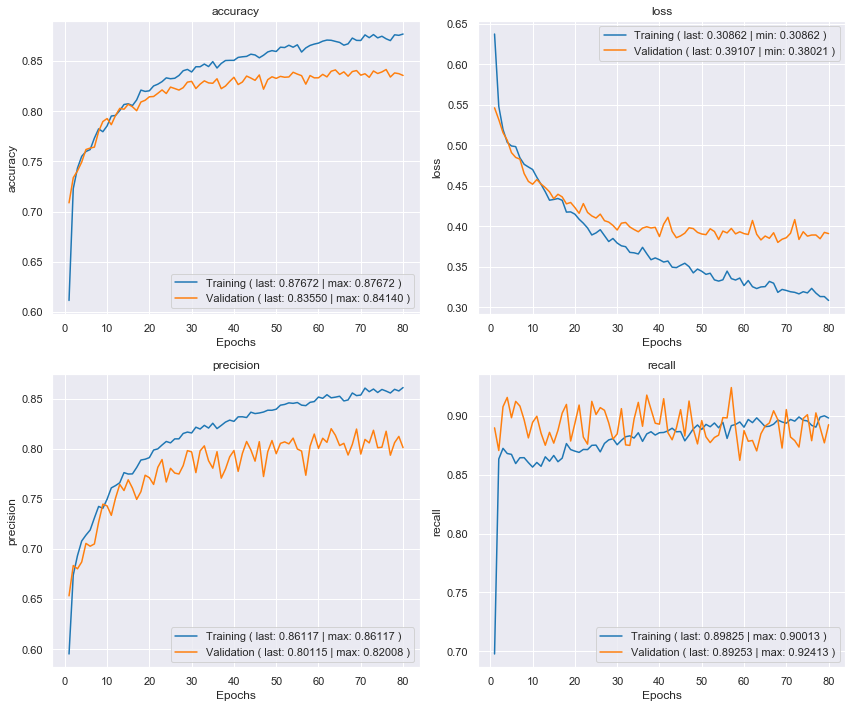

Validation confusion matrix


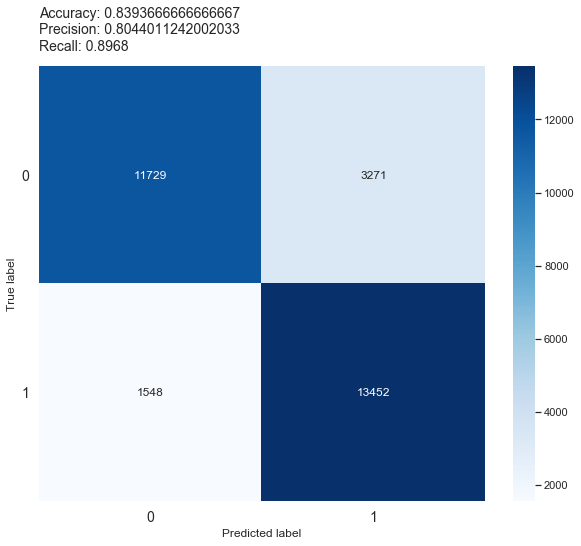

Training time: 1:26:06.719188


In [7]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0.3,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 80,
        'previous_model_folder': '2021-04-01T16-51-10.783182'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-13T18-35-06.587582
1875/1875 [==============================] - 19s 8ms/step - loss: 0.3309 - accuracy: 0.8734 - precision: 0.8319 - recall: 0.9050
val_loss: 0.36710667610168457
Epoch 71/80
500/500 [==============================] - 420s 830ms/step - loss: 0.3004 - accuracy: 0.8816 - precision: 0.8703 - recall: 0.8968 - val_loss: 0.3694 - val_accuracy: 0.8486 - val_precision: 0.8246 - val_recall: 0.8855
Epoch 72/80
500/500 [==============================] - 454s 910ms/step - loss: 0.2957 - accuracy: 0.8811 - precision: 0.8709 - recall: 0.8948 - val_loss: 0.3722 - val_accuracy: 0.8492 - val_precision: 0.8267 - val_recall: 0.8838
Epoch 73/80
500/500 [==============================] - 490s 983ms/step - loss: 0.2941 - accuracy: 0.8844 - precision: 0.8747 - recall: 0.8973 - val_loss: 0.3713 - val_accuracy: 0.8498 - val_precision: 0.8240 - val_recall: 0.8895
Epoch 74/80
500/500 [==============================] - 494s 989ms/step - lo

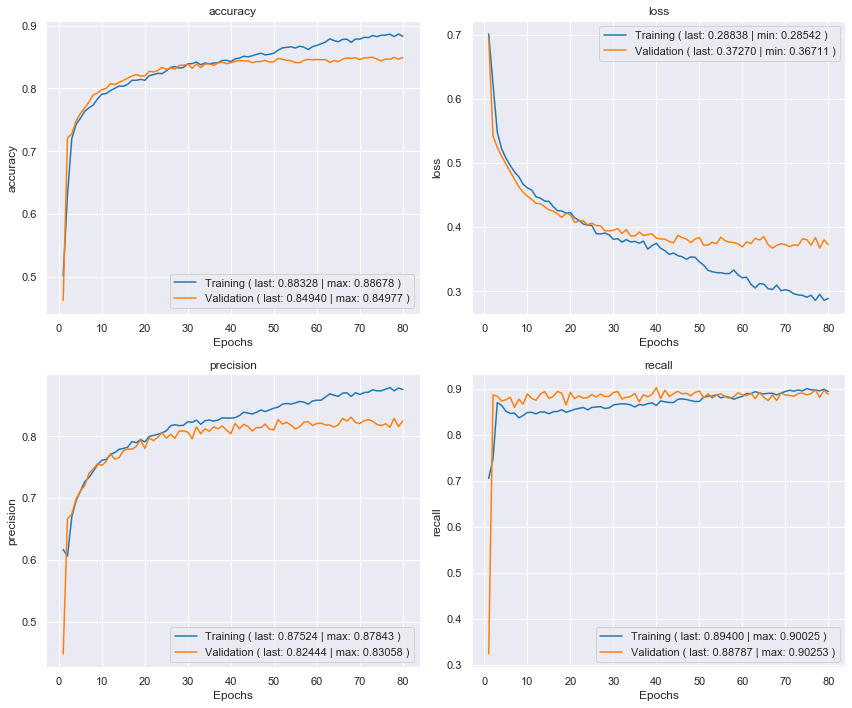

Validation confusion matrix


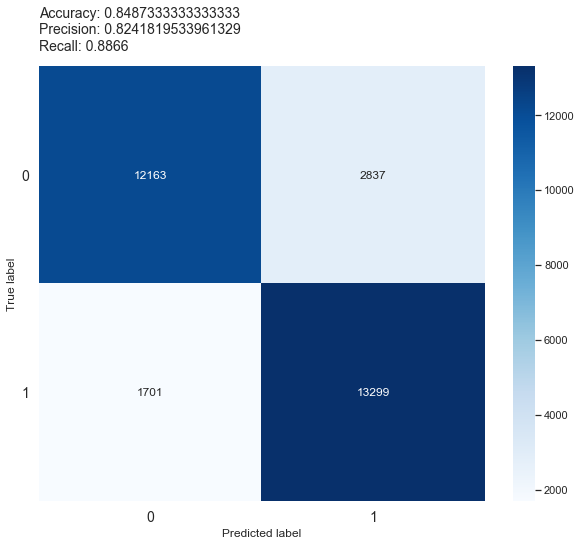

Training time: 1:33:30.441903


In [6]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0.3,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 500,
        'epochs': 80,
        'previous_model_folder': '2021-04-13T18-35-06.587582'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-18T23-39-56.286171
1875/1875 [==============================] - 15s 6ms/step - loss: 0.3224 - accuracy: 0.8779 - precision: 0.8493 - recall: 0.8975
val_loss: 0.3795320987701416
Epoch 91/100
500/500 [==============================] - 398s 791ms/step - loss: 0.2766 - accuracy: 0.8892 - precision: 0.8750 - recall: 0.9080 - val_loss: 0.4011 - val_accuracy: 0.8383 - val_precision: 0.8113 - val_recall: 0.8817
Epoch 92/100
500/500 [==============================] - 387s 776ms/step - loss: 0.2656 - accuracy: 0.8935 - precision: 0.8823 - recall: 0.9082 - val_loss: 0.3903 - val_accuracy: 0.8365 - val_precision: 0.8016 - val_recall: 0.8944
Epoch 93/100
500/500 [==============================] - 387s 775ms/step - loss: 0.2621 - accuracy: 0.8971 - precision: 0.8858 - recall: 0.9118 - val_loss: 0.4029 - val_accuracy: 0.8381 - val_precision: 0.8121 - val_recall: 0.8797
Epoch 94/100
500/500 [==============================] - 387s 775ms/step -

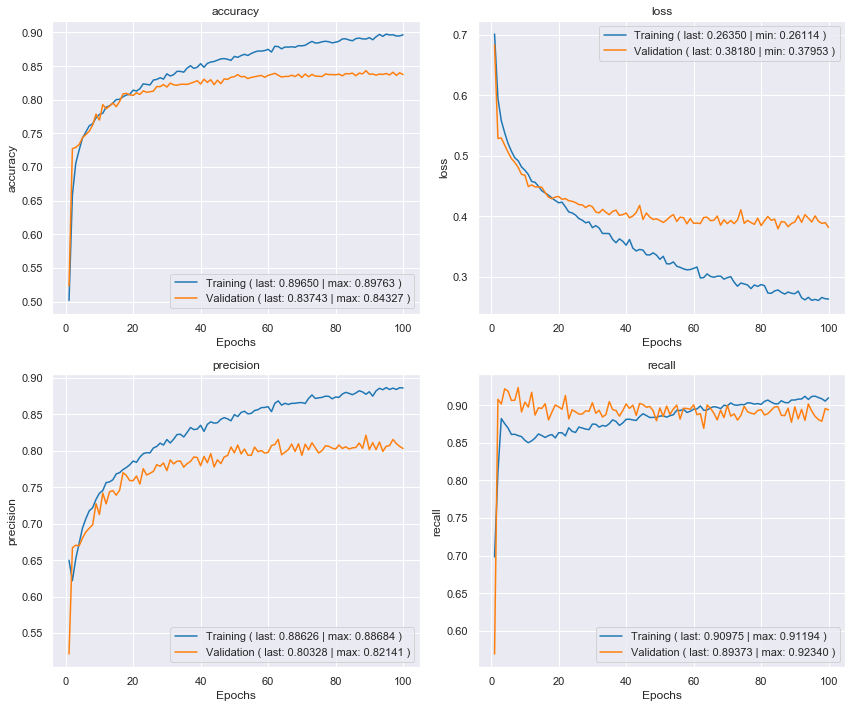

Validation confusion matrix


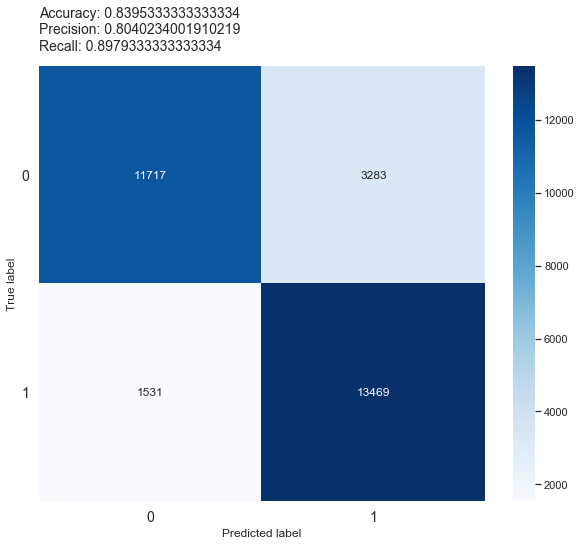

Training time: 1:17:04.776618


In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0.3,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 500,
        'epochs': 100,
        'previous_model_folder': '2021-04-18T23-39-56.286171'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-13T15-58-23.342465
1875/1875 [==============================] - 33s 15ms/step - loss: 0.3535 - accuracy: 0.8840 - precision: 0.8362 - recall: 0.9073 3s - l
val_loss: 0.38367128372192383
Epoch 171/180
500/500 [==============================] - 491s 970ms/step - loss: 0.3286 - accuracy: 0.8670 - precision: 0.8468 - recall: 0.8961 - val_loss: 0.3872 - val_accuracy: 0.8356 - val_precision: 0.8000 - val_recall: 0.8948
Epoch 172/180
500/500 [==============================] - 488s 977ms/step - loss: 0.3222 - accuracy: 0.8675 - precision: 0.8520 - recall: 0.8895 - val_loss: 0.3870 - val_accuracy: 0.8336 - val_precision: 0.7907 - val_recall: 0.9075
Epoch 173/180
500/500 [==============================] - 480s 963ms/step - loss: 0.3151 - accuracy: 0.8713 - precision: 0.8543 - recall: 0.8953 - val_loss: 0.3845 - val_accuracy: 0.8349 - val_precision: 0.7930 - val_recall: 0.9063
Epoch 174/180
500/500 [==============================] - 492s

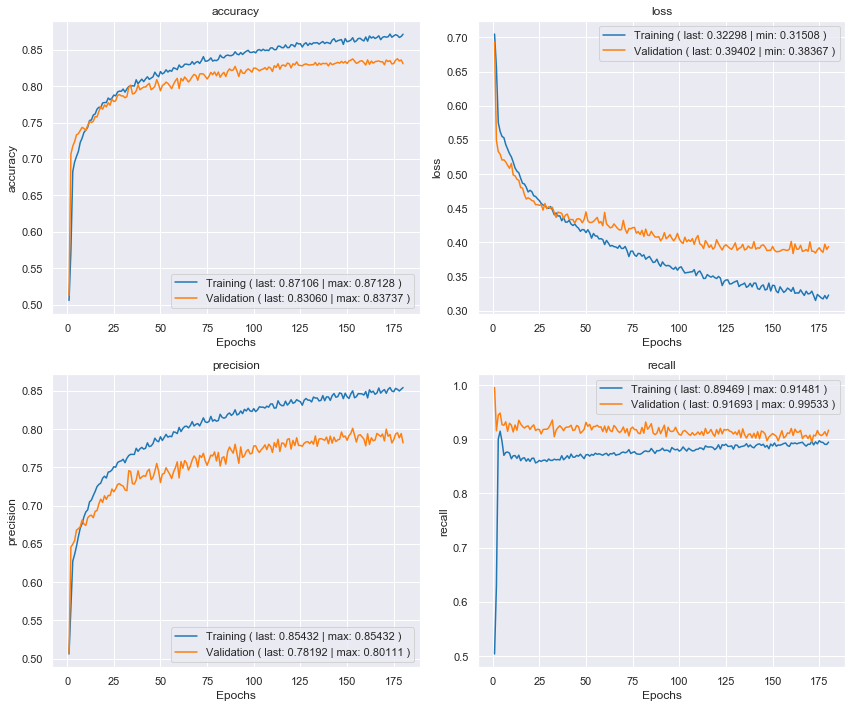

Validation confusion matrix


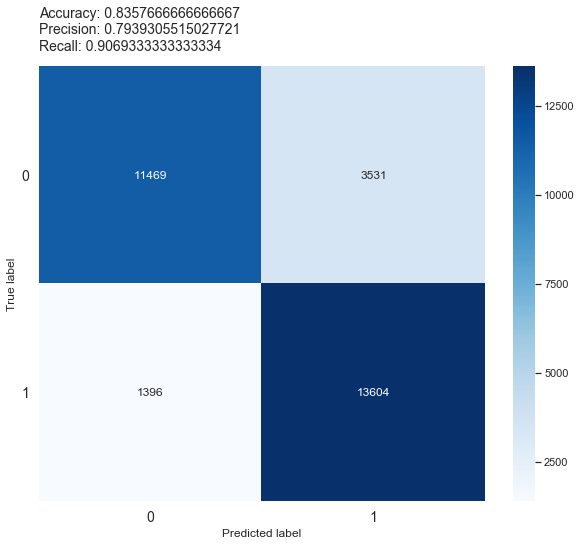

Training time: 1:34:17.574157


In [6]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0.4,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 500,
        'epochs': 180,
        'previous_model_folder': '2021-04-13T15-58-23.342465'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-06T00-39-42.196388
1875/1875 [==============================] - 14s 6ms/step - loss: 0.3302 - accuracy: 0.8725 - precision: 0.8761 - recall: 0.8487
val_loss: 0.41091397404670715
Epoch 71/80
100/100 [==============================] - 317s 3s/step - loss: 0.3056 - accuracy: 0.8758 - precision: 0.8618 - recall: 0.8952 - val_loss: 0.4159 - val_accuracy: 0.8259 - val_precision: 0.7873 - val_recall: 0.8931
Epoch 72/80
100/100 [==============================] - 309s 3s/step - loss: 0.3049 - accuracy: 0.8771 - precision: 0.8652 - recall: 0.8935 - val_loss: 0.4175 - val_accuracy: 0.8223 - val_precision: 0.7842 - val_recall: 0.8893
Epoch 73/80
100/100 [==============================] - 308s 3s/step - loss: 0.2976 - accuracy: 0.8793 - precision: 0.8678 - recall: 0.8950 - val_loss: 0.4128 - val_accuracy: 0.8279 - val_precision: 0.7945 - val_recall: 0.8845
Epoch 74/80
100/100 [==============================] - 307s 3s/step - loss: 0.2926 -

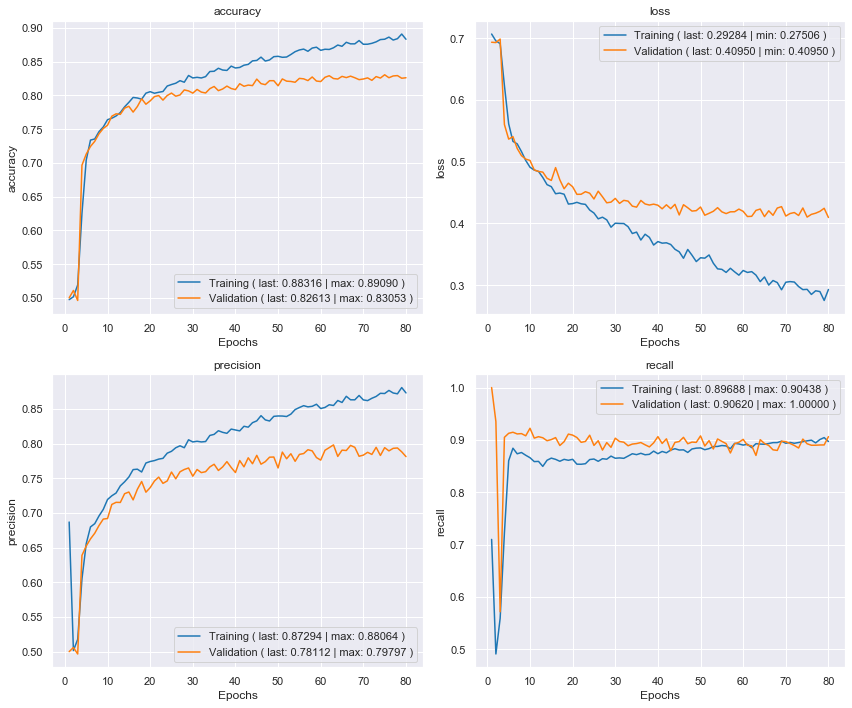

Validation confusion matrix


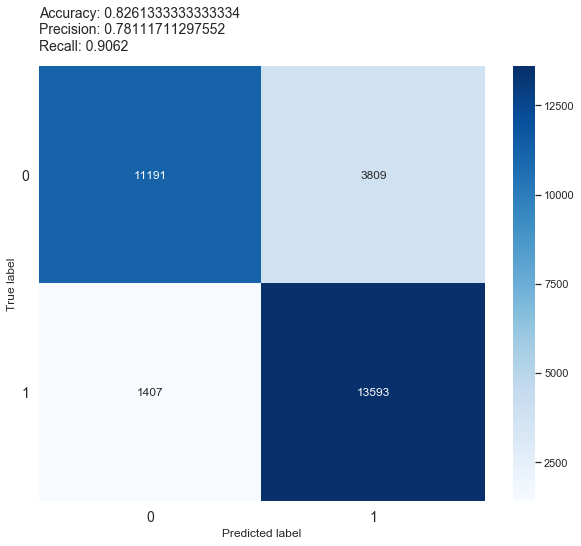

Training time: 1:03:35.924730


In [5]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0.3,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 256,
        'validation_batch_size': 30000,
        'steps_per_epoch': 100,
        'epochs': 80,
        'previous_model_folder': '2021-04-06T00-39-42.196388'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-02T21-34-23.368442
1875/1875 [==============================] - 14s 6ms/step - loss: 0.3169 - accuracy: 0.8890 - precision: 0.8398 - recall: 0.9062
val_loss: 0.3305421471595764
Epoch 71/80
2000/2000 [==============================] - 1635s 817ms/step - loss: 0.2784 - accuracy: 0.8904 - precision: 0.8778 - recall: 0.9071 - val_loss: 0.3375 - val_accuracy: 0.8638 - val_precision: 0.8413 - val_recall: 0.8967
Epoch 72/80
2000/2000 [==============================] - 1934s 967ms/step - loss: 0.2749 - accuracy: 0.8910 - precision: 0.8800 - recall: 0.9054 - val_loss: 0.3314 - val_accuracy: 0.8650 - val_precision: 0.8406 - val_recall: 0.9009
Epoch 73/80
2000/2000 [==============================] - 1796s 899ms/step - loss: 0.2731 - accuracy: 0.8926 - precision: 0.8819 - recall: 0.9065 - val_loss: 0.3316 - val_accuracy: 0.8659 - val_precision: 0.8416 - val_recall: 0.9015
Epoch 74/80
2000/2000 [==============================] - 1585s 793m

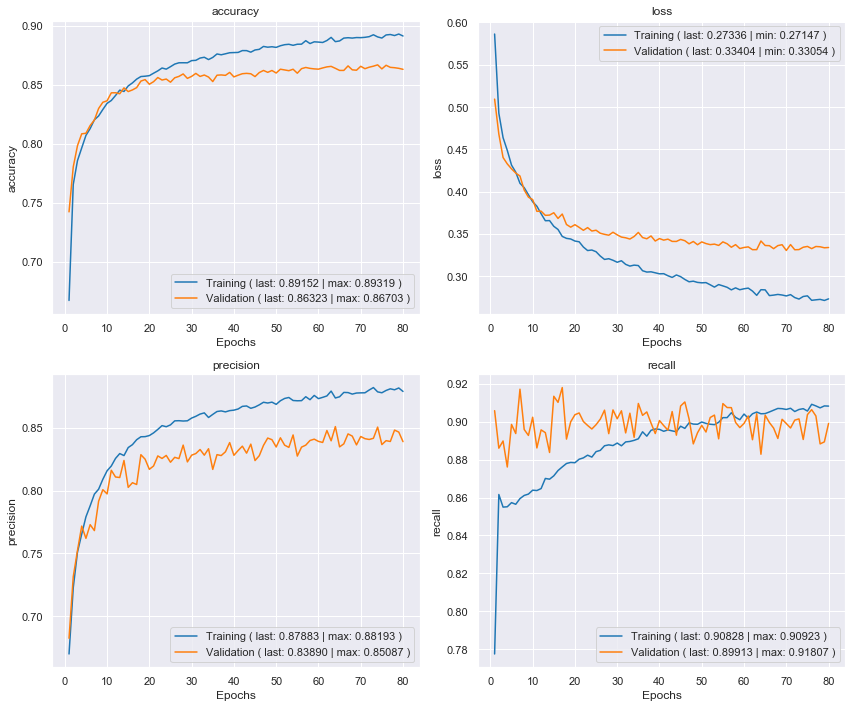

Validation confusion matrix


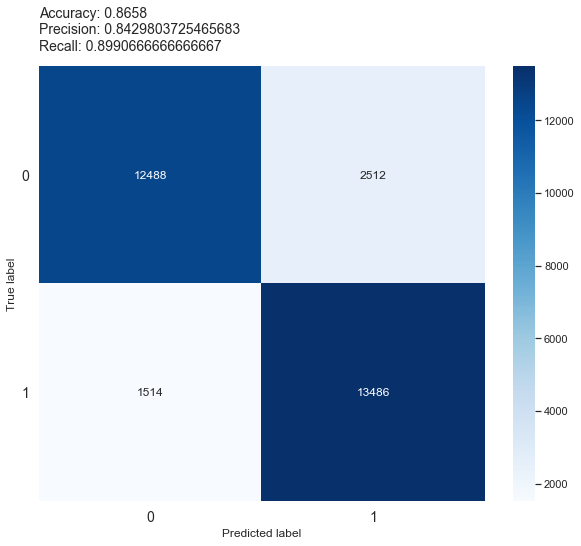

Training time: 5:09:52.418193


In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0.3,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 2000,
        'epochs': 80,
        'previous_model_folder': '2021-04-02T21-34-23.368442'
    }
)

### Regularizer L1

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-12T18-08-39.870219
Epoch 1/10
1600/1600 [==============================] - 343s 212ms/step - loss: 1.1475 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.4112 - val_loss: 0.7298 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00ss: 1.8896  - ETA: 4:09 - loss: 1.7902 - accuracy: 0.5000 - precision: 0.5000 - re - ETA: 4:06 - loss: 1.7712 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.391 - ETA: 4:06 - loss: 1.7696 - accuracy: 0.5000 - prec - ETA: 4:00 - loss: 1.7258 - accuracy: 0.5000 - precision: 0.5000 - re - ETA: 3:57 - loss: 1. - ETA: 16s - lo - ETA: 9s - loss: 1.1564 - accuracy: 0.5000 - precision: 0 - ETA: 4s - loss: 1.1522 - accuracy: 0.5000 - precision
Epoch 2/10
1600/1600 [==============================] - 336s 210ms/step - loss: 0.7294 - accuracy: 0.5000 - precision: 0.4991 - recall: 0.6959 - val_loss: 0.7288 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000racy: 0.5000

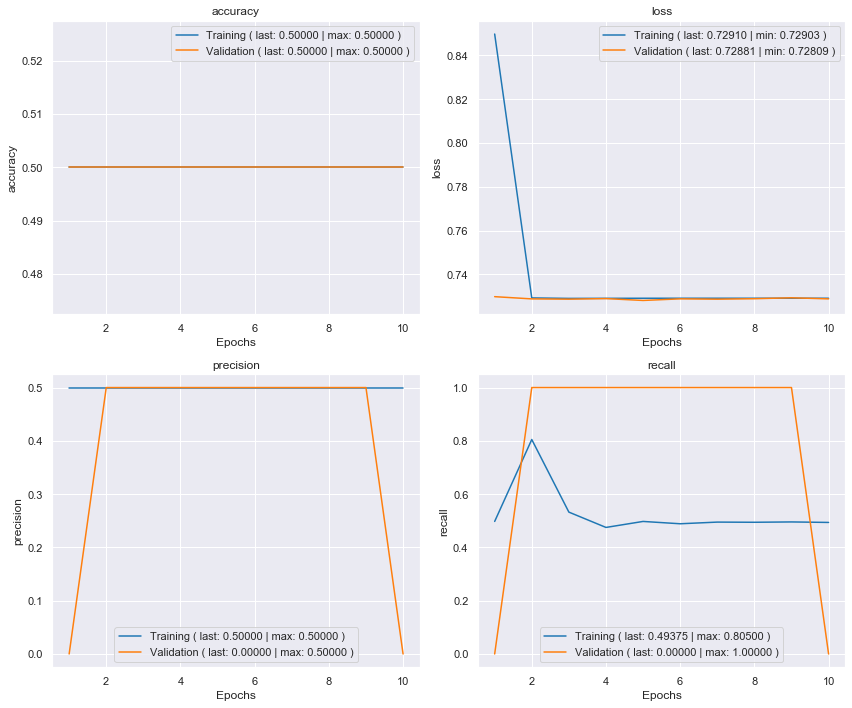

Validation confusion matrix


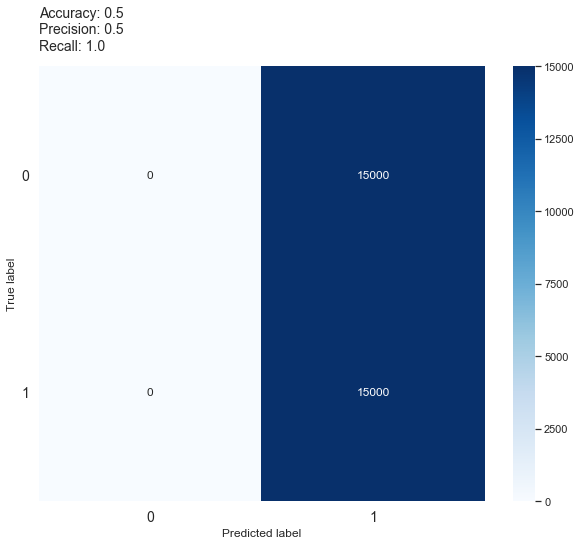

Training time: 1:10:12.993179


In [2]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0.0001,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 1600,
        'epochs': 10,
        'previous_model_folder': '2021-04-12T18-08-39.870219'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-12T19-58-20.241792
Epoch 1/10
1600/1600 [==============================] - 336s 208ms/step - loss: 0.7595 - accuracy: 0.5000 - precision: 0.4997 - recall: 0.1278 - val_loss: 0.7039 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.00007614 - - ETA: 12s - loss: 0.7608 - accuracy: 0.5000 - precision: - ETA: 9s - loss: 0.7606 - accu
Epoch 2/10
1600/1600 [==============================] - 331s 207ms/step - loss: 0.7011 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.5278 - val_loss: 0.6973 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00: 4:20 - loss: 0.7031 - accuracy: 0.5000 - precision: 0 - ETA: 3:09 - loss: 0.7024 - accu - ETA: 2:25 - loss: 0.7020 - accuracy: 0. - ETA: 31s - loss: 0.7013 - accuracy: 0.5000 - precision: 0.5000 - recall:  - ETA: 22s - loss: 0.7012  - ETA: 7s - loss: 0.7011 - accuracy: 0.50
Epoch 3/10
1600/1600 [==============================] - 332s 207ms/step - loss: 0

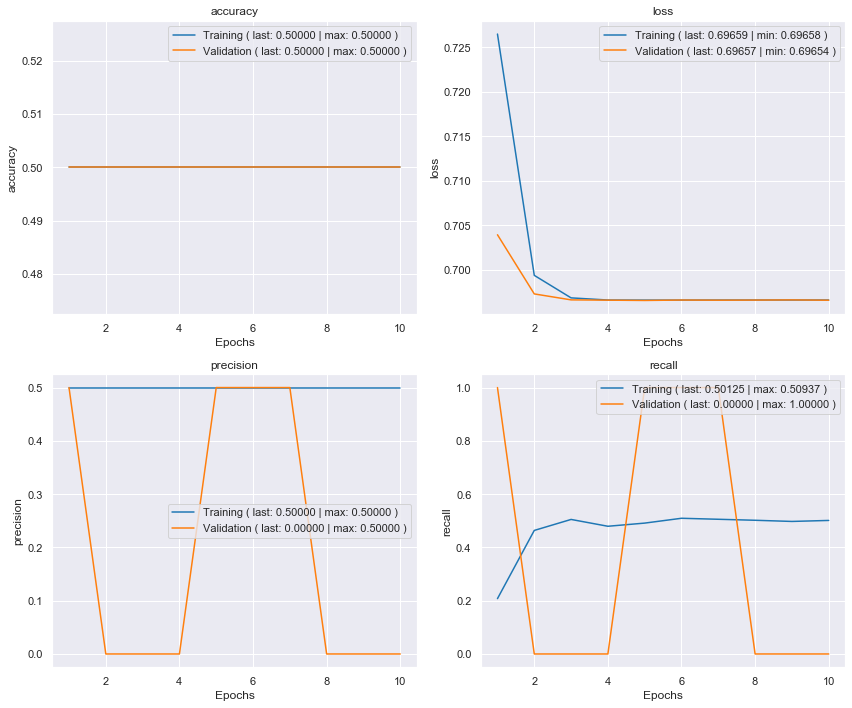

Validation confusion matrix


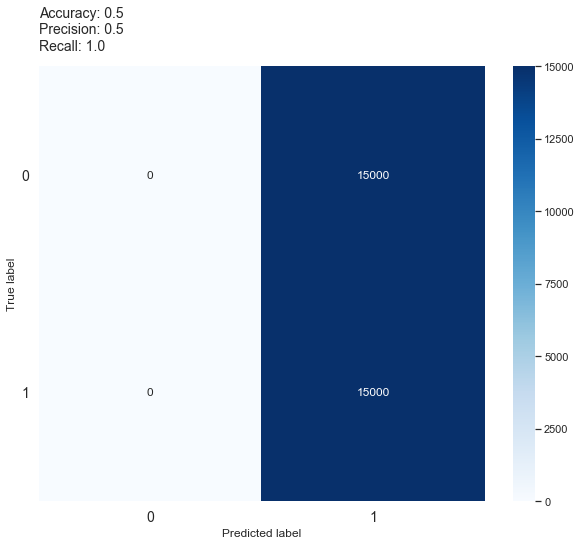

Training time: 1:07:35.690408


In [3]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0.00001,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 1600,
        'epochs': 10,
        'previous_model_folder': '2021-04-12T19-58-20.241792'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-13T00-01-08.298278
1875/1875 [==============================] - 31s 14ms/step - loss: 0.4824 - accuracy: 0.8213 - precision: 0.8472 - recall: 0.8425 3s - loss: 0.4796
val_loss: 0.5035879611968994
Epoch 11/20
1600/1600 [==============================] - 424s 262ms/step - loss: 0.4364 - accuracy: 0.8406 - precision: 0.8243 - recall: 0.8657 - val_loss: 0.4952 - val_accuracy: 0.8159 - val_precision: 0.7889 - val_recall: 0.8627
Epoch 12/20
1600/1600 [==============================] - 428s 268ms/step - loss: 0.4383 - accuracy: 0.8478 - precision: 0.8308 - recall: 0.8735 - val_loss: 0.5287 - val_accuracy: 0.8162 - val_precision: 0.7865 - val_recall: 0.8681
Epoch 13/20
1600/1600 [==============================] - 435s 272ms/step - loss: 0.4220 - accuracy: 0.8556 - precision: 0.8419 - recall: 0.8755 - val_loss: 0.5018 - val_accuracy: 0.8213 - val_precision: 0.7998 - val_recall: 0.8573
Epoch 14/20
1600/1600 [============================

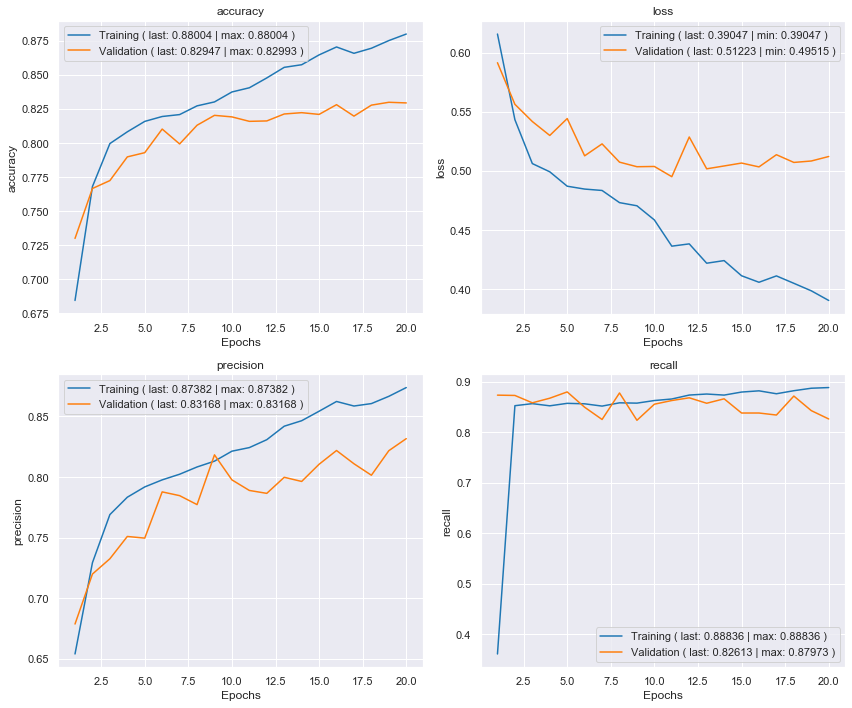

Validation confusion matrix


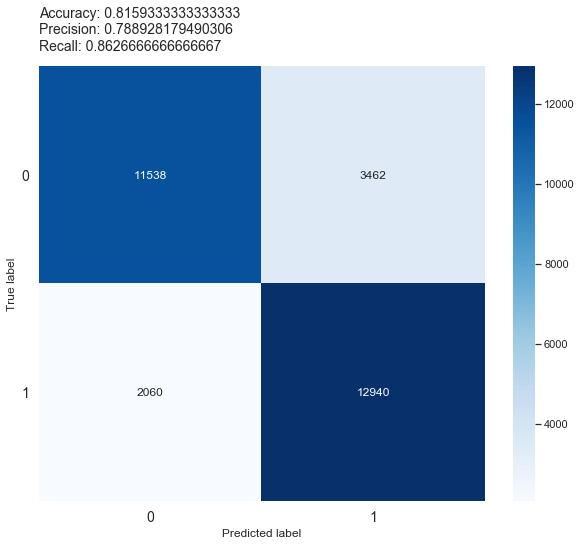

Training time: 1:21:37.855372


In [5]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0.000001,
            'regularizer_l2_rate': 0
        },
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 1600,
        'epochs': 20,
        'previous_model_folder': '2021-04-13T00-01-08.298278'
    }
)

### Regularizer L2

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-09T17-32-22.165569
1875/1875 [==============================] - 14s 6ms/step - loss: 0.3902 - accuracy: 0.8493 - precision: 0.8589 - recall: 0.8582
val_loss: 0.4219861924648285
Epoch 11/20
1600/1600 [==============================] - 338s 209ms/step - loss: 0.3580 - accuracy: 0.8583 - precision: 0.8460 - recall: 0.8761 - val_loss: 0.4235 - val_accuracy: 0.8266 - val_precision: 0.8025 - val_recall: 0.8666
Epoch 12/20
1600/1600 [==============================] - 336s 210ms/step - loss: 0.3530 - accuracy: 0.8643 - precision: 0.8526 - recall: 0.8808 - val_loss: 0.4530 - val_accuracy: 0.8272 - val_precision: 0.8163 - val_recall: 0.8444
Epoch 13/20
1600/1600 [==============================] - 337s 211ms/step - loss: 0.3326 - accuracy: 0.8737 - precision: 0.8616 - recall: 0.8904 - val_loss: 0.4496 - val_accuracy: 0.8217 - val_precision: 0.8158 - val_recall: 0.831037 - a - ETA: 29s - loss: 0.3335 - accuracy: 0.8 - ETA: 25s - loss: 0.3

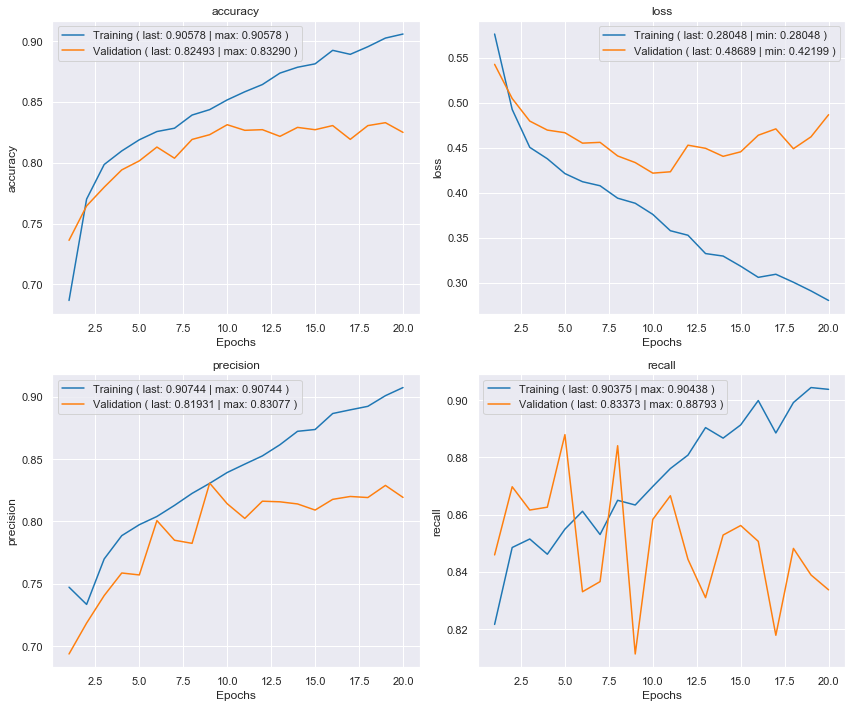

Validation confusion matrix


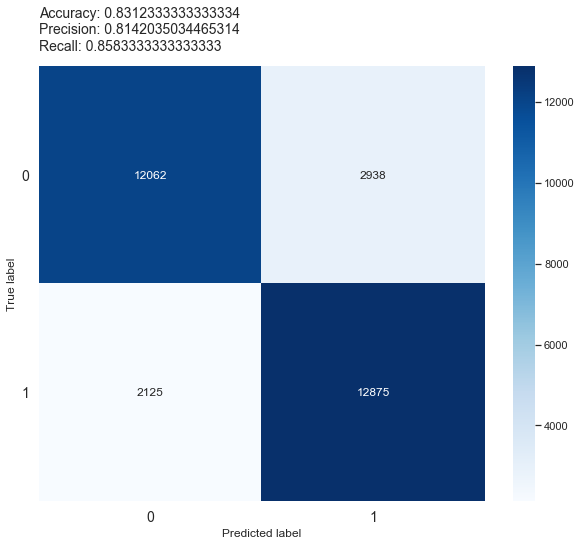

Training time: 1:08:40.515421


In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.000001
        },
        'vocabulary_size': 10000,
        'training_batch_size': 16,
        'validation_batch_size': 30000,
        'steps_per_epoch': 1600,
        'epochs': 20,
        'previous_model_folder': '2021-04-09T17-32-22.165569'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-08T19-39-14.350974
1875/1875 [==============================] - 17s 6ms/step - loss: 0.3814 - accuracy: 0.8550 - precision: 0.9530 - recall: 0.8622
val_loss: 0.3979196846485138
Epoch 21/30
400/400 [==============================] - 323s 801ms/step - loss: 0.3302 - accuracy: 0.8709 - precision: 0.8597 - recall: 0.8863 - val_loss: 0.4119 - val_accuracy: 0.8330 - val_precision: 0.8329 - val_recall: 0.8331
Epoch 22/30
400/400 [==============================] - 316s 792ms/step - loss: 0.3189 - accuracy: 0.8767 - precision: 0.8640 - recall: 0.8941 - val_loss: 0.4177 - val_accuracy: 0.8314 - val_precision: 0.8456 - val_recall: 0.8109
Epoch 23/30
400/400 [==============================] - 319s 800ms/step - loss: 0.3060 - accuracy: 0.8833 - precision: 0.8773 - recall: 0.8913 - val_loss: 0.4157 - val_accuracy: 0.8356 - val_precision: 0.8252 - val_recall: 0.8517
Epoch 24/30
400/400 [==============================] - 317s 794ms/step - los

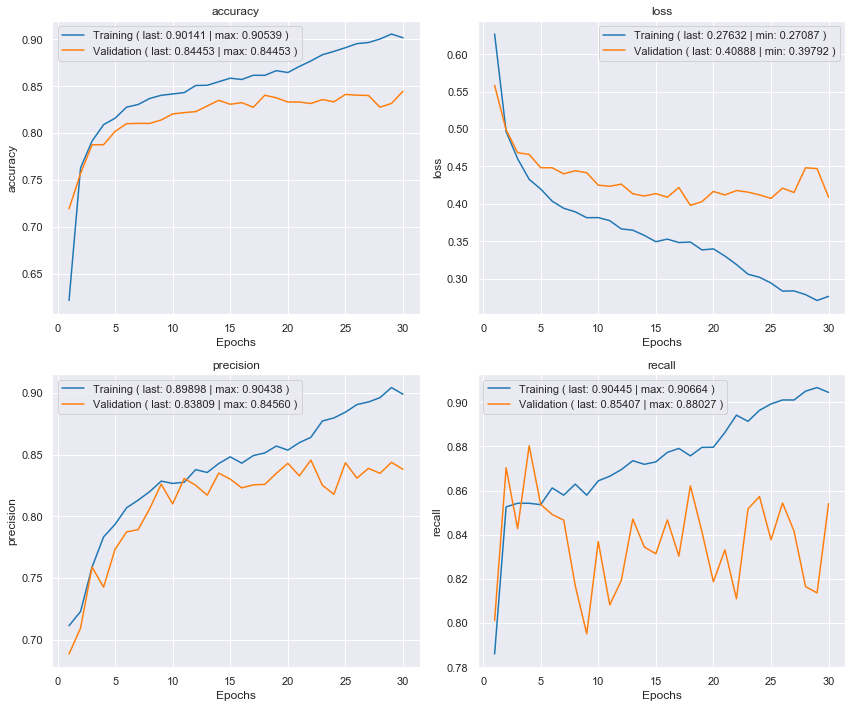

Validation confusion matrix


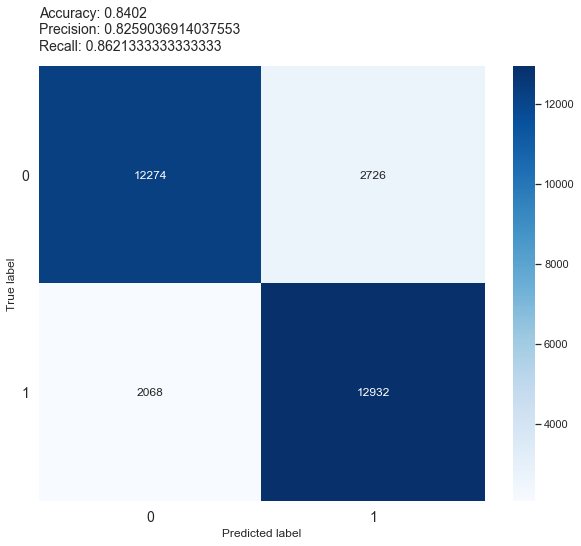

Training time: 1:05:31.328162


In [2]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.000001
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 400,
        'epochs': 30,
        'previous_model_folder': '2021-04-08T19-39-14.350974'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-09T23-47-16.620340
1875/1875 [==============================] - 17s 6ms/step - loss: 0.4127 - accuracy: 0.8430 - precision: 0.9446 - recall: 0.8544
val_loss: 0.4311164319515228
Epoch 21/30
100/100 [==============================] - 325s 3s/step - loss: 0.2638 - accuracy: 0.9007 - precision: 0.8955 - recall: 0.9073 - val_loss: 0.5038 - val_accuracy: 0.8099 - val_precision: 0.7848 - val_recall: 0.8540
Epoch 22/30
100/100 [==============================] - 320s 3s/step - loss: 0.2549 - accuracy: 0.9072 - precision: 0.9014 - recall: 0.9145 - val_loss: 0.4724 - val_accuracy: 0.8119 - val_precision: 0.8091 - val_recall: 0.8163
Epoch 23/30
100/100 [==============================] - 338s 3s/step - loss: 0.2306 - accuracy: 0.9154 - precision: 0.9101 - recall: 0.9219 - val_loss: 0.5080 - val_accuracy: 0.8091 - val_precision: 0.8137 - val_recall: 0.8017
Epoch 24/30
100/100 [==============================] - 348s 4s/step - loss: 0.2014 - 

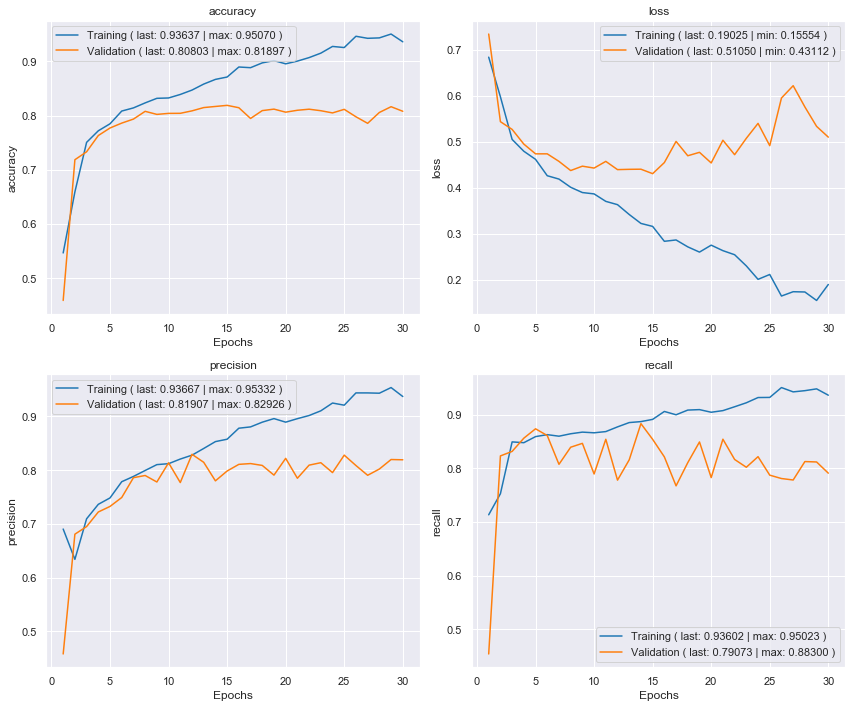

Validation confusion matrix


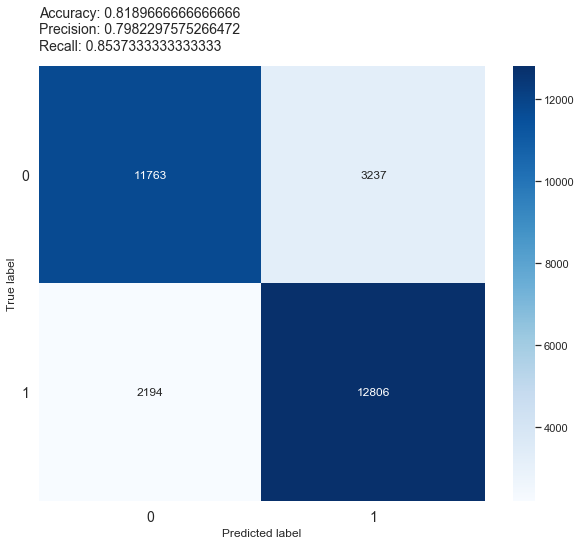

Training time: 1:13:12.667488


In [2]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.000001
        },
        'vocabulary_size': 10000,
        'training_batch_size': 256,
        'validation_batch_size': 30000,
        'steps_per_epoch': 100,
        'epochs': 30,
        'previous_model_folder': '2021-04-09T23-47-16.620340'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-10T17-59-44.147444
1875/1875 [==============================] - 15s 6ms/step - loss: 0.4215 - accuracy: 0.8472 - precision: 0.8413 - recall: 0.8630
val_loss: 0.4567570686340332
Epoch 11/20
400/400 [==============================] - 323s 801ms/step - loss: 0.4012 - accuracy: 0.8404 - precision: 0.8222 - recall: 0.8686 - val_loss: 0.4527 - val_accuracy: 0.8170 - val_precision: 0.7906 - val_recall: 0.8623
Epoch 12/20
400/400 [==============================] - 316s 792ms/step - loss: 0.3873 - accuracy: 0.8524 - precision: 0.8340 - recall: 0.8798 - val_loss: 0.4680 - val_accuracy: 0.8145 - val_precision: 0.8096 - val_recall: 0.8225
Epoch 13/20
400/400 [==============================] - 317s 795ms/step - loss: 0.3785 - accuracy: 0.8574 - precision: 0.8437 - recall: 0.8773 - val_loss: 0.4688 - val_accuracy: 0.8183 - val_precision: 0.7976 - val_recall: 0.8532
Epoch 14/20
400/400 [==============================] - 317s 795ms/step - los

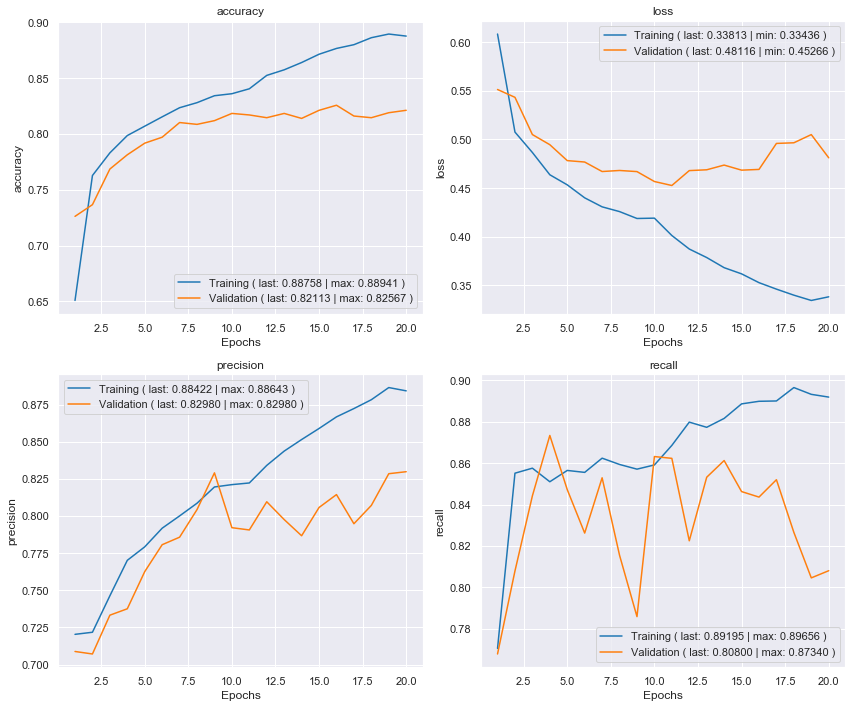

Validation confusion matrix


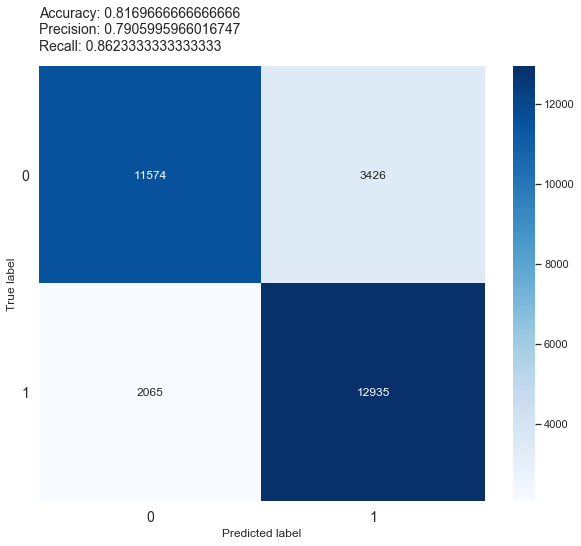

Training time: 1:05:30.092524


In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.000005
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 400,
        'epochs': 20,
        'previous_model_folder': '2021-04-10T17-59-44.147444'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-10T23-54-22.907264
1875/1875 [==============================] - 20s 9ms/step - loss: 0.4521 - accuracy: 0.8424 - precision: 0.8459 - recall: 0.8552
val_loss: 0.46659159660339355
Epoch 11/20
400/400 [==============================] - 327s 812ms/step - loss: 0.4162 - accuracy: 0.8409 - precision: 0.8219 - recall: 0.8705 - val_loss: 0.4669 - val_accuracy: 0.8135 - val_precision: 0.7940 - val_recall: 0.8467
Epoch 12/20
400/400 [==============================] - 331s 830ms/step - loss: 0.4073 - accuracy: 0.8438 - precision: 0.8236 - recall: 0.8748 - val_loss: 0.4829 - val_accuracy: 0.8099 - val_precision: 0.8055 - val_recall: 0.8170
Epoch 13/20
400/400 [==============================] - 328s 822ms/step - loss: 0.3960 - accuracy: 0.8531 - precision: 0.8355 - recall: 0.8793 - val_loss: 0.4827 - val_accuracy: 0.8171 - val_precision: 0.7956 - val_recall: 0.8534
Epoch 14/20
400/400 [==============================] - 324s 811ms/step - lo

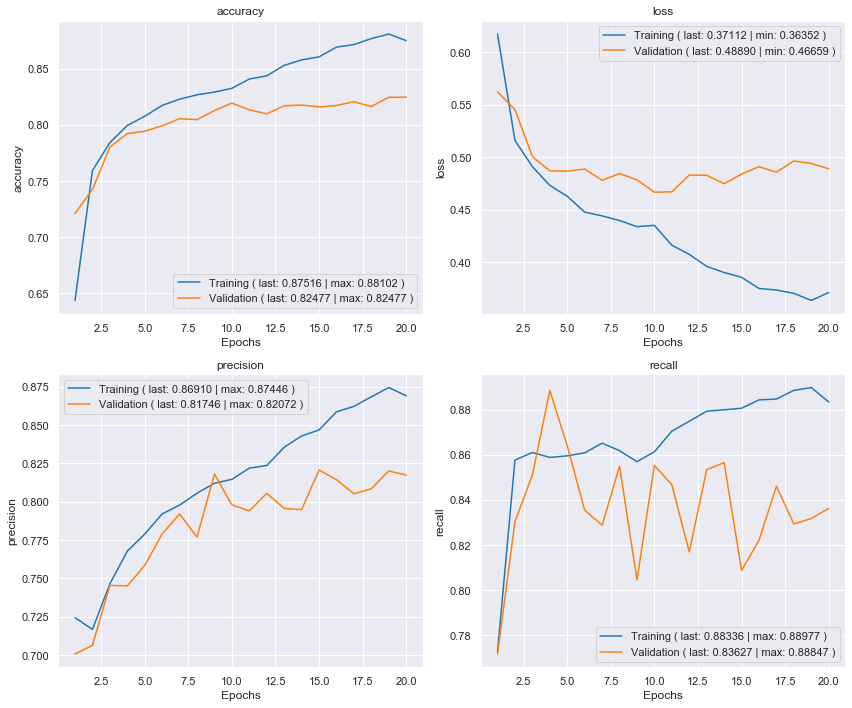

Validation confusion matrix


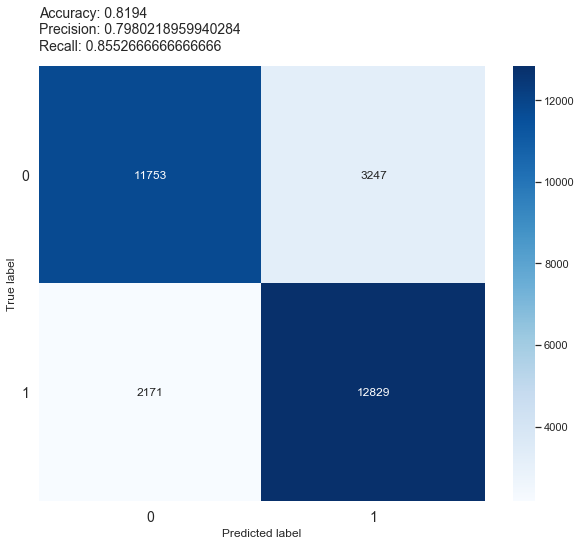

Training time: 1:09:29.727294


In [6]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.00001
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 400,
        'epochs': 20,
        'previous_model_folder': '2021-04-10T23-54-22.907264'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-11T17-12-34.804366
1875/1875 [==============================] - 15s 6ms/step - loss: 0.4624 - accuracy: 0.8459 - precision: 0.8351 - recall: 0.8599
val_loss: 0.506110668182373
Epoch 21/30
400/400 [==============================] - 318s 789ms/step - loss: 0.4330 - accuracy: 0.8470 - precision: 0.8310 - recall: 0.8711 - val_loss: 0.5356 - val_accuracy: 0.7952 - val_precision: 0.7815 - val_recall: 0.8197
Epoch 22/30
400/400 [==============================] - 312s 782ms/step - loss: 0.4370 - accuracy: 0.8445 - precision: 0.8260 - recall: 0.8730 - val_loss: 0.5195 - val_accuracy: 0.8039 - val_precision: 0.7888 - val_recall: 0.8301
Epoch 23/30
400/400 [==============================] - 311s 779ms/step - loss: 0.4319 - accuracy: 0.8507 - precision: 0.8344 - recall: 0.8752 - val_loss: 0.5337 - val_accuracy: 0.8018 - val_precision: 0.7913 - val_recall: 0.8199
Epoch 24/30
400/400 [==============================] - 312s 782ms/step - loss

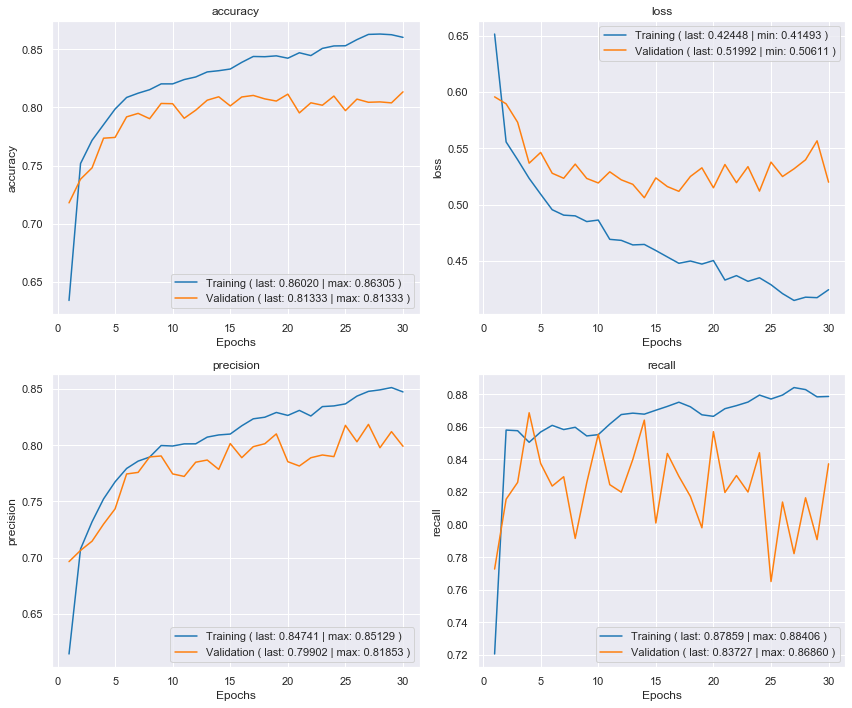

Validation confusion matrix


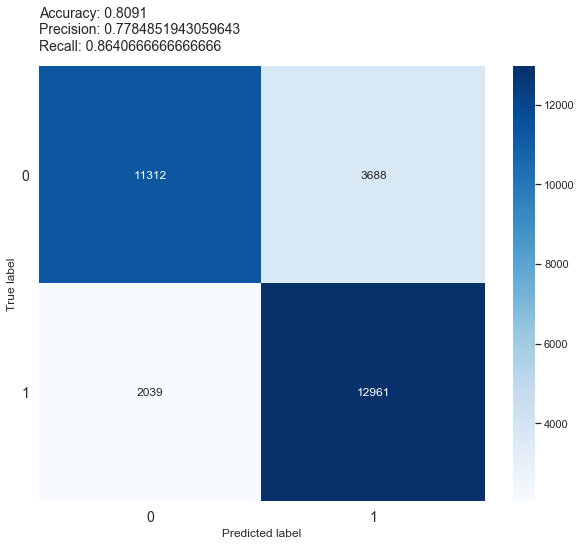

Training time: 1:04:34.461717


In [4]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.00005
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 400,
        'epochs': 30,
        'previous_model_folder': '2021-04-11T17-12-34.804366'
    }
)

C:\Users\Gamer/Desktop/AI/Jurisprudence/STJ/Results/2021-04-13T03-53-52.999816
Epoch 1/10
400/400 [==============================] - 364s 886ms/step - loss: 0.7507 - accuracy: 0.5008 - precision: 0.7540 - recall: 0.7041 - val_loss: 0.7085 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/10
400/400 [==============================] - 333s 835ms/step - loss: 0.7066 - accuracy: 0.5000 - precision: 0.4913 - recall: 0.1080 - val_loss: 0.7019 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 3/10
400/400 [==============================] - 330s 828ms/step - loss: 0.7008 - accuracy: 0.5000 - precision: 0.4975 - recall: 0.1923 - val_loss: 0.6981 - val_accuracy: 0.5000 - val_precision: 0.5000 - val_recall: 1.0000
Epoch 4/10
400/400 [==============================] - 330s 827ms/step - loss: 0.6975 - accuracy: 0.5000 - precision: 0.5000 - recall: 0.1603 - val_loss: 0.6959 - val_accuracy: 0.5000 - val_precision: 0.0000e+00 - val_reca

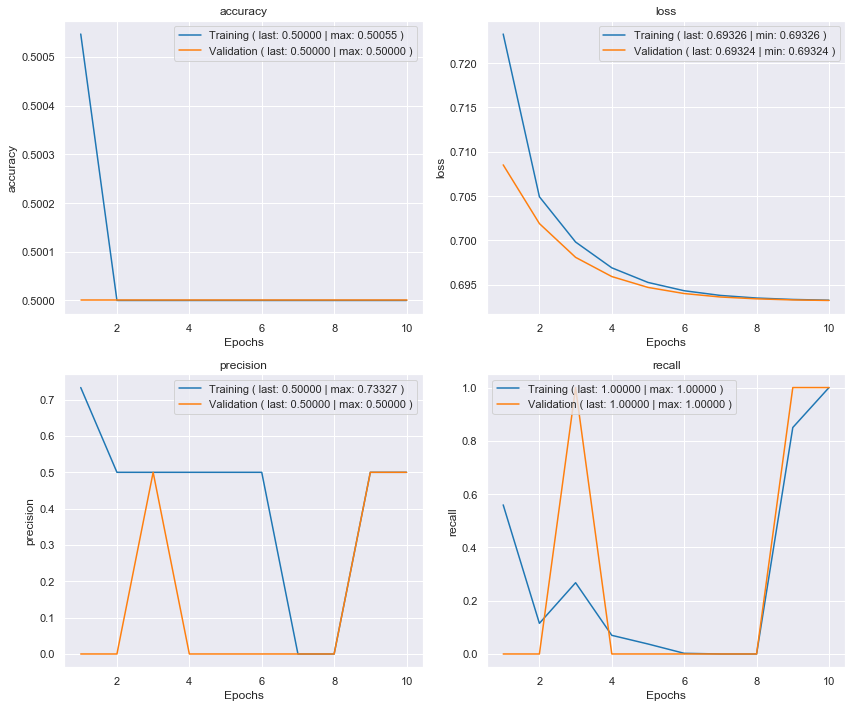

Validation confusion matrix


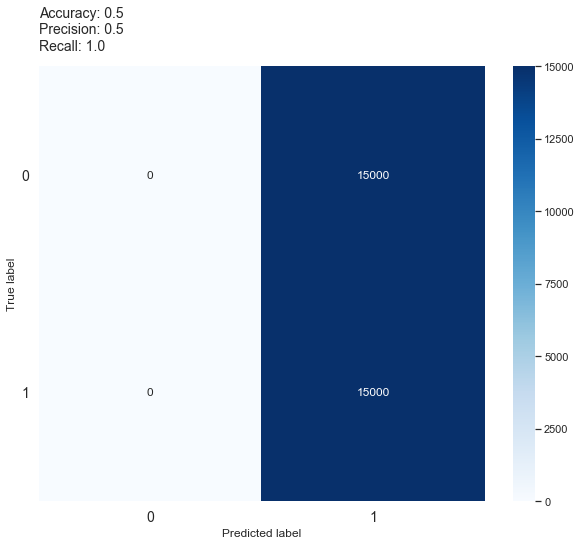

Training time: 1:11:30.886155


In [6]:
run_experiment(
    data_path = data_path,
    parameters = {
        'text_processing_type': 'clean_report_without_nltk_stopwords',
        'representation_type': 'TF-IDF',
        'type': 'SNN + MLP',
        'snn_output_type': 'MLP',
        'regularization': {
            'dropout_rate': 0,
            'regularizer_l1_rate': 0,
            'regularizer_l2_rate': 0.0001
        },
        'vocabulary_size': 10000,
        'training_batch_size': 64,
        'validation_batch_size': 30000,
        'steps_per_epoch': 400,
        'epochs': 10,
        'previous_model_folder': '2021-04-13T03-53-52.999816'
    }
)

### Test

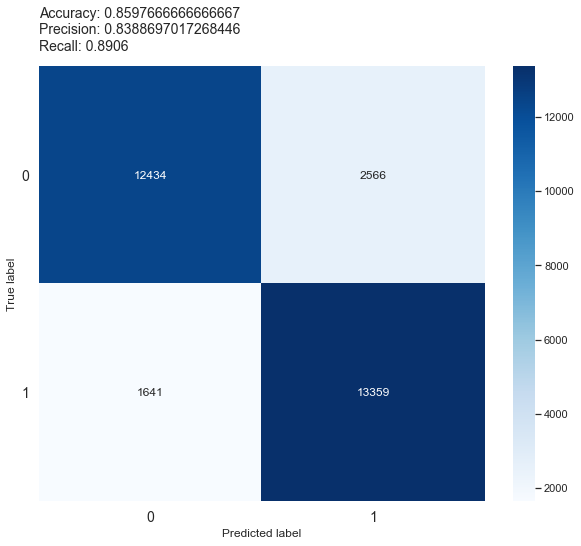

In [2]:
run_test(
    data_path = data_path,
    folder_name = '2021-04-02T21-34-23.368442',
    test_batch_size = 30000
)